# Initialization

In [1]:
%load_ext autoreload
%autoreload 2

%matplotlib inline
%config InlineBackend.figure_formats = ['svg']
#import matplotlib as mpl
#mpl.rcParams['figure.dpi']= 300
import matplotlib.pyplot as plt
%run ../PyModules/exporter.py

import numpy as np
import sys
sys.path.insert(0, './../')

from PyModules.utilities import do_async, integer_hill_climb, wait
import time
    
import datetime
print('Last Updated On: ', datetime.datetime.now())

from PyModules.paula import PAULA
paula = PAULA(N = 13, Nexpp_coarse=70, Nexpp_fine=140, counter_level=[2., 7.5, 15., 30.], 
              results_path='/home/qsim/Results/tiamo4.sync', cache_path='./data/', do_plot=True, do_live=False, dark=False)

paula.switch_to_pmt(1)
paula.close_exp_port(0)
paula.close_loading_port(1)
        
fluo_bright = paula.check_ion();
paula.count_ions();
ips=paula.get_all_ips();

Last Updated On:  2020-06-09 10:33:15.137925
socket connecting to /tmp/socket-eios-cmd
socket connecting to /tmp/socket-eios-data
BDx cts: 4.732


# Sanbox 

# Load ion

In [21]:
paula.switch_to_pmt(1)

In [28]:
#paula.ion_report()
paula.check_photo_freq()
paula.print_laser_level()
paula.print_drive_rf_level()
paula.count_ions(verbose=True);

--------------------------
Check Photo wavelength:
--------------------------
Photo freq. (THz): 525.40562
Photo det. (MHz): 128.7
--------------------------
--------------------------
UV laser pwr level (a.u.):
--------------------------
BD port #4: 0%
RD: 0%
Photo: 49%
--------------------------
--------------------------
Trap drive pwr level (a.u.):
--------------------------
Main line refl.:  0.0
Pick up (oven):  0.0
--------------------------
Counted 0 ion(s) (BDX cnt 0.04)!


In [3]:
#paula.op_rf_freq()

In [29]:
#paula.kill_ions()
paula.load_ions(N=1,t_heat=45.,timeout=300);

----------------------------------
Try loading 1 ion(s)
2020-06-09 10:27:12.637300
Please wait...
---------------------------------- 

--------------------------
Check Photo wavelength:
--------------------------
Photo freq. (THz): 525.40562
Photo det. (MHz): 128.7
--------------------------
Switch to pmt


Oven on: pre-heat
45.0



Successfully loaded 1 ions!
Oven off!?
Close loading port
End session: 2020-06-09-10-27-12
----------------------------------
Done. Seq. took (hours:min:sec):
0:04:26.178349
---------------------------------- 



# Check/opt. ion positions and BD beam

In [30]:
#paula.switch_to_pmt(1)

#paula.set('t_det',50.)
paula.set_shim('ExExpZ', 0.0)
paula.set_shim('EyExpZ', 0.0)
paula.set_shim('EzExpZ', 0.0)
paula.check_ion()

BDx cts: 4.648


4.648

----------------------------------
Check ion position: update? True
2020-06-09 10:31:45.147610
Please wait...
---------------------------------- 

___Set comp. fields___
select wvf #4: width 0.18 µs (offset 0.423, amp 0.000)


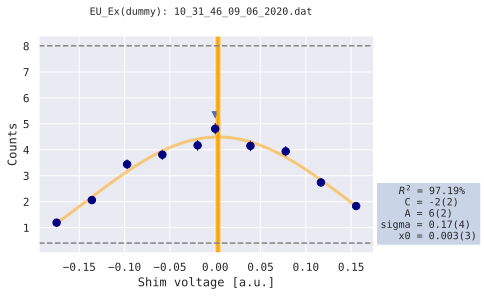

Update shim ExExpZ: 0.003000 (0.000000 [])


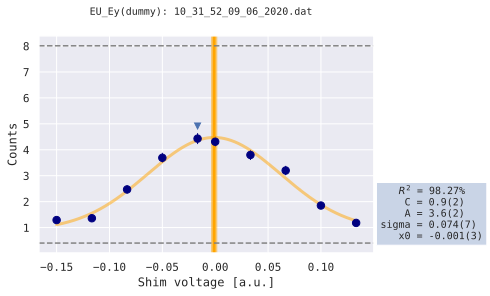

Update shim EyExpZ: -0.001000 (0.000000 [])


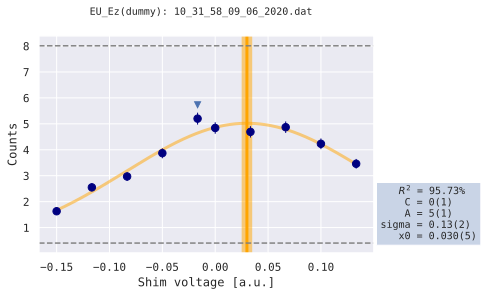

Update shim EzExpZ: 0.030000 (0.000000 [])
BDx cts: 4.868
End session: 2020-06-09-10-31-45
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:19.283001
---------------------------------- 



In [31]:
paula.do_plot = True
#paula.set_shim('ExExpZ', 0.1)
paula.check_ion_pos(amp=0.0, deltaX=.35, deltaY=.3, deltaZ=.3, itera=1);
#paula.check_ion_pos(amp=1.065, deltaX=.1, deltaY=.1, deltaZ=.3, itera=1);
#paula.check_ion_pos_fine(amp=.9, deltaX=100, deltaY=100, deltaZ=300, itera=1);

----------------------------------
Optimize BD
2020-06-09 10:32:04.480857
Please wait...
---------------------------------- 



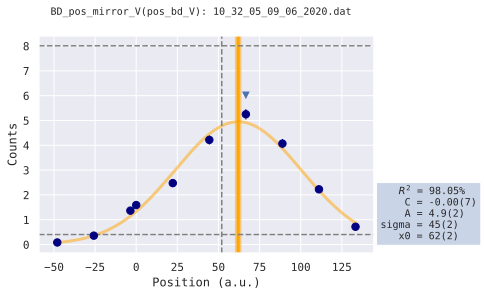

	set pos_bd_V = 62.0 [prev. 52.0 (2020-06-09 07:47:23)]	 fit OK

Mirror #2 position: 62.000000 +- 2.000000


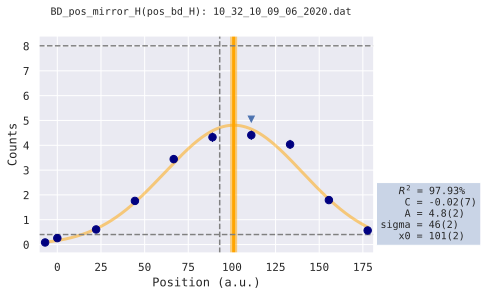

	set pos_bd_H = 101.0 [prev. 93.0 (2020-06-09 07:47:19)]	 fit OK

Mirror #3 position: 101.000000 +- 2.000000


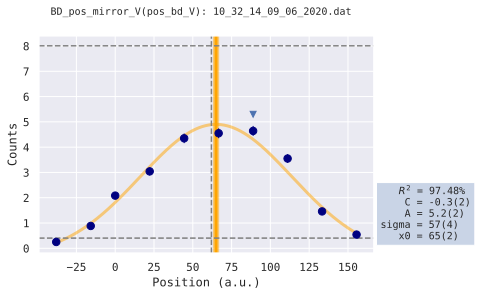

	set pos_bd_V = 65.0 [prev. 62.0 (2020-06-09 10:32:08)]	 fit OK

Mirror #2 position: 65.000000 +- 2.000000
BDx cts: 4.6
End session: 2020-06-09-10-32-04
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:14.798453
---------------------------------- 



In [32]:
paula.op_bd(delta_v=200, delta_h=200)

In [26]:
#check_script = 'BDX'
#name, data = paula.run(check_script, live_plots_flag=True);
#paula.plot_data(data, name);

# Check microwave transitions

----------------------------------
MW transitions 0
2020-06-09 10:32:23.629307
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.957952, stop 1775.196048, 
	points 11, experiment/point 60 rnd 1 show 0
	10_32_24_09_06_2020.dat [2fc55]
	duration 3.24s


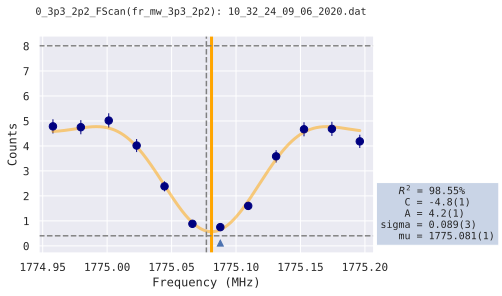

	set fr_mw_3p3_2p2 = 1775.081 [prev. 1775.077 (2020-06-09 09:42:43)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 39.375000, 
	points 19, experiment/point 60 rnd 0 show 0
	10_32_29_09_06_2020.dat [d095d]
	duration 5.53s


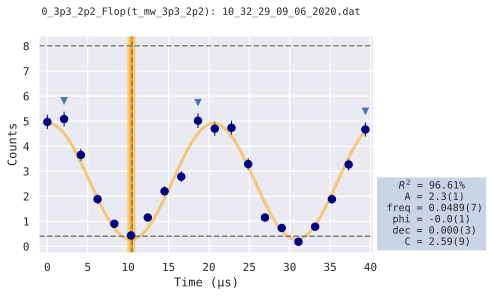

	set t_mw_3p3_2p2 = 10.4 [prev. 10.5 (2020-06-09 09:42:50)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.568226, stop 1780.622574, 
	points 11, experiment/point 60 rnd 1 show 0
	10_32_36_09_06_2020.dat [910e8]
	duration 3.43s


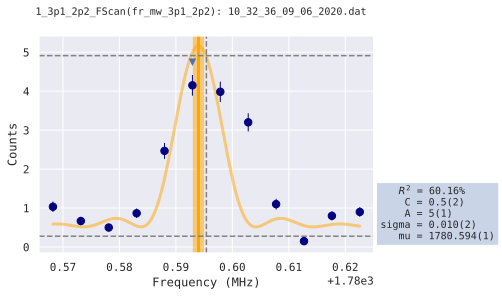

	    fr_mw_3p1_2p2 = 1780.594 	 fit failed, not set

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 172.500000, 
	points 17, experiment/point 60 rnd 1 show 0
	10_32_41_09_06_2020.dat [6d044]
	duration 5.15s


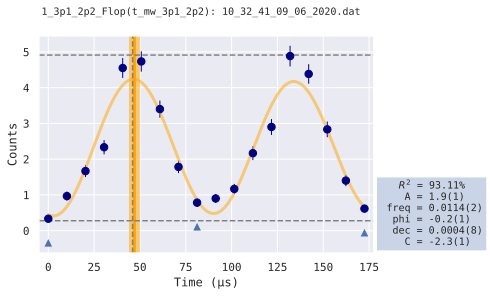

	set t_mw_3p1_2p2 = 47.0 [prev. 46.0 (2020-06-09 09:43:01)]	 fit OK

End session: 2020-06-09-10-32-23
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:23.316898
---------------------------------- 



In [33]:
paula.do_live = False
paula.do_plot = True
paula.cal_mw_trans(0, verbose=True)

### Robins new Histogram Fits

In [6]:
#paula.get('t_rd_cool')

----------------------------------
Check quality of mw flop
2020-06-09 10:33:20.990727
Please wait...
---------------------------------- 



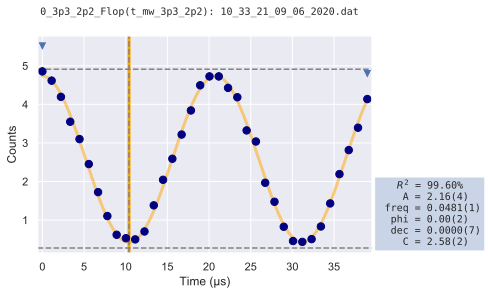

	set t_mw_3p3_2p2 = 10.4 [prev. 10.4 (2020-06-09 10:32:35)]	 fit OK

End session: 2020-06-09-10-33-20
----------------------------------
Done. Seq. took (hours:min:sec):
0:01:00.249979
---------------------------------- 



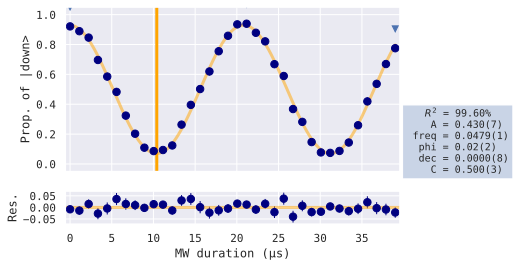

In [2]:
paula.set('A_sbc',0)
cal_begin = paula.print_header('Check quality of mw flop')
paula.set('t_rd_cool','1')
paula.set('t_det','50')
paula.cal_dur('0_3p3_2p2_Flop', 'mw_3p3_2p2', invert=False, 
             expperpoint=400, numofpoints=35,
             give_all_para=True, verbose=False);
cal_dur, sid = paula.print_footer(cal_begin);
dat = paula.session_replay(sid, do_plot = False);

paula.do_plot = True
from PyModules.analyse_eios import eios_analyse

data_set = 0

x = dat[1][data_set][0]['x']
prefit = eios_analyse.fit_poisson_hist(dat[1][data_set][0]['hists'])
y, y_err = eios_analyse.fit_hist(dat[1][data_set][0]['hists'], prefit)

data = [x, y, y_err]
paula.single_fit_func(data, paula.fit_time, invert=False, add_contrast = False, 
                      xlabel = 'MW duration (µs)', ylabel = 'Prop. of |down>', 
                      plot_residuals = True, y_rng = [-0.05, 1.05]);

----------------------------------
Check quality of mw flop
2020-06-08 23:16:17.751751
Please wait...
---------------------------------- 



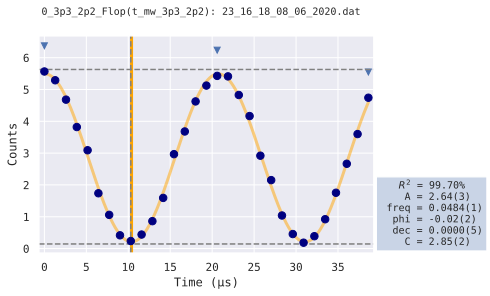

	set t_mw_3p3_2p2 = 10.39 [prev. 10.3 (2020-06-08 23:15:50)]	 fit OK

End session: 2020-06-08-23-16-17
----------------------------------
Done. Seq. took (hours:min:sec):
0:02:07.158892
---------------------------------- 



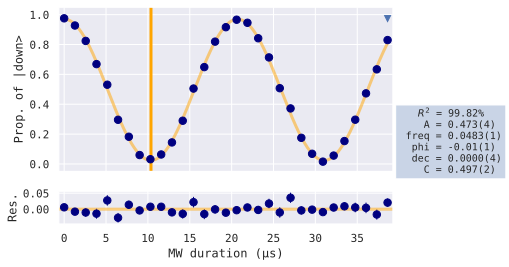

In [30]:
cal_begin = paula.print_header('Check quality of mw flop')
paula.set('t_rd_cool','6')
paula.cal_dur('0_3p3_2p2_Flop', 'mw_3p3_2p2', invert=False, 
             expperpoint=1000, numofpoints=30,
             give_all_para=True, verbose=False);
cal_dur, sid = paula.print_footer(cal_begin);
dat = paula.session_replay(sid, do_plot = False);

paula.do_plot = True
from PyModules.analyse_eios import eios_analyse

data_set = 0

x = dat[1][data_set][0]['x']
prefit = eios_analyse.fit_poisson_hist(dat[1][data_set][0]['hists'])
y, y_err = eios_analyse.fit_hist(dat[1][data_set][0]['hists'], prefit)

data = [x, y, y_err]
paula.single_fit_func(data, paula.fit_time, invert=False, add_contrast = False, 
                      xlabel = 'MW duration (µs)', ylabel = 'Prop. of |down>', 
                      plot_residuals = True, y_rng = [-0.05, 1.05]);

from PyModules.analyse_eios import eios_analyse

data_set = 0

x = dat[1][data_set][0]['x']
prefit = eios_analyse.fit_poisson_hist(dat[1][data_set][0]['hists'])
y, y_err = eios_analyse.fit_hist(dat[1][data_set][0]['hists'], prefit)

data = [x, y, y_err]
paula.single_fit_func(data, paula.fit_single_sinc, invert=True, add_contrast = False, 
                      xlabel = 'MW freq. (MHz)', ylabel = 'Prop. of |down>', 
                      plot_residuals = True, y_rng = [-0.05, 1.05]);

data_set = 1

x = dat[1][data_set][0]['x']
prefit = eios_analyse.fit_poisson_hist(dat[1][data_set][0]['hists'])
y, y_err = eios_analyse.fit_hist(dat[1][data_set][0]['hists'], prefit)

data = [x, y, y_err]
paula.single_fit_func(data, paula.fit_time, invert=False, add_contrast = False, 
                      xlabel = 'MW duration (µs)', ylabel = 'Prop. of |down>', 
                      plot_residuals = True, y_rng = [-0.05, 1.05]);

In [17]:
#paula.do_plot=True
#ret = paula.evaluate_data_points_MWFlop('0_3p3_2p2_Flop',20,1000,do_FScan=True)

### Longterm run..

In [3]:
    Ch12 = paula.read_avg_adc_me(ch=12, no_avg=10000, verbose=True)
    Ch12 = paula.round_paula([Ch12[0]],[Ch12[1]])
    Ch03 = paula.read_avg_adc_me(ch=3, no_avg=100, verbose=True)
    Ch03 = paula.round_paula([Ch03[0]],[Ch03[1]])
    
    print(Ch12[0], Ch03[0])

 Ch12 = 0.59351(1)
  Ch3 = 1.7678(3)
0.59351 1.7678


In [2]:
print(datetime.datetime.now())
while True:
    a = time.time()
    Ch12 = paula.read_avg_adc_me(ch=12, no_avg=10000, verbose=True)
    Ch12 = paula.round_paula([Ch12[0]],[Ch12[1]])
    paula.set('adc_me_RF_amp',Ch12[0])
    Ch03 = paula.read_avg_adc_me(ch=3, no_avg=100, verbose=True)
    Ch03 = paula.round_paula([Ch03[0]],[Ch03[1]])
    paula.set('adc_me_RF_fr',Ch03[0])

   # paula.cal_mode_freq(prec=.5, Level=2);
    
    #Ch12 = paula.read_avg_adc_me(ch=12, no_avg=10000, verbose=True)
    #Ch12 = paula.round_paula([Ch12[0]],[Ch12[1]])
    #paula.set('adc_me_RF_amp',Ch12[0])
    #Ch03 = paula.read_avg_adc_me(ch=3, no_avg=100, verbose=True)
    #Ch03 = paula.round_paula([Ch03[0]],[Ch03[1]])
    #paula.set('adc_me_RF_fr',Ch03[0])
    
    b = time.time()
    time.sleep(2-(b-a))

2020-06-04 07:18:49.254654
 Ch12 = 0.59355(1)
  Ch3 = 1.7675(3)
 Ch12 = 0.59355(2)
  Ch3 = 1.7673(2)
 Ch12 = 0.59358(2)
  Ch3 = 1.7670(4)
 Ch12 = 0.59353(1)
  Ch3 = 1.7674(3)
 Ch12 = 0.59359(1)
  Ch3 = 1.7676(3)
 Ch12 = 0.59354(1)
  Ch3 = 1.7680(2)
 Ch12 = 0.59349(1)
  Ch3 = 1.7670(3)
 Ch12 = 0.59355(2)
  Ch3 = 1.7676(3)
 Ch12 = 0.59350(1)
  Ch3 = 1.7677(3)
 Ch12 = 0.59352(1)
  Ch3 = 1.7674(3)
 Ch12 = 0.59352(1)
  Ch3 = 1.7670(5)
 Ch12 = 0.59354(1)
  Ch3 = 1.7680(6)
 Ch12 = 0.59349(2)
  Ch3 = 1.7670(2)
 Ch12 = 0.59351(1)
  Ch3 = 1.7678(4)
 Ch12 = 0.59351(1)
  Ch3 = 1.7677(3)
 Ch12 = 0.59354(1)
  Ch3 = 1.7672(3)
 Ch12 = 0.59354(2)
  Ch3 = 1.7678(3)
 Ch12 = 0.59354(1)
  Ch3 = 1.7672(4)
 Ch12 = 0.59352(2)
  Ch3 = 1.7683(3)
 Ch12 = 0.59353(2)
  Ch3 = 1.7676(3)
 Ch12 = 0.59353(1)
  Ch3 = 1.7672(3)
 Ch12 = 0.59351(1)
  Ch3 = 1.7671(2)
 Ch12 = 0.59348(1)
  Ch3 = 1.7668(3)
 Ch12 = 0.59351(1)
  Ch3 = 1.7675(3)
 Ch12 = 0.59352(1)
  Ch3 = 1.7673(3)
 Ch12 = 0.59354(2)
  Ch3 = 1.7679(5)
 Ch12 = 0.5

KeyboardInterrupt: 

In [ ]:
paula.cal_mode_freq(prec=.5, Level=2)

In [ ]:
value, err = paula.cal_mode_freq(prec=.5, Level=1)
print(value,err)
value, err = paula.cal_mode_freq(prec=.5, Level=2)
print(value,err)
value, err = paula.cal_mode_freq(prec=.5, Level=3)
print(value,err)

In [ ]:
paula.set_shim('ch3p8', 3.475)

In [14]:
Ch12 = paula.read_avg_adc_me(ch=12, no_avg=10000, verbose=True)
value, err = Ch12 = paula.round_paula([Ch12[0]],[Ch12[1]])
#adc_me_RF_amp_list6.append(value)
#adc_me_RF_amp_err_list6.append(err)
paula.set('adc_me_RF_amp',Ch12[0][0])

 Ch12 = 0.4467(1)


True

In [ ]:
##### paula.read_avg_adc_me(ch=3, no_avg=100, verbose=True)

z6 = np.linspace(3,4,21)
adc_me_RF_amp_list6 = []
adc_me_RF_amp_err_list6 = []
adc_me_RF_ch13_list6 = []
adc_me_RF_ch13_err_list6 = []
adc_me_RF_fr_list6 = []
adc_me_RF_fr_err_list6 = []
mf_mu_list6=[]
mf_mu_err_list6 = []
hf_mu_list6=[]
hf_mu_err_list6 = []
lf_mu_list6=[]
lf_mu_err_list6 = []
for i in range(len(z6)):
    paula.set_shim('ch3p8', z6[i])
    #a = time.time()
    paula.run('BDX', numofpoints=0, expperpoint=250, verbose=False)
    time.sleep(0.5)
    
    Ch12 = paula.read_avg_adc_me(ch=12, no_avg=10000, verbose=True)
    value, err = Ch12 = paula.round_paula([Ch12[0]],[Ch12[1]])
    adc_me_RF_amp_list6.append(value)
    adc_me_RF_amp_err_list6.append(err)
    paula.set('adc_me_RF_amp',Ch12[0][0])
    
    Ch03 = paula.read_avg_adc_me(ch=3, no_avg=100, verbose=True)
    value, err = Ch03 = paula.round_paula([Ch03[0]],[Ch03[1]])
    adc_me_RF_fr_list6.append(value)
    adc_me_RF_fr_err_list6.append(err)
    paula.set('adc_me_RF_fr',Ch03[0][0])
    
    Ch13 = paula.read_avg_adc_me(ch=13, no_avg=100, verbose=True)
    value, err = Ch13 = paula.round_paula([Ch13[0]],[Ch13[1]])
    adc_me_RF_ch13_list6.append(value)
    adc_me_RF_ch13_err_list6.append(err)
    paula.set('adc_me_RF_ch13',Ch13[0][0])
    
    
    value, err = paula.cal_mode_freq(prec=.5, Level=1);
    lf_mu_list6.append(value)
    lf_mu_err_list6.append(err)
    
    value, err = paula.cal_mode_freq(prec=.5, Level=2);
    mf_mu_list6.append(value)
    mf_mu_err_list6.append(err)
    
    value, err = paula.cal_mode_freq(prec=.5, Level=3);
    hf_mu_list6.append(value)
    hf_mu_err_list6.append(err)


    #b = time.time()
    #time.sleep(2-(b-a))

In [ ]:
plt.errorbar(z6,np.array(lf_mu_list6)/np.array(lf_mu_list6[19]),
             np.array(lf_mu_err_list6)/np.array(lf_mu_list6[19]),
             linestyle = "None", marker = "x",
             label='fr_lf mu', color='C0', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(z6,np.array(mf_mu_list6)/np.array(mf_mu_list6[19]),
             np.array(mf_mu_err_list6)/np.array(hf_mu_list6[19]),
             linestyle = "None", marker = "x",
             label='fr_mf mu', color='C1', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(z6,np.array(hf_mu_list6)/np.array(hf_mu_list6[19]),
             np.array(hf_mu_err_list6)/np.array(hf_mu_list6[19]),
             linestyle = "None", marker = "x",
             label='fr_hf mu', color='C2', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(z6,np.array(adc_me_RF_amp_list6)/np.array(adc_me_RF_amp_list6[19]),
             np.array(adc_me_RF_amp_err_list6)/np.array(adc_me_RF_amp_list6[19]),
             linestyle = "None", marker = "o",
             label='pick up (no_avg=10,000)', color='C7', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(z6,np.array(adc_me_RF_fr_list6)/np.array(adc_me_RF_fr_list6[19]),
             np.array(adc_me_RF_fr_err_list6)/np.array(adc_me_RF_fr_list6[19]),
             linestyle = "None", marker = "o",
             label='back reflected', color='C3', markersize=7.5, lw=1., capsize=.0)
plt.legend()
plt.xlabel('RF-Amplitude, Shim Ch3p8')
plt.ylabel('normalized signal to ch3p8=3.475');

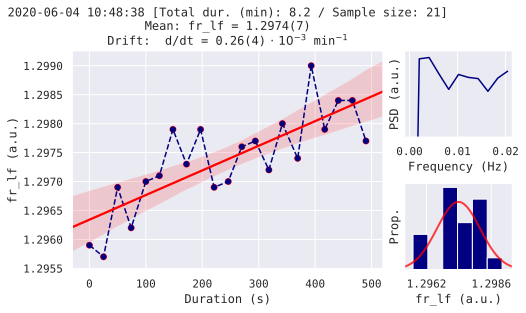

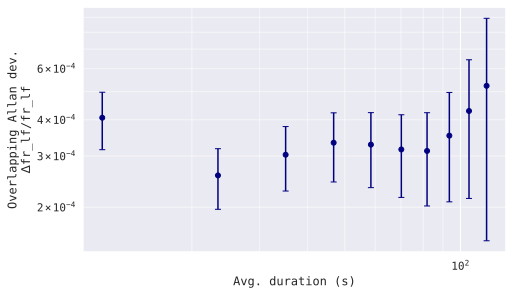

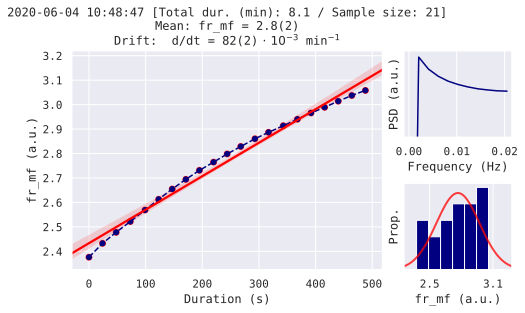

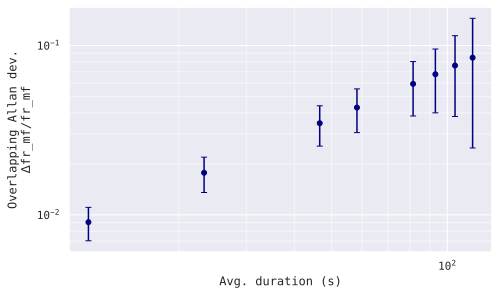

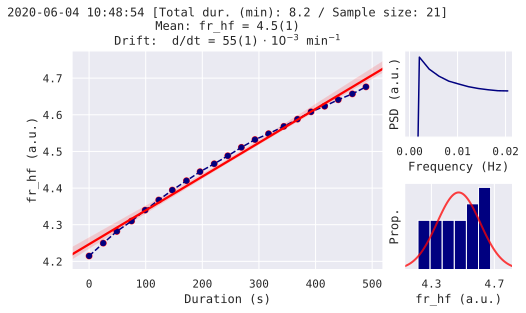

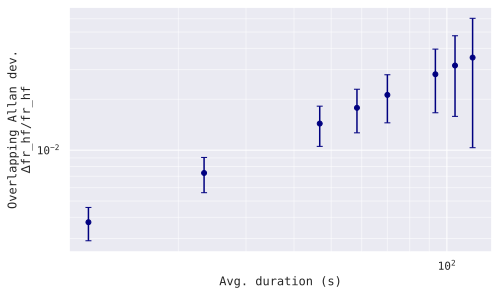

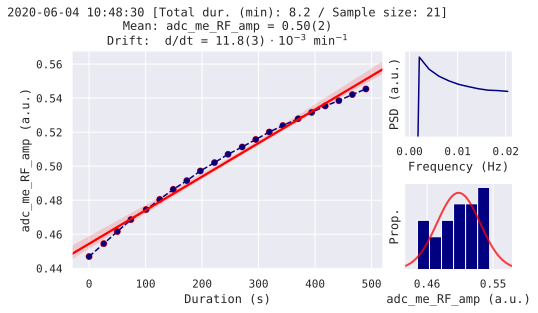

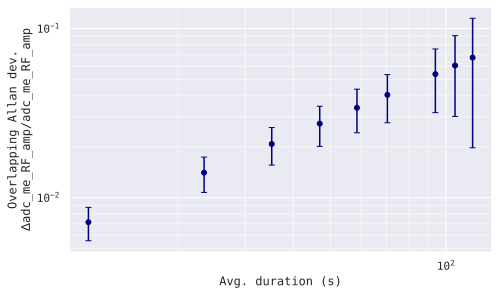

In [20]:
data=paula.plt_longterm(ip_l=['fr_lf','fr_mf','fr_hf','adc_me_RF_amp'], rng=['2020-06-04 10:48:28', '2020-06-04 13:49:00'])

In [ ]:
print(data[0][0])
data[0][1][0]

In [21]:
fr_lf_x = []
fr_lf_y = []
fr_mf_x = []
fr_mf_y = []
fr_hf_x = []
fr_hf_y = []
Ch12_x = []
Ch12_y = []
for i in range(len(data[0][1])):
    fr_lf_x.append(data[0][1][i][0]-data[0][1][0][0])
    fr_lf_y.append(data[0][1][i][1])
    fr_mf_x.append(data[1][1][i][0]-data[1][1][0][0])
    fr_mf_y.append(data[1][1][i][1])
    fr_hf_x.append(data[2][1][i][0]-data[2][1][0][0])
    fr_hf_y.append(data[2][1][i][1])
    Ch12_x.append(data[3][1][i][0]-data[3][1][0][0])
    Ch12_y.append(data[3][1][i][1])

for the lf mode:
0.022±0.004
1.286±0.002


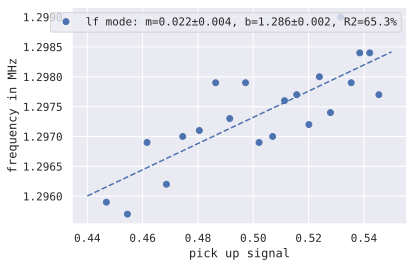

for the mf mode:
6.94±0.02
-0.72±0.01


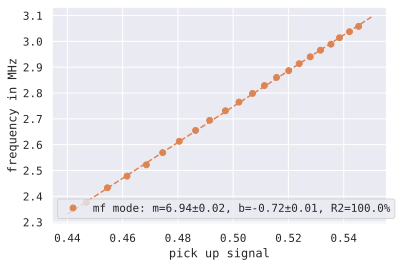

for the hf mode:
4.66±0.02
2.129±0.009


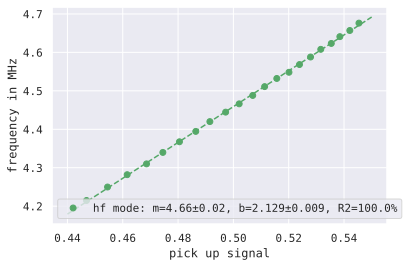

In [29]:
#plt.plot(Ch12_y,fr_lf_y,'C0o',label='lf mode')
#plt.plot(Ch12_y,fr_mf_y,'C1o',label='mf mode')
#plt.plot(Ch12_y,fr_hf_y,'C2o',label='hf mode')

z = np.linspace(0.44,0.55,100)
popt,pcov = curve_fit(lin_fit, Ch12_y, fr_lf_y)
#plt.plot(z,lin_fit(z,*popt),'C0--')
print('for the lf mode:')
for i in range(len(popt)):
    print(paula.round_paula([popt[i]],np.sqrt([pcov[i][i]])))
R2=paula.calc_R2(np.array(Ch12_y),np.array(fr_lf_y),lin_fit,popt)
plt.plot(Ch12_y,fr_lf_y,'C0o',label='lf mode: m=%s, b=%s, R2=%s%%' % 
         (paula.round_paula([popt[0]],np.sqrt([pcov[0][0]])),
          paula.round_paula([popt[1]],np.sqrt([pcov[1][1]])), np.round(R2,1)))
plt.plot(z,lin_fit(z,*popt),'C0--')
plt.xlabel('pick up signal')
plt.ylabel('frequency in MHz')
plt.legend()
plt.show() 


popt,pcov = curve_fit(lin_fit, Ch12_y,fr_mf_y)
print('for the mf mode:')
for i in range(len(popt)):
    print(paula.round_paula([popt[i]],np.sqrt([pcov[i][i]])))
R2=paula.calc_R2(np.array(Ch12_y),np.array(fr_mf_y),lin_fit,popt)
plt.plot(Ch12_y,fr_mf_y,'C1o',label='mf mode: m=%s, b=%s, R2=%s%%' %  
         (paula.round_paula([popt[0]],np.sqrt([pcov[0][0]])),
          paula.round_paula([popt[1]],np.sqrt([pcov[1][1]])), np.round(R2,1)))
plt.plot(z,lin_fit(z,*popt),'C1--')
plt.xlabel('pick up signal')
plt.ylabel('frequency in MHz')
plt.legend()
plt.show()     


popt,pcov = curve_fit(lin_fit, Ch12_y,fr_hf_y)
#plt.plot(z,lin_fit(z,*popt),'C2--')
print('for the hf mode:')
for i in range(len(popt)):
    print(paula.round_paula([popt[i]],np.sqrt([pcov[i][i]])))
R2=paula.calc_R2(np.array(Ch12_y),np.array(fr_hf_y),lin_fit,popt)
plt.plot(Ch12_y,fr_hf_y,'C2o',label='hf mode: m=%s, b=%s, R2=%s%%' % 
         (paula.round_paula([popt[0]],np.sqrt([pcov[0][0]])),
          paula.round_paula([popt[1]],np.sqrt([pcov[1][1]])), np.round(R2,1)))
plt.plot(z,lin_fit(z,*popt),'C2--')
    
plt.xlabel('pick up signal')
plt.ylabel('frequency in MHz')
plt.legend()

In [23]:
from scipy.optimize import curve_fit
def lin_fit(x,m,b):
    return m*x+b
def sqrt_fit(x,a,b,c,d):
    return a*np.sqrt(b*x-c)+d

In [ ]:
z = np.linspace(0,0.1,100)
#plt.plot(z,10*np.sqrt(2*z-0.06))
plt.plot(Ch12_y,fr_lf_y,'C1o',label='lf mode')

In [ ]:
plt.errorbar(adc_me_RF_amp_list6,np.array(mf_mu_list6),
             np.array(mf_mu_err_list6),
             linestyle = "None", marker = "o",
             label='fr_mf mu', color='C1', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(adc_me_RF_amp_list6,np.array(hf_mu_list6),
             np.array(hf_mu_err_list6),
             linestyle = "None", marker = "o",
             label='fr_hf mu', color='C2', markersize=7.5, lw=1., capsize=.0)

In [ ]:
mf_mu_list6

In [ ]:
from scipy.optimize import curve_fit
def lin_fit(x,m,b):
    return m*x+b

In [ ]:
plt.errorbar(adc_me_RF_amp_list6,np.array(lf_mu_list6),
             np.array(lf_mu_err_list6),
             linestyle = "None", marker = "o",
             label='fr_lf mu', color='C0', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(adc_me_RF_amp_list6,np.array(mf_mu_list6),
             np.array(mf_mu_err_list6),
             linestyle = "None", marker = "o",
             label='fr_mf mu', color='C1', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(adc_me_RF_amp_list6,np.array(hf_mu_list6),
             np.array(hf_mu_err_list6),
             linestyle = "None", marker = "o",
             label='fr_hf mu', color='C2', markersize=7.5, lw=1., capsize=.0)

popt,pcov = curve_fit(lin_fit, adc_me_RF_amp_list6, adc_me_RF_amp_list6)
z = np.linspace(0.08,0.11,100)
plt.plot(z,lin_fit(z,*popt),'C0--')
print('for the lf mode:')
for i in range(len(popt)):
    print(paula.round_paula([popt[i]],np.sqrt([pcov[i][i]])))
    
popt,pcov = curve_fit(lin_fit, adc_me_RF_amp_list6,mf_mu_list6,sigma=mf_mu_err_list6)
z = np.linspace(0.08,0.11,100)
plt.plot(z,lin_fit(z,*popt),'C1--')
print('for the mf mode:')
for i in range(len(popt)):
    print(paula.round_paula([popt[i]],np.sqrt([pcov[i][i]])))
    
popt,pcov = curve_fit(lin_fit, adc_me_RF_amp_list6,hf_mu_list6,sigma=hf_mu_err_list6)
z = np.linspace(0.08,0.11,100)
plt.plot(z,lin_fit(z,*popt),'C2--')
print('for the hf mode:')
for i in range(len(popt)):
    print(paula.round_paula([popt[i]],np.sqrt([pcov[i][i]])))

In [ ]:
for i in range(len(lf_mu_list6)):
    lf_mu_list6[i][0]=lf_mu_list6[i]

In [ ]:
plt.errorbar(adc_me_RF_amp_list6,np.array(lf_mu_list6),
             np.array(lf_mu_err_list6),
             linestyle = "None", marker = "o",
             label='fr_lf mu', color='C0', markersize=7.5, lw=1., capsize=.0)

In [ ]:
lf_mu_list6[0][0][0][0]

In [ ]:
plt.errorbar(z5,np.array(lf_mu_list5)/np.array(lf_mu_list5[20]),
             np.array(lf_mu_err_list5)/np.array(lf_mu_list5[20]),
             linestyle = "None", marker = "x",
             label='fr_lf mu', color='C0', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(z5,np.array(mf_mu_list5)/np.array(mf_mu_list5[20]),
             np.array(mf_mu_err_list5)/np.array(hf_mu_list5[20]),
             linestyle = "None", marker = "x",
             label='fr_mf mu', color='C1', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(z5,np.array(hf_mu_list5)/np.array(hf_mu_list5[20]),
             np.array(hf_mu_err_list5)/np.array(hf_mu_list5[20]),
             linestyle = "None", marker = "x",
             label='fr_hf mu', color='C2', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(z5,np.array(adc_me_RF_amp_list5)/np.array(adc_me_RF_amp_list5[20]),
             np.array(adc_me_RF_amp_err_list5)/np.array(adc_me_RF_amp_list5[20]),
             linestyle = "None", marker = "o",
             label='pick up (no_avg=10,000)', color='C7', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(z5,np.array(adc_me_RF_fr_list5)/np.array(adc_me_RF_fr_list5[20]),
             np.array(adc_me_RF_fr_err_list5)/np.array(adc_me_RF_fr_list5[20]),
             linestyle = "None", marker = "o",
             label='back reflected', color='C3', markersize=7.5, lw=1., capsize=.0)
plt.legend()
plt.xlabel('RF-Amplitude, Shim Ch3p8')
plt.ylabel('normalized signal to ch3p8=3.475');

In [ ]:
plt.errorbar(z4,np.array(mu_list4)/np.array(mu_list4[10]),
             np.array(mu_err_list4)/np.array(mu_list4[10]),
             linestyle = "None", marker = "o",
             label='fr_mf mu', color='C0', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(z4,np.array(adc_me_RF_amp_list4)/np.array(adc_me_RF_amp_list4[10]),
             np.array(adc_me_RF_amp_err_list4)/np.array(adc_me_RF_amp_list4[10]),
             linestyle = "None", marker = "o",
             label='pick up (no_avg=10,000)', color='C7', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(z4,np.array(adc_me_RF_fr_list4)/np.array(adc_me_RF_fr_list4[10]),
             np.array(adc_me_RF_fr_err_list4)/np.array(adc_me_RF_fr_list4[10]),
             linestyle = "None", marker = "o",
             label='back reflected', color='C3', markersize=7.5, lw=1., capsize=.0)
plt.legend()
plt.xlabel('RF-Amplitude, Shim Ch3p8')
plt.ylabel('normalized signal to ch3p8=3.475');

In [ ]:
plt.errorbar(z3,np.array(mu_list3)/np.array(mu_list3[10]),
             np.array(mu_err_list3)/np.array(mu_list3[10]),
             linestyle = "None", marker = "o",
             label='fr_mf mu', color='C0', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(z3,np.array(adc_me_RF_amp_list3)/np.array(adc_me_RF_amp_list3[10]),
             np.array(adc_me_RF_amp_err_list3)/np.array(adc_me_RF_amp_list3[10]),
             linestyle = "None", marker = "o",
             label='pick up (no_avg=1000)', color='C7', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(z3,np.array(adc_me_RF_fr_list3)/np.array(adc_me_RF_fr_list3[10]),
             np.array(adc_me_RF_fr_err_list3)/np.array(adc_me_RF_fr_list3[10]),
             linestyle = "None", marker = "o",
             label='back reflected', color='C3', markersize=7.5, lw=1., capsize=.0)
plt.legend()
plt.xlabel('RF-Amplitude, Shim Ch3p8')
plt.ylabel('normalized signal to ch3p8=3.475');

In [ ]:
plt.errorbar(z,np.array(mu_list)/np.array(mu_list[10]),
             np.array(mu_err_list)/np.array(mu_list[10]),
             linestyle = "None", marker = "o",
             label='fr_mf mu', color='C0', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(z,np.array(adc_me_RF_amp_list)/np.array(adc_me_RF_amp_list[10]),
             np.array(adc_me_RF_amp_err_list)/np.array(adc_me_RF_amp_list[10]),
             linestyle = "None", marker = "o",
             label='pick up', color='C7', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(z,np.array(adc_me_RF_fr_list)/np.array(adc_me_RF_fr_list[10]),
             np.array(adc_me_RF_fr_err_list)/np.array(adc_me_RF_fr_list[10]),
             linestyle = "None", marker = "o",
             label='back reflected', color='C3', markersize=7.5, lw=1., capsize=.0)
plt.legend()
plt.xlabel('RF-Amplitude, Shim Ch3p8')
plt.ylabel('normalized signal to ch3p8=3.475');

In [ ]:
plt.errorbar(z2,np.array(mu_list2)/np.array(mu_list2[19]),
             np.array(mu_err_list2)/np.array(mu_list2[19]),
             linestyle = "None", marker = "o",
             label='fr_mf mu', color='C0', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(z2,np.array(adc_me_RF_amp_list2)/np.array(adc_me_RF_amp_list2[19]),
             np.array(adc_me_RF_amp_err_list2)/np.array(adc_me_RF_amp_list2[19]),
             linestyle = "None", marker = "o",
             label='pick up', color='C7', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(z2,np.array(adc_me_RF_fr_list2)/np.array(adc_me_RF_fr_list2[19]),
             np.array(adc_me_RF_fr_err_list2)/np.array(adc_me_RF_fr_list2[19]),
             linestyle = "None", marker = "o",
             label='back reflected', color='C3', markersize=7.5, lw=1., capsize=.0)
plt.legend()
plt.xlabel('RF-Amplitude, Shim ch3p8')
plt.ylabel('normalized signal to ch3p8=3.475');

In [ ]:
plt.errorbar(z2,np.array(mu_list2)/np.array(mu_list2[19]),
             np.array(mu_err_list2)/np.array(mu_list2[19]),
             linestyle = "None", marker = "o",
             label='fr_mf mu', color='C0', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(z2,np.array(adc_me_RF_amp_list2)/np.array(adc_me_RF_amp_list2[19]),
             np.array(adc_me_RF_amp_err_list2)/np.array(adc_me_RF_amp_list2[19]),
             linestyle = "None", marker = "o",
             label='pick up', color='C7', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(z2,np.array(adc_me_RF_fr_list2)/np.array(adc_me_RF_fr_list2[19]),
             np.array(adc_me_RF_fr_err_list2)/np.array(adc_me_RF_fr_list2[19]),
             linestyle = "None", marker = "o",
             label='back reflected', color='C3', markersize=7.5, lw=1., capsize=.0)
plt.legend()
plt.xlabel('RF-Amplitude, Shim ch3p8')
plt.ylabel('normalized signal to ch3p8=3.475');

In [ ]:
z2 = np.linspace(3,4,41)
adc_me_RF_amp_list2 = []
adc_me_RF_amp_err_list2 = []
adc_me_RF_fr_list2 = []
adc_me_RF_fr_err_list2 = []
mu_list2=[]
mu_err_list2 = []
for i in range(len(z2)):
    paula.set_shim('ch3p8', z2[i])
    #a = time.time()
    paula.run('BDX', numofpoints=0, expperpoint=250, verbose=False)
    time.sleep(0.5)
    
    Ch12 = paula.read_avg_adc_me(ch=12, no_avg=100, verbose=True)
    value, err = Ch12 = paula.round_paula([Ch12[0]],[Ch12[1]])
    adc_me_RF_amp_list2.append(value)
    adc_me_RF_amp_err_list2.append(err)
    paula.set('adc_me_RF_amp',Ch12[0])
    
    Ch03 = paula.read_avg_adc_me(ch=3, no_avg=100, verbose=True)
    value, err = Ch03 = paula.round_paula([Ch03[0]],[Ch03[1]])
    adc_me_RF_fr_list2.append(value)
    adc_me_RF_fr_err_list2.append(err)
    paula.set('adc_me_RF_fr',Ch03[0])
    
    value, err = paula.cal_mode_freq(prec=.5, Level=2);
    mu_list2.append(value)
    mu_err_list2.append(err)


    #b = time.time()
    #time.sleep(2-(b-a))

In [ ]:
z[10]

In [ ]:
fig, ax1 = plt.subplots()


ax1.set_xlabel('RF-Amplitude, Shim Ch3p8')
ax1.set_ylabel('RF-, Milehouse Card', color='C0')
ax1.errorbar(z,adc_me_RF_amp_list,adc_me_RF_amp_err_list,
             linestyle = "None", marker = "o",
             label='RF-Amplitude', color='C0', markersize=7.5, lw=1., capsize=.0)
ax1.tick_params(axis='y', labelcolor='C0')

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

ax2.set_ylabel('RF-Frequency, Milehouse Card', color='C3')  # we already handled the x-label with ax1
ax2.errorbar(z,adc_me_RF_fr_list,adc_me_RF_fr_err_list,
             linestyle = "None", marker = "o",
             label='RF-Frequency', color='C3', markersize=7.5, lw=1., capsize=.0)
ax2.tick_params(axis='y', labelcolor='C3')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
ax1.legend()
ax2.legend()
plt.show()

In [ ]:
adc_me_RF_amp_list2=[]
adc_me_RF_amp_err_list2=[]
for i in range(len(adc_me_RF_amp_list)):
    if i%2 == 0:
        adc_me_RF_amp_list2.append(adc_me_RF_amp_list[i])
        adc_me_RF_amp_err_list2.append(adc_me_RF_amp_err_list[i])

In [ ]:
y_amp = []
y_amp_err = []
y_fr = []
y_fr_err = []

for i in range(len(adc_me_RF_amp_list)):
    if i%2 == 0:
        y_amp.append(adc_me_RF_amp_list[i]/adc_me_RF_amp_list[0])
        y_amp_err.append(adc_me_RF_amp_err_list[i]/adc_me_RF_amp_list[0])
for i in range(len(adc_me_RF_fr_list)):
    y_fr.append(adc_me_RF_fr_list[i]/adc_me_RF_fr_list[0])
    y_fr_err.append(adc_me_RF_fr_err_list[i]/adc_me_RF_fr_list[0])
    

In [ ]:
data=paula.plt_longterm(ip_l=['fr_mf'], rng=['2020-05-29 09:42:25', '2020-05-29 23:10:00'])
fr_mf_x = []
fr_mf_y = []
for i in range(len(data[0][1])):
    fr_mf_x.append(data[0][1][i][0]-data[0][1][0][0])
    fr_mf_y.append(data[0][1][i][1])

In [ ]:
paula.cal_mode_freq(prec=.5, Level=2);

In [ ]:
value

In [ ]:
fig, ax1 = plt.subplots()


ax1.set_xlabel('RF-Amplitude, Shim Ch3p8')
ax1.set_ylabel('RF-Amplitude, Milehouse Card', color='C0')
ax1.errorbar(z,adc_me_RF_amp_list,adc_me_RF_amp_err_list,
             linestyle = "None", marker = "o",
             label='RF-Amplitude', color='C0', markersize=7.5, lw=1., capsize=.0)
ax1.tick_params(axis='y', labelcolor='C0')

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

ax2.set_ylabel('RF-Frequency, Milehouse Card', color='C3')  # we already handled the x-label with ax1
ax2.errorbar(z,adc_me_RF_fr_list,adc_me_RF_fr_err_list,
             linestyle = "None", marker = "o",
             label='RF-Frequency', color='C3', markersize=7.5, lw=1., capsize=.0)
ax2.tick_params(axis='y', labelcolor='C3')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
ax1.legend()
ax2.legend()
plt.show()

In [ ]:
fig, ax1 = plt.subplots()


ax1.set_xlabel('RF-Amplitude, Shim Ch3p8')
ax1.set_ylabel('RF-Amplitude, Milehouse Card', color='C0')
ax1.errorbar(z,adc_me_RF_amp_list,adc_me_RF_amp_err_list,
             linestyle = "None", marker = "o",
             label='RF-Amplitude', color='C0', markersize=7.5, lw=1., capsize=.0)
ax1.tick_params(axis='y', labelcolor='C0')
plt.grid(color='C0',linestyle='--',axis='y')
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

ax2.set_ylabel('RF-Frequency, Milehouse Card', color='C3')  # we already handled the x-label with ax1
ax2.errorbar(z,adc_me_RF_fr_list,adc_me_RF_fr_err_list,
             linestyle = "None", marker = "o",
             label='RF-Frequency', color='C3', markersize=7.5, lw=1., capsize=.0)
ax2.tick_params(axis='y', labelcolor='C3')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
ax1.legend(loc=(0.5,0.15))
ax2.legend(loc=(0.5,0.07))
plt.grid(color='C3',linestyle='--')
plt.show()


In [ ]:
plt.errorbar(z,ch3p8_adc_me_list,ch3p8_adc_me_err_list,
             linestyle = "None", marker = "o",
             label=None, color='C0', markersize=7.5, lw=1., capsize=.0)
plt.xlabel('RF-amplitude, Shim Ch3p8')
plt.ylabel('RF-amplitude, Milehouse Cart')

In [ ]:
plt.plot(adc_me_RF_amp_list,adc_me_RF_fr_list,'C0x')
plt.show()
plt.plot(adc_me_RF_fr_list,adc_me_RF_amp_list,'C0x')

In [ ]:
ch3p8_adc_me_err_list

In [ ]:
while True:
    a = time.time()
    paula.cal_fr('0_3p3_2p2_FScan', 'mw_3p3_2p2', invert=True, expperpoint=60, numofpoints=11, verbose=True);
    paula.cal_fr('1_3p1_2p2_FScan', 'mw_3p1_2p2', invert=False, expperpoint=60, numofpoints=11, verbose=True);
    paula.cal_mode_freq(prec=1, Level=0);
    b = time.time()
    #time.sleep(10-(b-a))

In [ ]:
paula.plt_longterm(ip_l=['fr_mw_3p3_2p2'], rng=['2020-05-28 01:46:54', '2020-05-28 03:45:00'])
#paula.plt_longterm(ip_l=['fr_mw_3p3_2p2'], rng=['2020-05-28 01:31:25', '2020-05-28 01:45:00'])

### Stability of RF

In [ ]:
import pandas as pd

In [ ]:
filename='/home/qsim/Documents/Florian/Ch12/1000ms.txt'
f=open(filename, 'r')
content = f.read().splitlines()
f.close()
x = []
y = []
for i in range(len(content)):
    if
    
print(content)

In [ ]:
content[0]

In [ ]:
import csv
from scipy.optimize import curve_fit
def phase(x, A, multi, phi, C):
    x = np.array(x)
    osc = np.cos(x*multi+phi)
    return A*osc+C

In [ ]:
filename='/home/qsim/Documents/Florian/Ch12/1000ms.txt'
with open(filename) as inf:
    reader = csv.reader(inf, delimiter="\t")
    all_col = list(zip(*reader))
x1000 = [float(item) for item in all_col[0]]
y1000 = [float(item) for item in all_col[1]]

filename='/home/qsim/Documents/Florian/Ch12/100ms.txt'
with open(filename) as inf:
    reader = csv.reader(inf, delimiter="\t")
    all_col = list(zip(*reader))
x100 = [float(item) for item in all_col[0]]
y100 = [float(item) for item in all_col[1]]

filename='/home/qsim/Documents/Florian/Ch12/10ms.txt'
with open(filename) as inf:
    reader = csv.reader(inf, delimiter="\t")
    all_col = list(zip(*reader))
x10 = [float(item) for item in all_col[0]]
y10 = [float(item) for item in all_col[1]]

filename='/home/qsim/Documents/Florian/Ch12/1ms.txt'
with open(filename) as inf:
    reader = csv.reader(inf, delimiter="\t")
    all_col = list(zip(*reader))
x1 = [float(item) for item in all_col[0]]
y1 = [float(item) for item in all_col[1]]

In [ ]:
#Ausreiser bei 1000ms zieht zu viel!
z = np.linspace(0,30,500)
plt.plot(x1000[:23],y1000[:23],'kx')
guess=[0.01,2*np.pi/10,0,0]
popt1000,pcov1000 = curve_fit(phase,x1000[:23],y1000[:23],p0=guess)
plt.plot(z,phase(z,*popt1000))
#print(popt1000,pcov1000)

#plt.plot(x100,y100,'kx')
guess=[0.01,2*np.pi/10,0,0]
popt100,pcov100 = curve_fit(phase,x100,y100,p0=guess)
plt.plot(z,phase(z,*popt100))
#print(popt100,pcov100)

#plt.plot(x10,y10,'kx')
guess=[0.01,2*np.pi/10,15,0]
popt10,pcov10 = curve_fit(phase,x10,y10,p0=guess)
plt.plot(z,phase(z,*popt10))
#print(popt10,pcov10)

#plt.plot(x1,y1,'kx')
guess=[0.01,2*np.pi/10,0,0]
popt1,pcov1 = curve_fit(phase,x1,y1,p0=guess)
plt.plot(z,phase(z,*popt1))
#print(popt1,pcov1)

In [ ]:
plt.plot(z,phase(z,popt1000[0],popt1000[1],0,popt1000[3]),label='1000 ms')
plt.plot(z,phase(z,popt100[0],popt100[1],0,popt100[3]),label='100 ms')
plt.plot(z,phase(z,popt10[0],popt10[1],0,popt10[3]),label='10 ms')
plt.plot(z,phase(z,popt1[0],popt1[1],0,popt1[3]),label='1 ms')
plt.legend()

In [ ]:
print('Length of the arrays for roughly 30 s measurement:')
print('1000 ms: %s, 100 ms: %s, 10 ms: %s, 1 ms: %s' % (len(x1000),len(x100),len(x10),len(x1)))

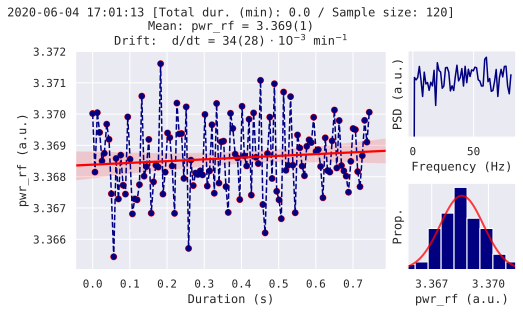

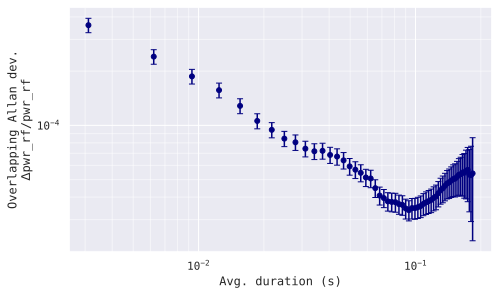

In [18]:
time_list = []
Ch12_list = []

dur=.75
start = time.time()
avg = int(dur*150)

while start+dur > time.time():
    Ch12_list.append(paula.check_pickup(channel=13, avg=avg))
    time_list.append(time.time())
#print(len(Ch12_list))
paula.plt_allan_xy(time_list,Ch12_list, ip='pwr_rf')

# Check mode freqs. via tickle

----------------------------------
Mode frequency
2020-06-09 10:35:25.066595
Please wait...
---------------------------------- 



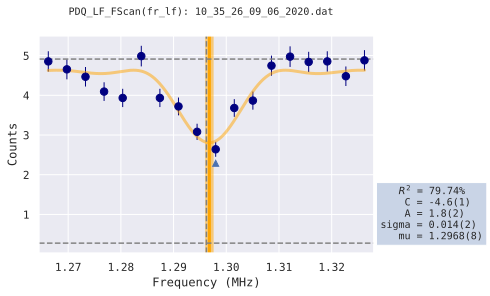

	set fr_lf = 1.2968 [prev. 1.29623 (2020-06-09 09:42:22)]	 fit OK



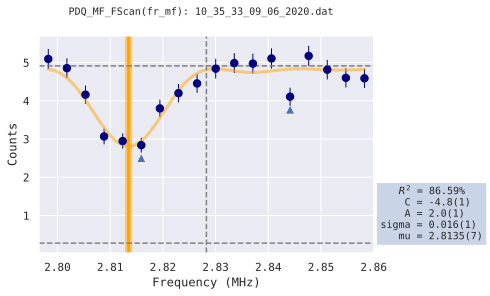

	set fr_mf = 2.8135 [prev. 2.82826 (2020-06-09 09:42:30)]	 fit OK



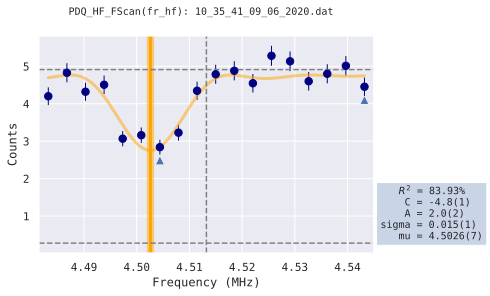

	set fr_hf = 4.5026 [prev. 4.51322 (2020-06-09 09:42:39)]	 fit OK

End session: 2020-06-09-10-35-25
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:22.735415
---------------------------------- 



In [3]:
paula.cal_mode_freq(prec=.75, Level=0);
#paula.cal_mode_freq(prec=1, Level=0);

----------------------------------
Check longterm stab. of motional mode freq.
2020-06-09 09:22:50.219439
Please wait...
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:22:50.220112
Please wait...
---------------------------------- 



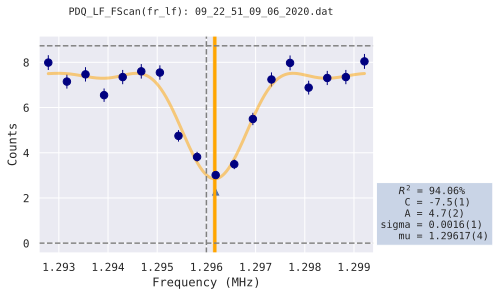

	set fr_lf = 1.29617 [prev. 1.296 (2020-06-09 09:12:11)]	 fit OK



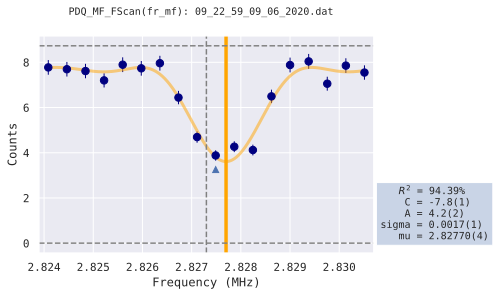

	set fr_mf = 2.8277 [prev. 2.8273 (2020-06-09 09:12:19)]	 fit OK



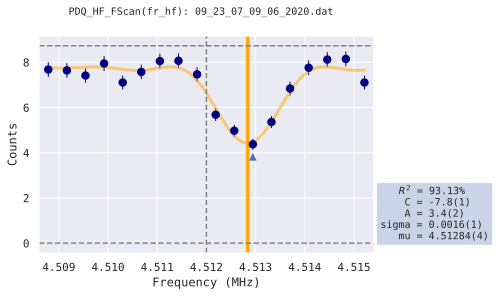

	set fr_hf = 4.51284 [prev. 4.512 (2020-06-09 09:12:26)]	 fit OK

End session: 2020-06-09-09-22-50
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:25.197745
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:23:15.418231
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.953238, stop 1775.200762, 
	points 11, experiment/point 60 rnd 1 show 0
	09_23_16_09_06_2020.dat [52f01]
	duration 3.22s


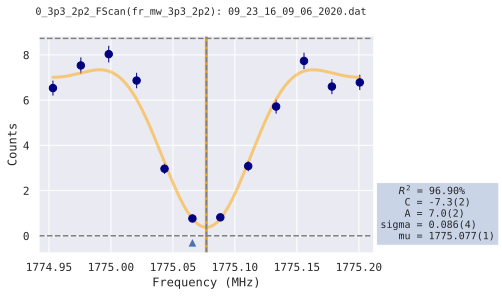

	set fr_mw_3p3_2p2 = 1775.077 [prev. 1775.077 (2020-06-09 09:09:16)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 37.875000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_23_20_09_06_2020.dat [a072b]
	duration 5.52s


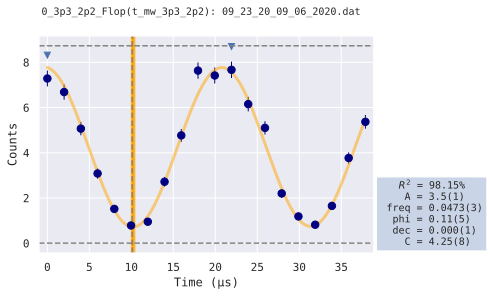

	set t_mw_3p3_2p2 = 10.2 [prev. 10.1 (2020-06-09 09:09:23)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.567791, stop 1780.624609, 
	points 11, experiment/point 60 rnd 1 show 0
	09_23_27_09_06_2020.dat [790a7]
	duration 3.32s


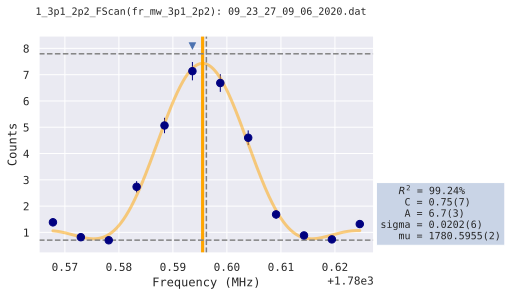

	set fr_mw_3p1_2p2 = 1780.5955 [prev. 1780.5962 (2020-06-09 09:09:28)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 165.000000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_23_32_09_06_2020.dat [89884]
	duration 4.92s


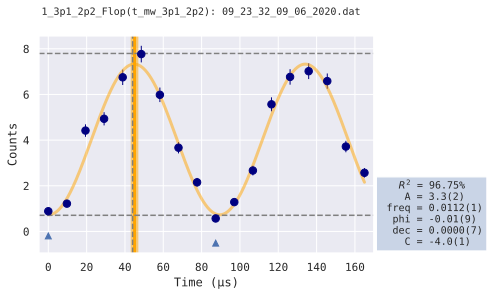

	set t_mw_3p1_2p2 = 45.0 [prev. 44.0 (2020-06-09 09:09:34)]	 fit OK

End session: 2020-06-09-09-23-15
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:22.541323
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:23:37.959873
Please wait...
---------------------------------- 



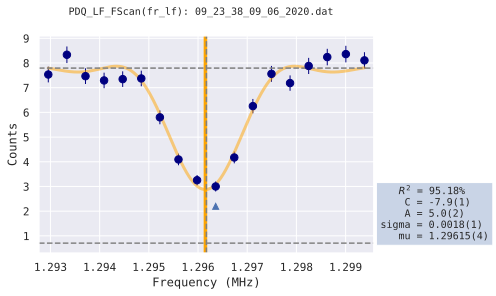

	set fr_lf = 1.29615 [prev. 1.29617 (2020-06-09 09:22:58)]	 fit OK



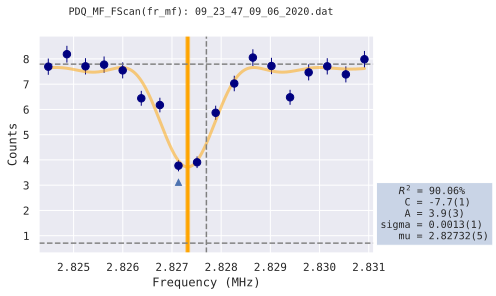

	set fr_mf = 2.82732 [prev. 2.8277 (2020-06-09 09:23:07)]	 fit OK



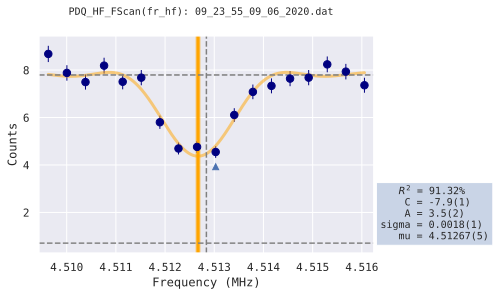

	set fr_hf = 4.51267 [prev. 4.51284 (2020-06-09 09:23:15)]	 fit OK

End session: 2020-06-09-09-23-37
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:24.913202
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:24:02.873436
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.954451, stop 1775.199549, 
	points 11, experiment/point 60 rnd 1 show 0
	09_24_03_09_06_2020.dat [a59b3]
	duration 3.52s


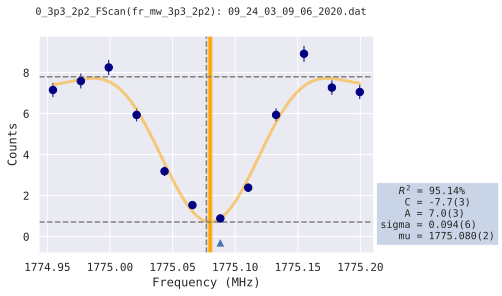

	set fr_mw_3p3_2p2 = 1775.08 [prev. 1775.077 (2020-06-09 09:23:19)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 38.250000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_24_08_09_06_2020.dat [764e9]
	duration 5.44s


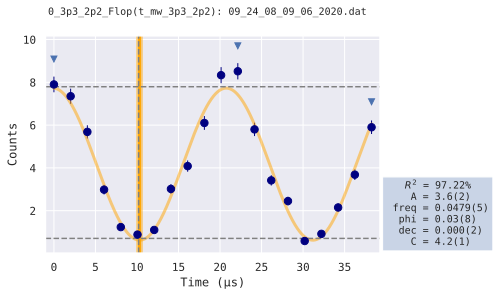

	set t_mw_3p3_2p2 = 10.3 [prev. 10.2 (2020-06-09 09:23:26)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.567722, stop 1780.623278, 
	points 11, experiment/point 60 rnd 1 show 0
	09_24_15_09_06_2020.dat [adcf2]
	duration 3.22s


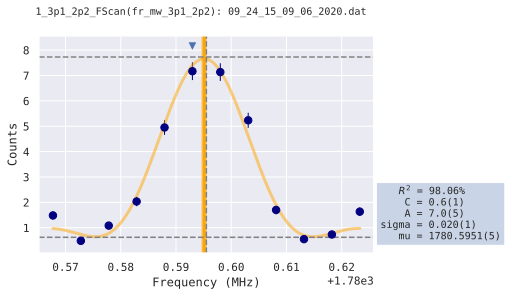

	set fr_mw_3p1_2p2 = 1780.5951 [prev. 1780.5955 (2020-06-09 09:23:31)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 168.750000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_24_20_09_06_2020.dat [30264]
	duration 5.03s


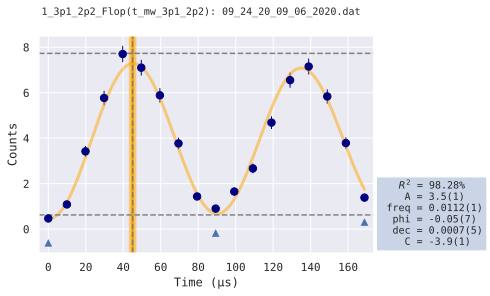

	set t_mw_3p1_2p2 = 45.0 [prev. 45.0 (2020-06-09 09:23:37)]	 fit OK

End session: 2020-06-09-09-24-02
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:22.994916
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:24:25.868802
Please wait...
---------------------------------- 



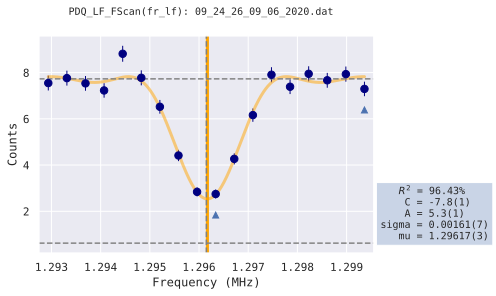

	set fr_lf = 1.29617 [prev. 1.29615 (2020-06-09 09:23:46)]	 fit OK



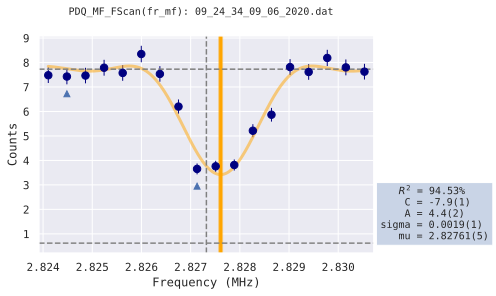

	set fr_mf = 2.82761 [prev. 2.82732 (2020-06-09 09:23:54)]	 fit OK



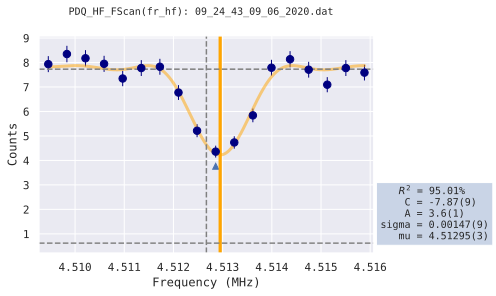

	set fr_hf = 4.51295 [prev. 4.51267 (2020-06-09 09:24:02)]	 fit OK

End session: 2020-06-09-09-24-25
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:24.697472
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:24:50.566620
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.958641, stop 1775.201359, 
	points 11, experiment/point 60 rnd 1 show 0
	09_24_51_09_06_2020.dat [64885]
	duration 3.22s


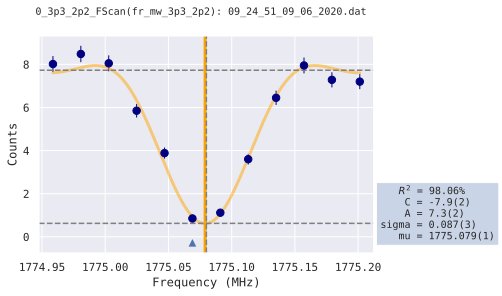

	set fr_mw_3p3_2p2 = 1775.079 [prev. 1775.08 (2020-06-09 09:24:07)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 38.625000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_24_56_09_06_2020.dat [4fadf]
	duration 5.34s


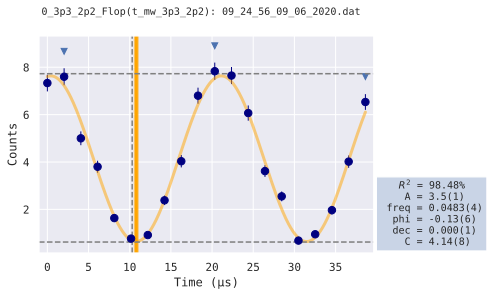

	set t_mw_3p3_2p2 = 10.8 [prev. 10.3 (2020-06-09 09:24:14)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.567322, stop 1780.622878, 
	points 11, experiment/point 60 rnd 1 show 0
	09_25_03_09_06_2020.dat [25f11]
	duration 3.42s


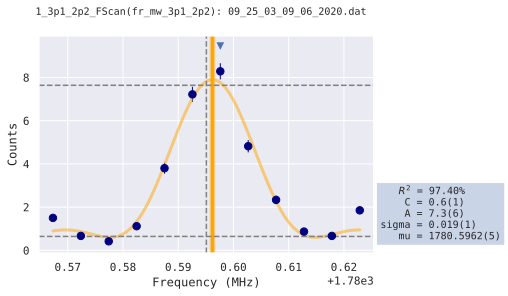

	set fr_mw_3p1_2p2 = 1780.5962 [prev. 1780.5951 (2020-06-09 09:24:19)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 168.750000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_25_08_09_06_2020.dat [7e5e6]
	duration 4.92s


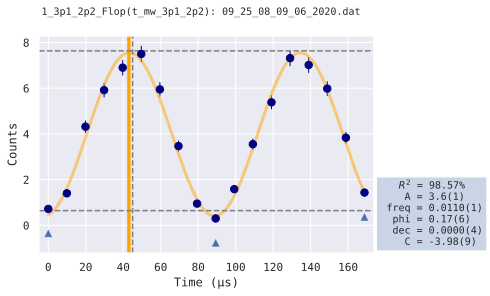

	set t_mw_3p1_2p2 = 43.0 [prev. 45.0 (2020-06-09 09:24:25)]	 fit OK

End session: 2020-06-09-09-24-50
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:23.017571
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:25:13.584558
Please wait...
---------------------------------- 



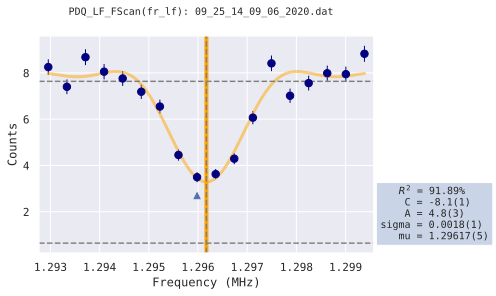

	set fr_lf = 1.29617 [prev. 1.29617 (2020-06-09 09:24:34)]	 fit OK



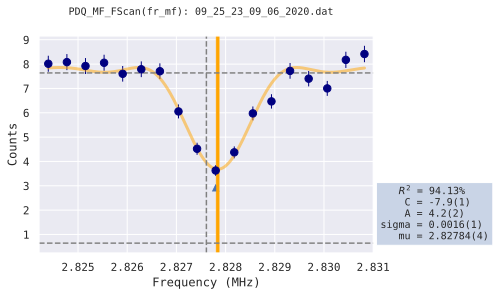

	set fr_mf = 2.82784 [prev. 2.82761 (2020-06-09 09:24:42)]	 fit OK



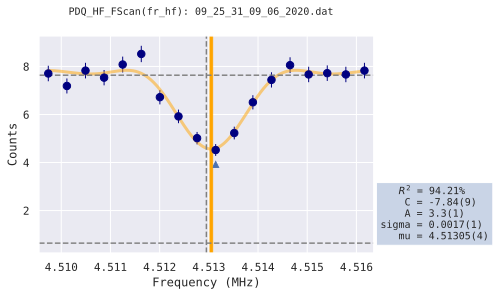

	set fr_hf = 4.51305 [prev. 4.51295 (2020-06-09 09:24:50)]	 fit OK

End session: 2020-06-09-09-25-13
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:25.273385
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:25:38.858291
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.963259, stop 1775.194741, 
	points 11, experiment/point 60 rnd 1 show 0
	09_25_39_09_06_2020.dat [637ca]
	duration 3.22s


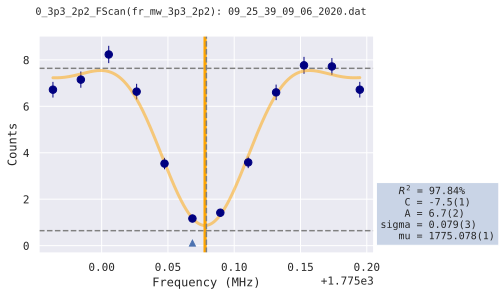

	set fr_mw_3p3_2p2 = 1775.078 [prev. 1775.079 (2020-06-09 09:24:55)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 40.500000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_25_44_09_06_2020.dat [baf11]
	duration 5.42s


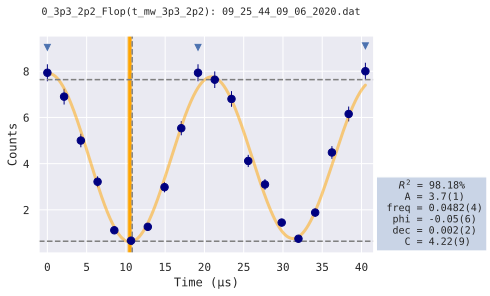

	set t_mw_3p3_2p2 = 10.5 [prev. 10.8 (2020-06-09 09:25:02)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.567130, stop 1780.625270, 
	points 11, experiment/point 60 rnd 1 show 0
	09_25_51_09_06_2020.dat [9def3]
	duration 3.22s


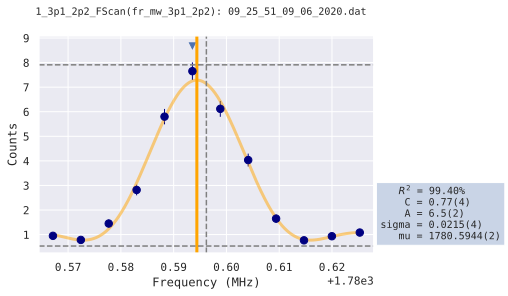

	set fr_mw_3p1_2p2 = 1780.5944 [prev. 1780.5962 (2020-06-09 09:25:07)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 161.250000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_25_55_09_06_2020.dat [97277]
	duration 5.12s


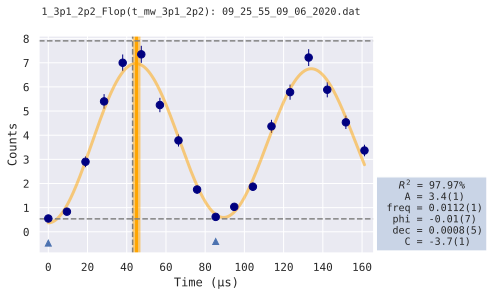

	set t_mw_3p1_2p2 = 45.0 [prev. 43.0 (2020-06-09 09:25:13)]	 fit OK

End session: 2020-06-09-09-25-38
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:23.083802
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:26:01.942705
Please wait...
---------------------------------- 



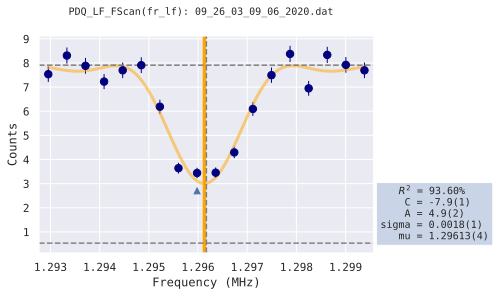

	set fr_lf = 1.29613 [prev. 1.29617 (2020-06-09 09:25:22)]	 fit OK



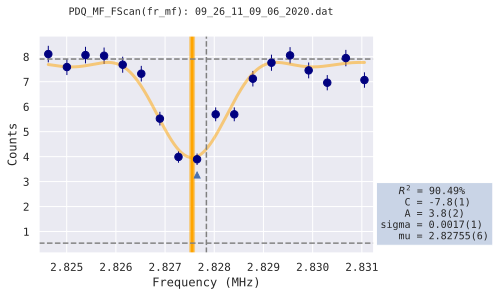

	set fr_mf = 2.82755 [prev. 2.82784 (2020-06-09 09:25:30)]	 fit OK



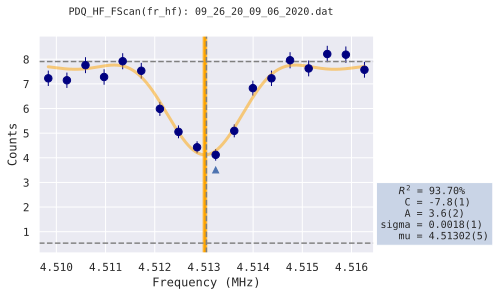

	set fr_hf = 4.51302 [prev. 4.51305 (2020-06-09 09:25:38)]	 fit OK

End session: 2020-06-09-09-26-01
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:25.698595
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:26:27.641536
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.958952, stop 1775.197048, 
	points 11, experiment/point 60 rnd 1 show 0
	09_26_28_09_06_2020.dat [dc33c]
	duration 3.22s


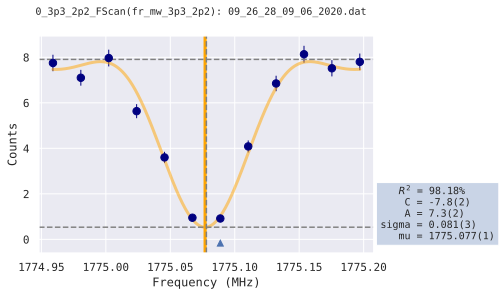

	set fr_mw_3p3_2p2 = 1775.077 [prev. 1775.078 (2020-06-09 09:25:43)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 39.375000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_26_33_09_06_2020.dat [4f6c2]
	duration 5.45s


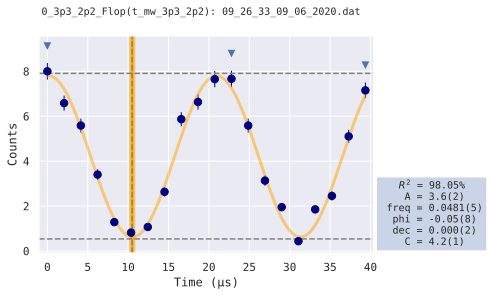

	set t_mw_3p3_2p2 = 10.5 [prev. 10.5 (2020-06-09 09:25:50)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.566622, stop 1780.622178, 
	points 11, experiment/point 60 rnd 1 show 0
	09_26_40_09_06_2020.dat [9f24e]
	duration 3.53s


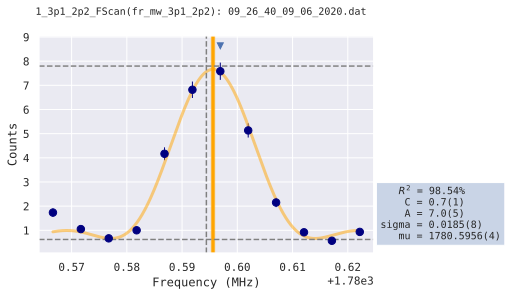

	set fr_mw_3p1_2p2 = 1780.5956 [prev. 1780.5944 (2020-06-09 09:25:54)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 168.750000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_26_45_09_06_2020.dat [45fb4]
	duration 5.13s


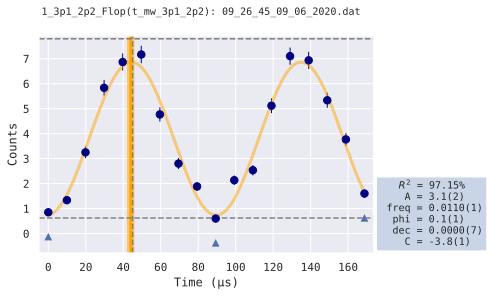

	set t_mw_3p1_2p2 = 44.0 [prev. 45.0 (2020-06-09 09:26:01)]	 fit OK

End session: 2020-06-09-09-26-27
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:23.539324
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:26:51.181236
Please wait...
---------------------------------- 



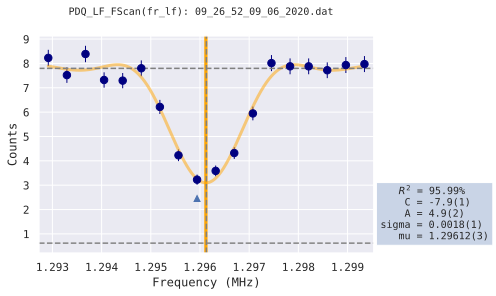

	set fr_lf = 1.29612 [prev. 1.29613 (2020-06-09 09:26:10)]	 fit OK



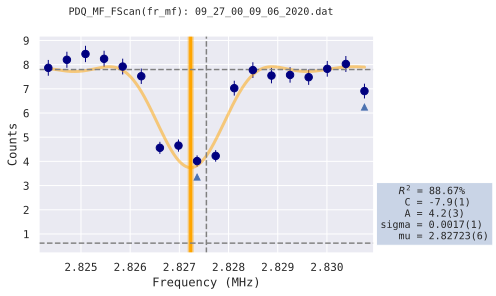

	set fr_mf = 2.82723 [prev. 2.82755 (2020-06-09 09:26:19)]	 fit OK



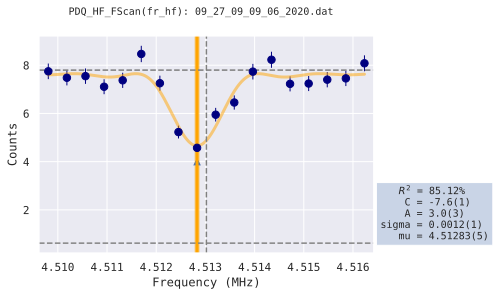

	set fr_hf = 4.51283 [prev. 4.51302 (2020-06-09 09:26:27)]	 fit OK

End session: 2020-06-09-09-26-51
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:25.096659
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:27:16.278250
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.957952, stop 1775.196048, 
	points 11, experiment/point 60 rnd 1 show 0
	09_27_17_09_06_2020.dat [01a6c]
	duration 3.22s


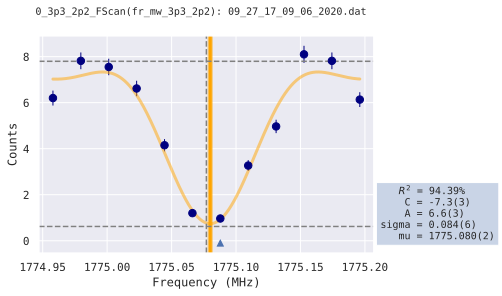

	set fr_mw_3p3_2p2 = 1775.08 [prev. 1775.077 (2020-06-09 09:26:32)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 39.375000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_27_21_09_06_2020.dat [bb65c]
	duration 5.52s


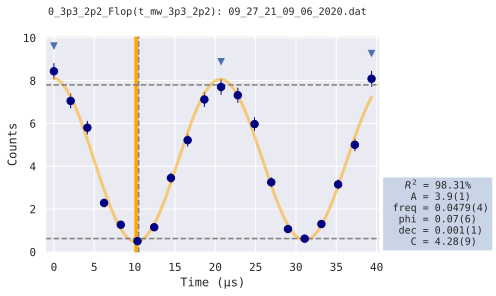

	set t_mw_3p3_2p2 = 10.2 [prev. 10.5 (2020-06-09 09:26:39)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.567191, stop 1780.624009, 
	points 11, experiment/point 60 rnd 1 show 0
	09_27_28_09_06_2020.dat [875fc]
	duration 3.24s


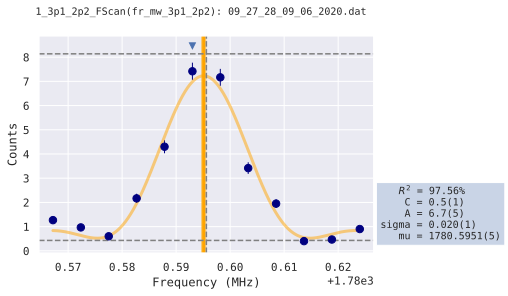

	set fr_mw_3p1_2p2 = 1780.5951 [prev. 1780.5956 (2020-06-09 09:26:44)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 165.000000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_27_33_09_06_2020.dat [e1e1c]
	duration 5.02s


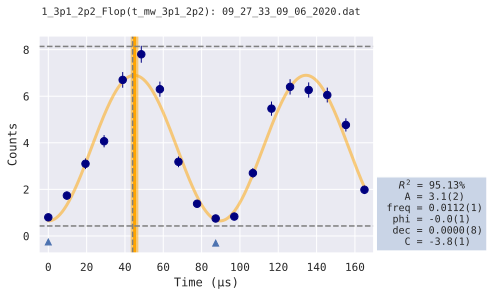

	set t_mw_3p1_2p2 = 45.0 [prev. 44.0 (2020-06-09 09:26:51)]	 fit OK

End session: 2020-06-09-09-27-16
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:23.218228
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:27:39.497445
Please wait...
---------------------------------- 



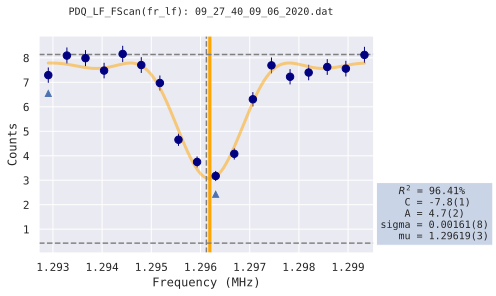

	set fr_lf = 1.29619 [prev. 1.29612 (2020-06-09 09:26:59)]	 fit OK



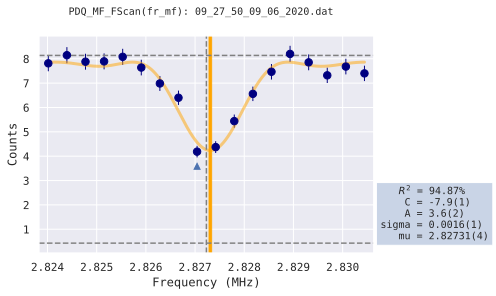

	set fr_mf = 2.82731 [prev. 2.82723 (2020-06-09 09:27:08)]	 fit OK



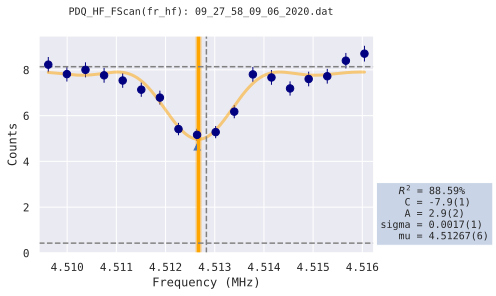

	set fr_hf = 4.51267 [prev. 4.51283 (2020-06-09 09:27:16)]	 fit OK

End session: 2020-06-09-09-27-39
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:26.338607
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:28:05.836440
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.957451, stop 1775.202549, 
	points 11, experiment/point 60 rnd 1 show 0
	09_28_06_09_06_2020.dat [c8760]
	duration 3.24s


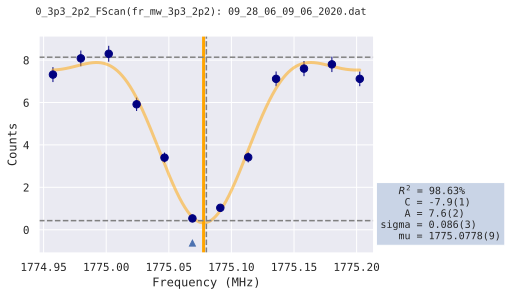

	set fr_mw_3p3_2p2 = 1775.0778 [prev. 1775.08 (2020-06-09 09:27:20)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 38.250000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_28_11_09_06_2020.dat [ca5d9]
	duration 5.32s


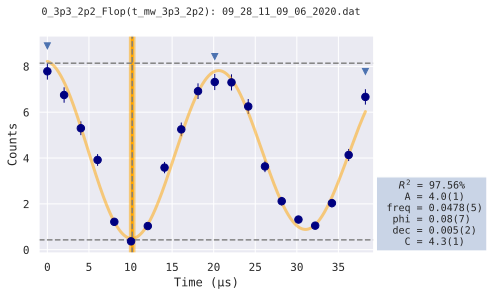

	set t_mw_3p3_2p2 = 10.2 [prev. 10.2 (2020-06-09 09:27:27)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.567322, stop 1780.622878, 
	points 11, experiment/point 60 rnd 1 show 0
	09_28_18_09_06_2020.dat [66c56]
	duration 3.23s


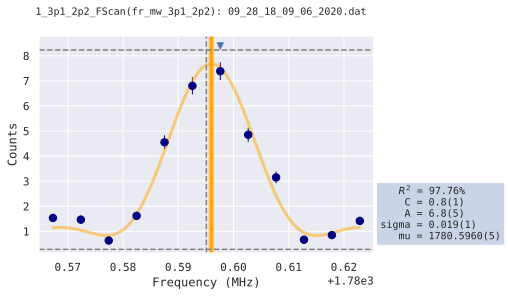

	set fr_mw_3p1_2p2 = 1780.596 [prev. 1780.5951 (2020-06-09 09:27:32)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 168.750000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_28_22_09_06_2020.dat [e8b16]
	duration 4.93s


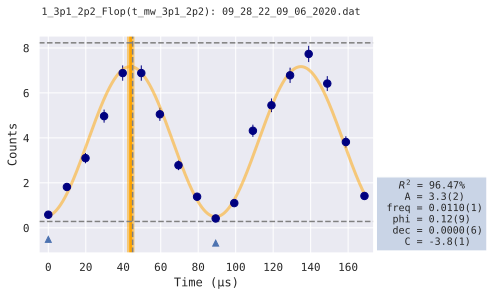

	set t_mw_3p1_2p2 = 44.0 [prev. 45.0 (2020-06-09 09:27:39)]	 fit OK

End session: 2020-06-09-09-28-05
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:22.540005
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:28:28.376902
Please wait...
---------------------------------- 



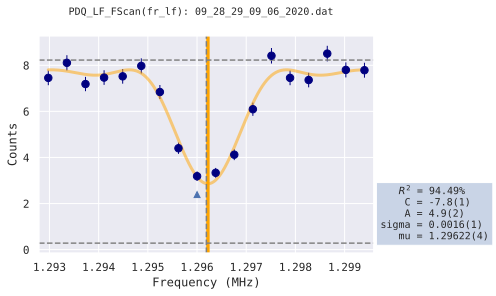

	set fr_lf = 1.29622 [prev. 1.29619 (2020-06-09 09:27:49)]	 fit OK



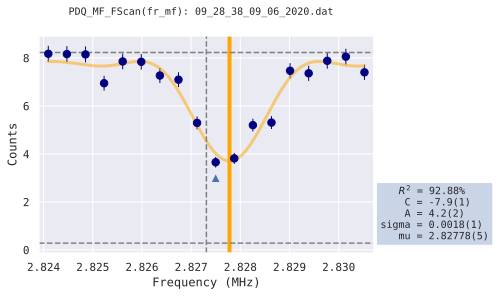

	set fr_mf = 2.82778 [prev. 2.82731 (2020-06-09 09:27:57)]	 fit OK



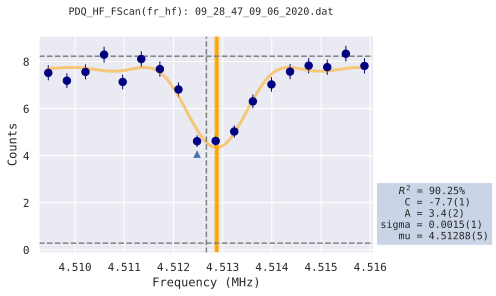

	set fr_hf = 4.51288 [prev. 4.51267 (2020-06-09 09:28:05)]	 fit OK

End session: 2020-06-09-09-28-28
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:26.725029
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:28:55.102612
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.955251, stop 1775.200349, 
	points 11, experiment/point 60 rnd 1 show 0
	09_28_56_09_06_2020.dat [68406]
	duration 3.33s


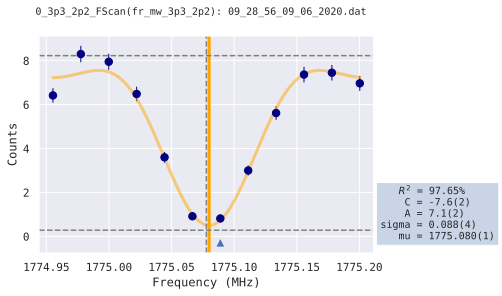

	set fr_mw_3p3_2p2 = 1775.08 [prev. 1775.0778 (2020-06-09 09:28:10)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 38.250000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_29_00_09_06_2020.dat [59848]
	duration 5.32s


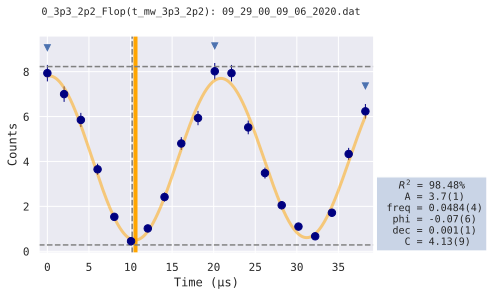

	set t_mw_3p3_2p2 = 10.6 [prev. 10.2 (2020-06-09 09:28:17)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.567591, stop 1780.624409, 
	points 11, experiment/point 60 rnd 1 show 0
	09_29_07_09_06_2020.dat [66d5e]
	duration 3.33s


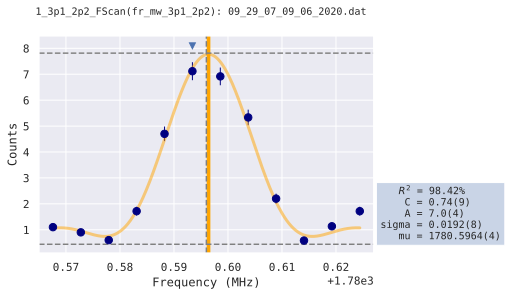

	set fr_mw_3p1_2p2 = 1780.5964 [prev. 1780.596 (2020-06-09 09:28:22)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 165.000000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_29_12_09_06_2020.dat [38014]
	duration 5.03s


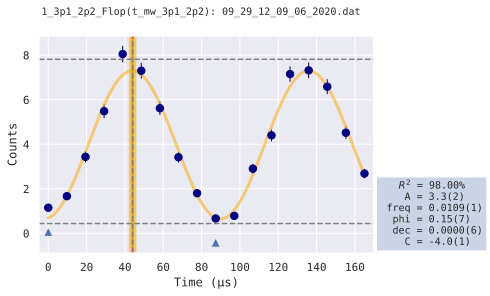

	set t_mw_3p1_2p2 = 44.0 [prev. 44.0 (2020-06-09 09:28:28)]	 fit OK

End session: 2020-06-09-09-28-55
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:22.809872
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:29:17.912848
Please wait...
---------------------------------- 



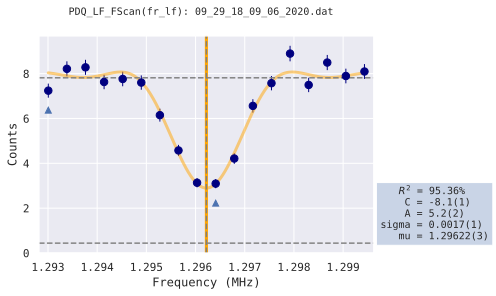

	set fr_lf = 1.29622 [prev. 1.29622 (2020-06-09 09:28:37)]	 fit OK



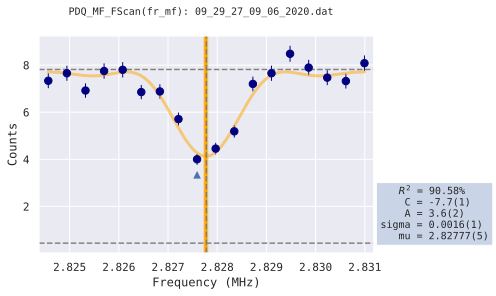

	set fr_mf = 2.82777 [prev. 2.82778 (2020-06-09 09:28:46)]	 fit OK



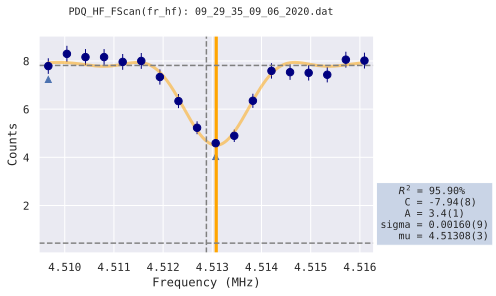

	set fr_hf = 4.51308 [prev. 4.51288 (2020-06-09 09:28:55)]	 fit OK

End session: 2020-06-09-09-29-17
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:25.137942
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:29:43.051158
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.962075, stop 1775.197925, 
	points 11, experiment/point 60 rnd 1 show 0
	09_29_43_09_06_2020.dat [4c7a2]
	duration 3.32s


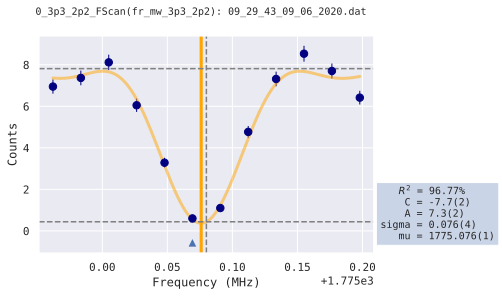

	set fr_mw_3p3_2p2 = 1775.076 [prev. 1775.08 (2020-06-09 09:28:59)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 39.750000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_29_48_09_06_2020.dat [9bde7]
	duration 5.34s


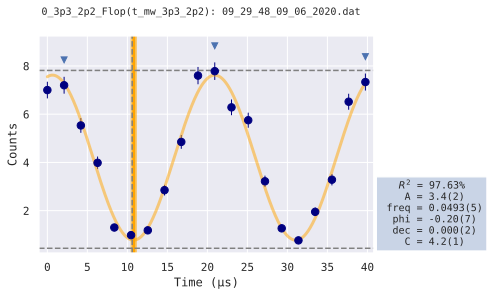

	set t_mw_3p3_2p2 = 10.8 [prev. 10.6 (2020-06-09 09:29:06)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.567991, stop 1780.624809, 
	points 11, experiment/point 60 rnd 1 show 0
	09_29_55_09_06_2020.dat [eceab]
	duration 3.22s


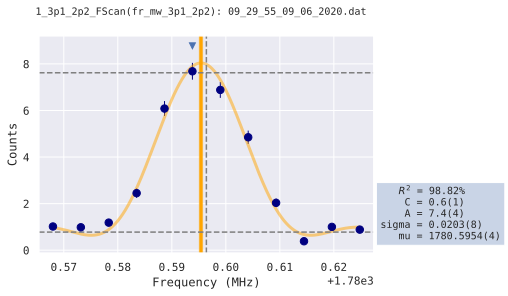

	set fr_mw_3p1_2p2 = 1780.5954 [prev. 1780.5964 (2020-06-09 09:29:11)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 165.000000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_30_00_09_06_2020.dat [5db8a]
	duration 4.92s


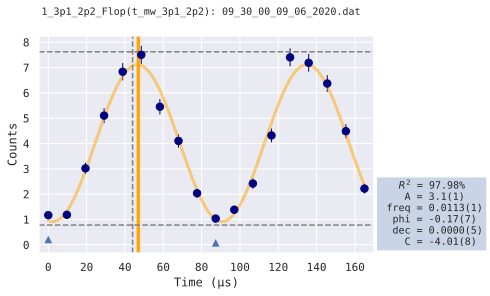

	set t_mw_3p1_2p2 = 47.0 [prev. 44.0 (2020-06-09 09:29:17)]	 fit OK

End session: 2020-06-09-09-29-43
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:22.422874
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:30:05.474380
Please wait...
---------------------------------- 



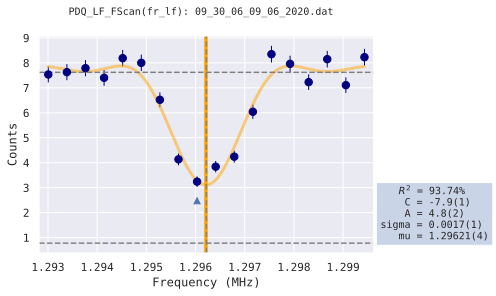

	set fr_lf = 1.29621 [prev. 1.29622 (2020-06-09 09:29:26)]	 fit OK



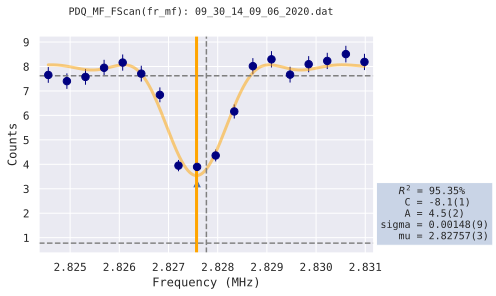

	set fr_mf = 2.82757 [prev. 2.82777 (2020-06-09 09:29:34)]	 fit OK



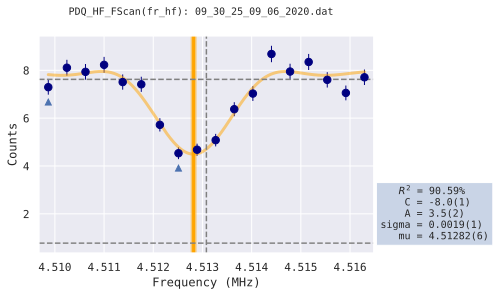

	set fr_hf = 4.51282 [prev. 4.51308 (2020-06-09 09:29:43)]	 fit OK

End session: 2020-06-09-09-30-05
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:26.938204
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:30:32.413012
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.960259, stop 1775.191741, 
	points 11, experiment/point 60 rnd 1 show 0
	09_30_33_09_06_2020.dat [d40bb]
	duration 3.32s


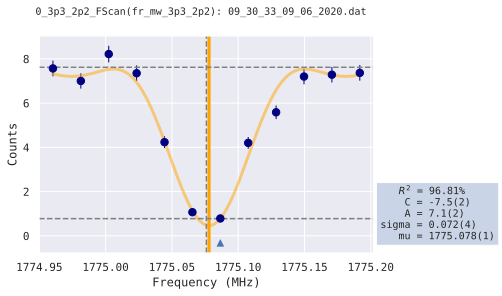

	set fr_mw_3p3_2p2 = 1775.078 [prev. 1775.076 (2020-06-09 09:29:47)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 40.500000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_30_38_09_06_2020.dat [666aa]
	duration 5.42s


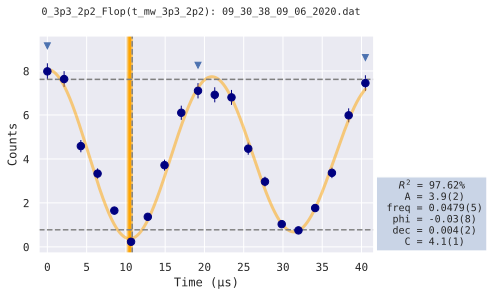

	set t_mw_3p3_2p2 = 10.5 [prev. 10.8 (2020-06-09 09:29:54)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.568804, stop 1780.621996, 
	points 11, experiment/point 60 rnd 1 show 0
	09_30_44_09_06_2020.dat [b4258]
	duration 3.32s


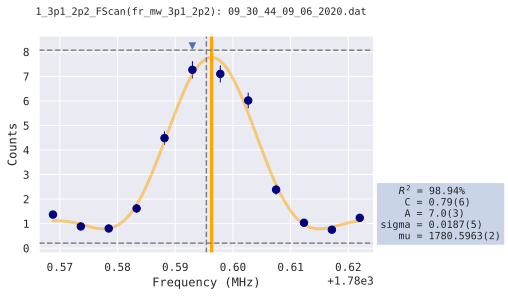

	set fr_mw_3p1_2p2 = 1780.5963 [prev. 1780.5954 (2020-06-09 09:29:59)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 176.250000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_30_49_09_06_2020.dat [ba662]
	duration 5.02s


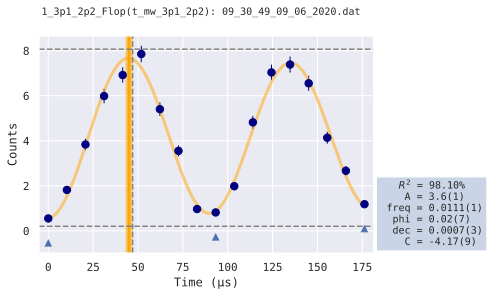

	set t_mw_3p1_2p2 = 45.0 [prev. 47.0 (2020-06-09 09:30:05)]	 fit OK

End session: 2020-06-09-09-30-32
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:22.919917
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:30:55.333330
Please wait...
---------------------------------- 



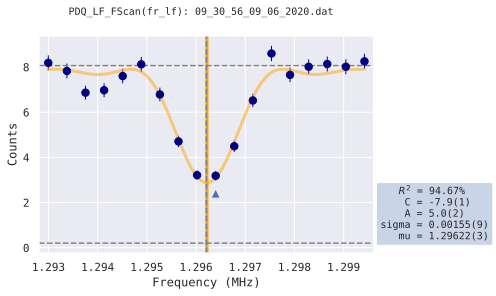

	set fr_lf = 1.29622 [prev. 1.29621 (2020-06-09 09:30:13)]	 fit OK



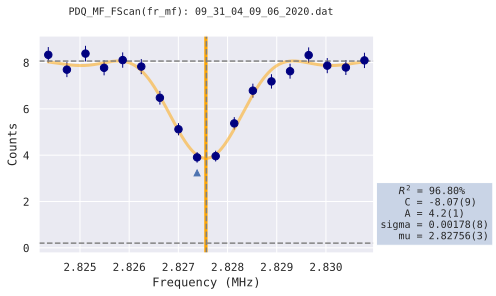

	set fr_mf = 2.82756 [prev. 2.82757 (2020-06-09 09:30:23)]	 fit OK



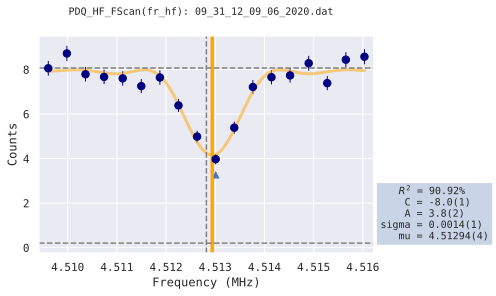

	set fr_hf = 4.51294 [prev. 4.51282 (2020-06-09 09:30:32)]	 fit OK

End session: 2020-06-09-09-30-55
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:24.822062
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:31:20.155805
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.958952, stop 1775.197048, 
	points 11, experiment/point 60 rnd 1 show 0
	09_31_21_09_06_2020.dat [33da7]
	duration 3.22s


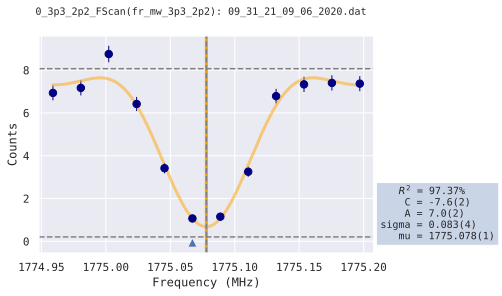

	set fr_mw_3p3_2p2 = 1775.078 [prev. 1775.078 (2020-06-09 09:30:37)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 39.375000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_31_25_09_06_2020.dat [7b2f6]
	duration 5.53s


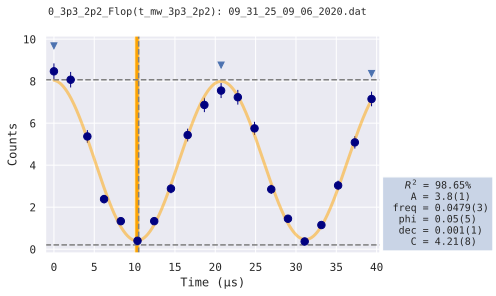

	set t_mw_3p3_2p2 = 10.3 [prev. 10.5 (2020-06-09 09:30:43)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.568522, stop 1780.624078, 
	points 11, experiment/point 60 rnd 1 show 0
	09_31_33_09_06_2020.dat [c58db]
	duration 3.34s


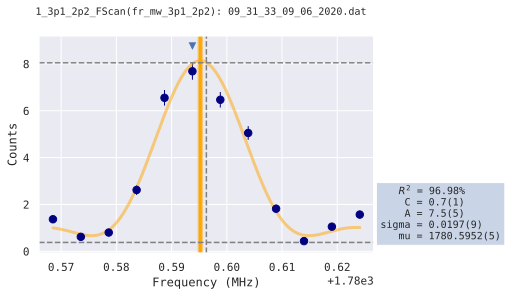

	set fr_mw_3p1_2p2 = 1780.5952 [prev. 1780.5963 (2020-06-09 09:30:48)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 168.750000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_31_37_09_06_2020.dat [cecb1]
	duration 5.02s


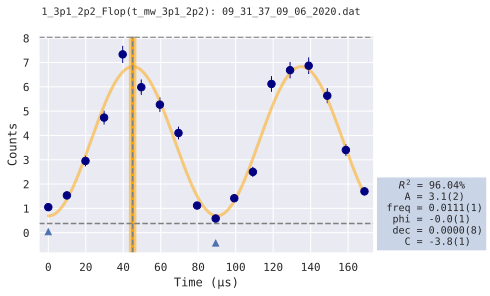

	set t_mw_3p1_2p2 = 45.0 [prev. 45.0 (2020-06-09 09:30:55)]	 fit OK

End session: 2020-06-09-09-31-20
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:23.330370
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:31:43.486584
Please wait...
---------------------------------- 



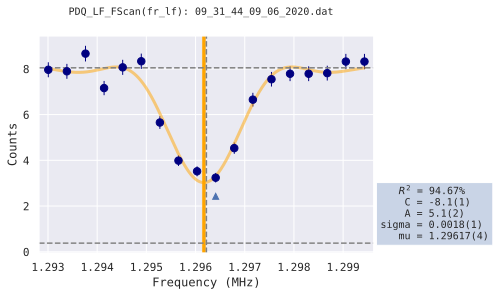

	set fr_lf = 1.29617 [prev. 1.29622 (2020-06-09 09:31:03)]	 fit OK



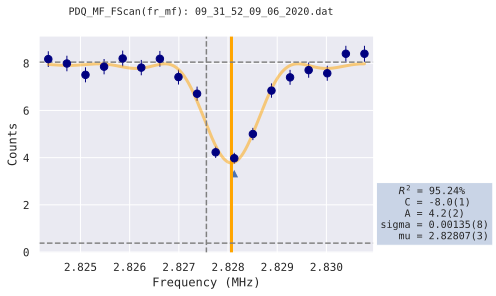

	set fr_mf = 2.82807 [prev. 2.82756 (2020-06-09 09:31:11)]	 fit OK



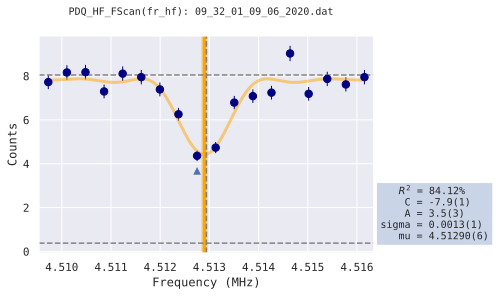

	set fr_hf = 4.5129 [prev. 4.51294 (2020-06-09 09:31:20)]	 fit OK

End session: 2020-06-09-09-31-43
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:24.912719
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:32:08.399710
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.956641, stop 1775.199359, 
	points 11, experiment/point 60 rnd 1 show 0
	09_32_09_09_06_2020.dat [1ffd8]
	duration 3.22s


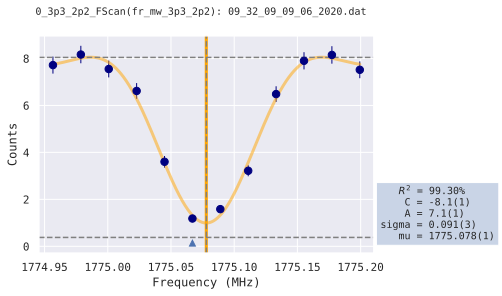

	set fr_mw_3p3_2p2 = 1775.0779 [prev. 1775.078 (2020-06-09 09:31:24)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 38.625000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_32_13_09_06_2020.dat [cbd53]
	duration 5.32s


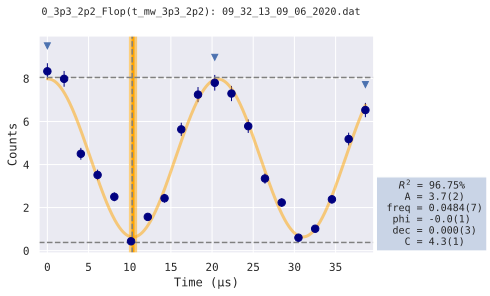

	set t_mw_3p3_2p2 = 10.4 [prev. 10.3 (2020-06-09 09:31:32)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.567422, stop 1780.622978, 
	points 11, experiment/point 60 rnd 1 show 0
	09_32_20_09_06_2020.dat [7c19c]
	duration 3.63s


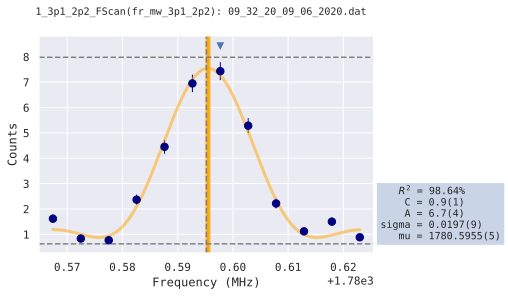

	set fr_mw_3p1_2p2 = 1780.5955 [prev. 1780.5952 (2020-06-09 09:31:36)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 168.750000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_32_27_09_06_2020.dat [61fbe]
	duration 5.23s


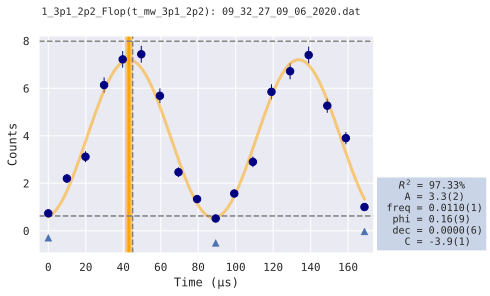

	set t_mw_3p1_2p2 = 43.0 [prev. 45.0 (2020-06-09 09:31:43)]	 fit OK

End session: 2020-06-09-09-32-08
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:24.564834
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:32:32.964864
Please wait...
---------------------------------- 



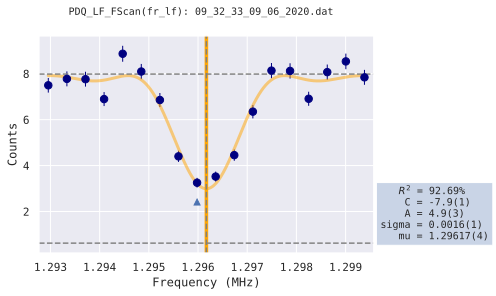

	set fr_lf = 1.29617 [prev. 1.29617 (2020-06-09 09:31:51)]	 fit OK



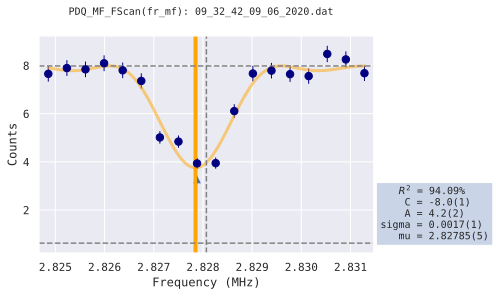

	set fr_mf = 2.82785 [prev. 2.82807 (2020-06-09 09:32:00)]	 fit OK



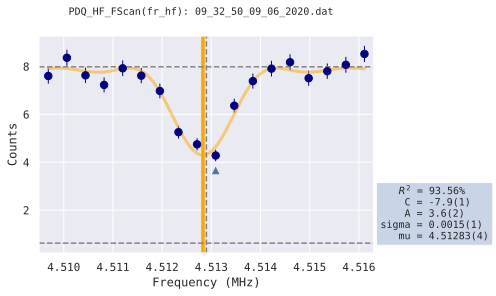

	set fr_hf = 4.51283 [prev. 4.5129 (2020-06-09 09:32:08)]	 fit OK

End session: 2020-06-09-09-32-32
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:24.911989
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:32:57.877228
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.957708, stop 1775.198092, 
	points 11, experiment/point 60 rnd 1 show 0
	09_32_58_09_06_2020.dat [f1130]
	duration 3.23s


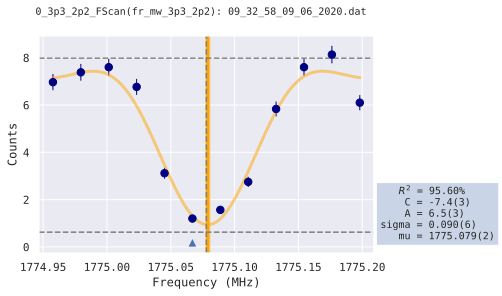

	set fr_mw_3p3_2p2 = 1775.079 [prev. 1775.0779 (2020-06-09 09:32:12)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 39.000000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_33_03_09_06_2020.dat [61d84]
	duration 5.42s


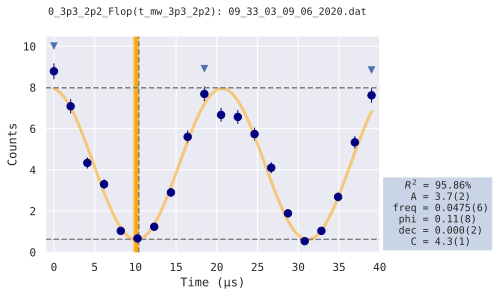

	set t_mw_3p3_2p2 = 10.1 [prev. 10.4 (2020-06-09 09:32:20)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.566430, stop 1780.624570, 
	points 11, experiment/point 60 rnd 1 show 0
	09_33_10_09_06_2020.dat [45ab1]
	duration 3.43s


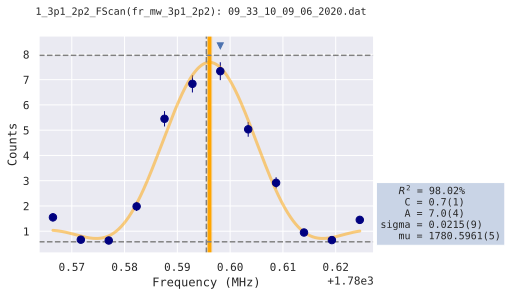

	set fr_mw_3p1_2p2 = 1780.5961 [prev. 1780.5955 (2020-06-09 09:32:26)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 161.250000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_33_15_09_06_2020.dat [29f06]
	duration 5.04s


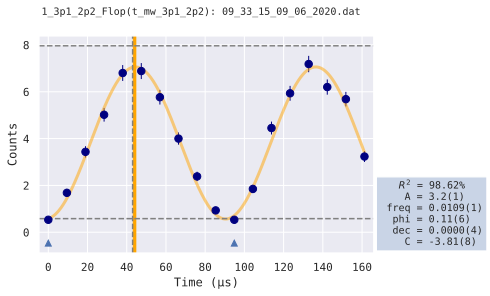

	set t_mw_3p1_2p2 = 44.0 [prev. 43.0 (2020-06-09 09:32:32)]	 fit OK

End session: 2020-06-09-09-32-57
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:23.464947
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:33:21.342398
Please wait...
---------------------------------- 



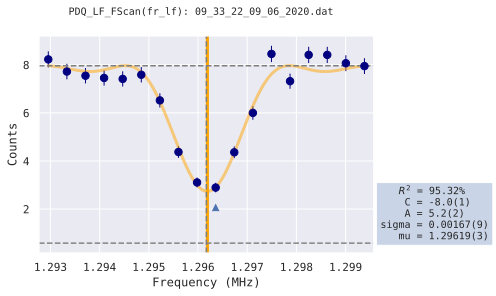

	set fr_lf = 1.29619 [prev. 1.29617 (2020-06-09 09:32:41)]	 fit OK



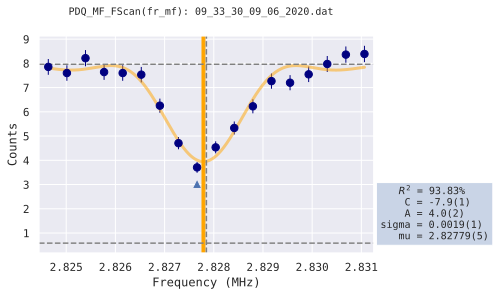

	set fr_mf = 2.82779 [prev. 2.82785 (2020-06-09 09:32:49)]	 fit OK



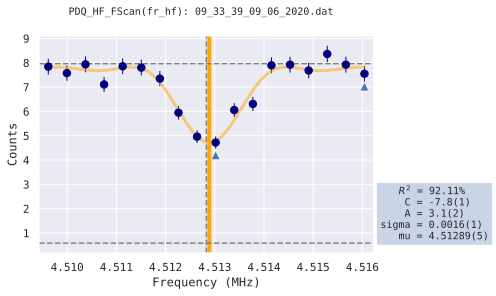

	set fr_hf = 4.51289 [prev. 4.51283 (2020-06-09 09:32:57)]	 fit OK

End session: 2020-06-09-09-33-21
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:25.248959
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:33:46.591797
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.955238, stop 1775.202762, 
	points 11, experiment/point 60 rnd 1 show 0
	09_33_47_09_06_2020.dat [d2c62]
	duration 3.22s


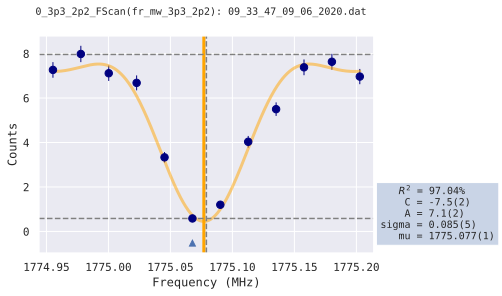

	set fr_mw_3p3_2p2 = 1775.077 [prev. 1775.079 (2020-06-09 09:33:02)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 37.875000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_33_52_09_06_2020.dat [3269a]
	duration 5.42s


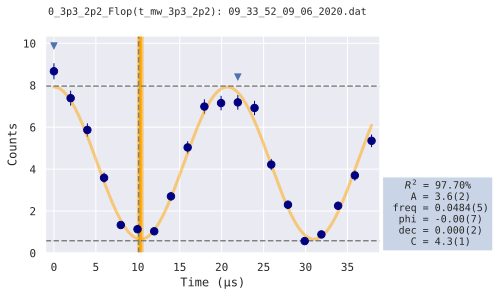

	set t_mw_3p3_2p2 = 10.3 [prev. 10.1 (2020-06-09 09:33:09)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.567691, stop 1780.624509, 
	points 11, experiment/point 60 rnd 1 show 0
	09_33_58_09_06_2020.dat [9b502]
	duration 3.32s


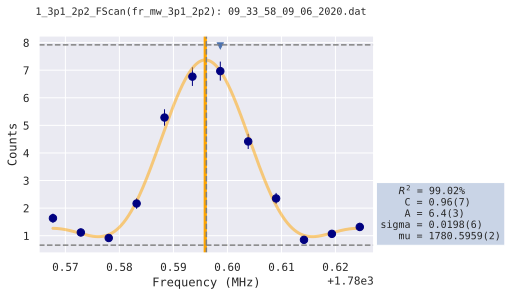

	set fr_mw_3p1_2p2 = 1780.5959 [prev. 1780.5961 (2020-06-09 09:33:14)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 165.000000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_34_03_09_06_2020.dat [00d2f]
	duration 5.13s


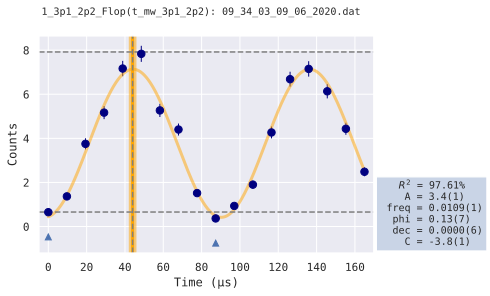

	set t_mw_3p1_2p2 = 44.0 [prev. 44.0 (2020-06-09 09:33:21)]	 fit OK

End session: 2020-06-09-09-33-46
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:23.197692
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:34:09.790251
Please wait...
---------------------------------- 



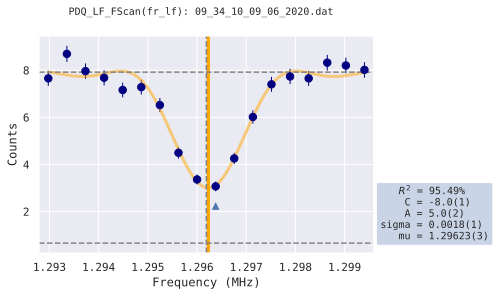

	set fr_lf = 1.29623 [prev. 1.29619 (2020-06-09 09:33:29)]	 fit OK



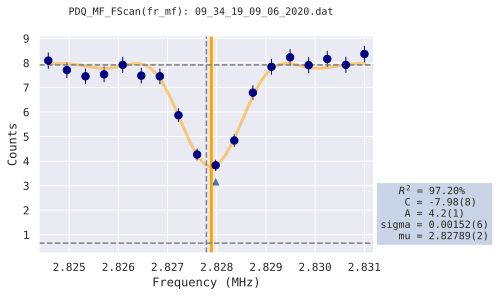

	set fr_mf = 2.82789 [prev. 2.82779 (2020-06-09 09:33:38)]	 fit OK



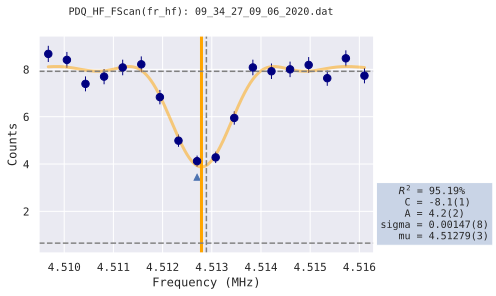

	set fr_hf = 4.51279 [prev. 4.51289 (2020-06-09 09:33:46)]	 fit OK

End session: 2020-06-09-09-34-09
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:25.052126
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:34:34.842744
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.955641, stop 1775.198359, 
	points 11, experiment/point 60 rnd 1 show 0
	09_34_35_09_06_2020.dat [6ea13]
	duration 3.22s


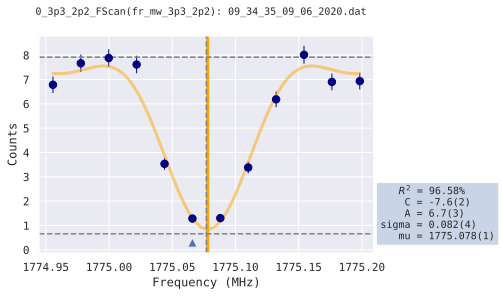

	set fr_mw_3p3_2p2 = 1775.078 [prev. 1775.077 (2020-06-09 09:33:51)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 38.625000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_34_40_09_06_2020.dat [86c42]
	duration 5.72s


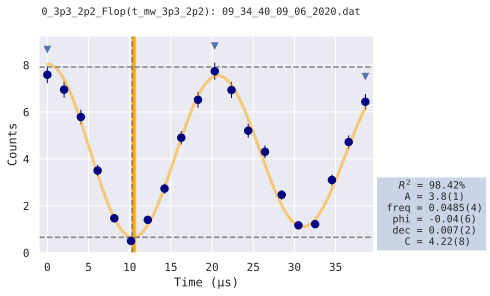

	set t_mw_3p3_2p2 = 10.5 [prev. 10.3 (2020-06-09 09:33:58)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.567491, stop 1780.624309, 
	points 11, experiment/point 60 rnd 1 show 0
	09_34_47_09_06_2020.dat [f43e9]
	duration 3.33s


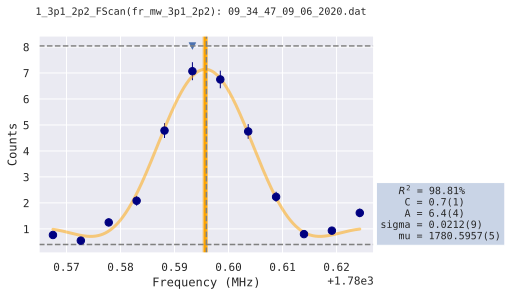

	set fr_mw_3p1_2p2 = 1780.5957 [prev. 1780.5959 (2020-06-09 09:34:02)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 165.000000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_34_52_09_06_2020.dat [ce545]
	duration 5.03s


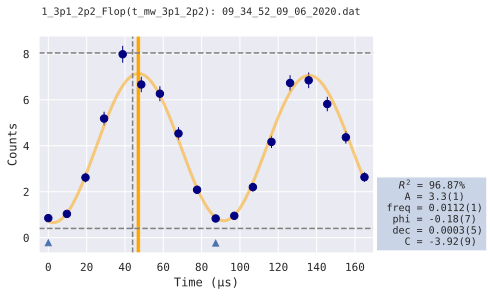

	set t_mw_3p1_2p2 = 47.0 [prev. 44.0 (2020-06-09 09:34:09)]	 fit OK

End session: 2020-06-09-09-34-34
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:23.407855
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:34:58.250969
Please wait...
---------------------------------- 



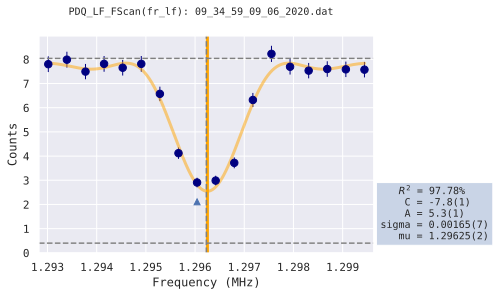

	set fr_lf = 1.29625 [prev. 1.29623 (2020-06-09 09:34:18)]	 fit OK



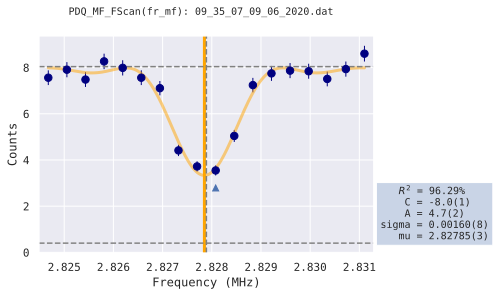

	set fr_mf = 2.82785 [prev. 2.82789 (2020-06-09 09:34:26)]	 fit OK



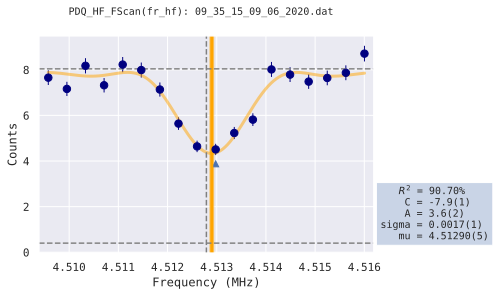

	set fr_hf = 4.5129 [prev. 4.51279 (2020-06-09 09:34:34)]	 fit OK

End session: 2020-06-09-09-34-58
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:25.063097
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:35:23.314560
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.958952, stop 1775.197048, 
	points 11, experiment/point 60 rnd 1 show 0
	09_35_24_09_06_2020.dat [b9f46]
	duration 3.32s


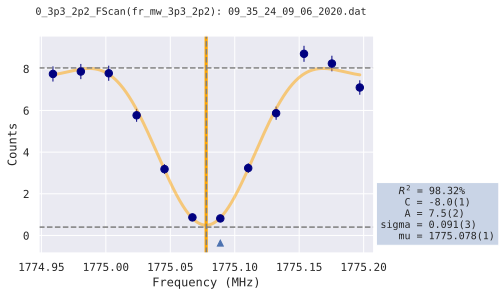

	set fr_mw_3p3_2p2 = 1775.0778 [prev. 1775.078 (2020-06-09 09:34:39)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 39.375000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_35_28_09_06_2020.dat [9c4cd]
	duration 5.43s


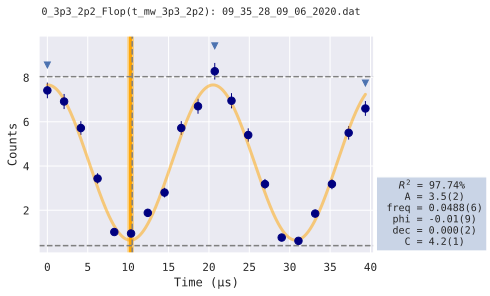

	set t_mw_3p3_2p2 = 10.3 [prev. 10.5 (2020-06-09 09:34:46)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.569104, stop 1780.622296, 
	points 11, experiment/point 60 rnd 1 show 0
	09_35_35_09_06_2020.dat [7d35a]
	duration 3.22s


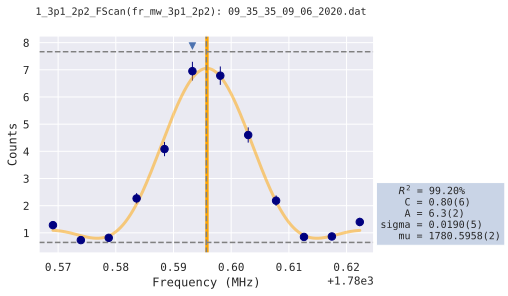

	set fr_mw_3p1_2p2 = 1780.5958 [prev. 1780.5957 (2020-06-09 09:34:51)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 176.250000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_35_40_09_06_2020.dat [1110f]
	duration 4.92s


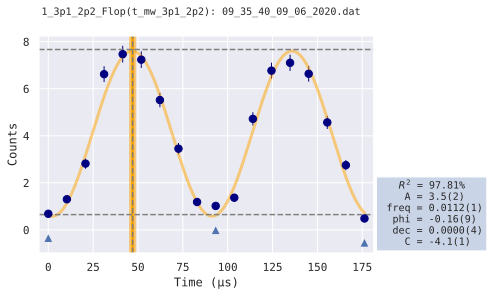

	set t_mw_3p1_2p2 = 47.0 [prev. 47.0 (2020-06-09 09:34:58)]	 fit OK

End session: 2020-06-09-09-35-23
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:22.677222
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:35:45.992155
Please wait...
---------------------------------- 



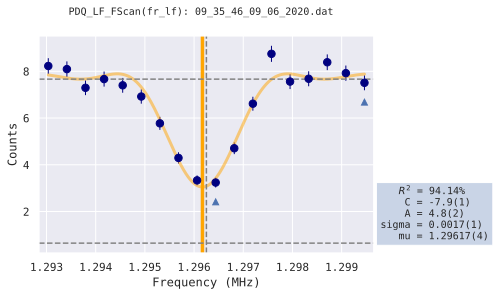

	set fr_lf = 1.29617 [prev. 1.29625 (2020-06-09 09:35:06)]	 fit OK



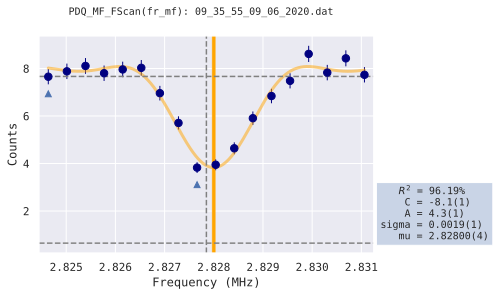

	set fr_mf = 2.828 [prev. 2.82785 (2020-06-09 09:35:14)]	 fit OK



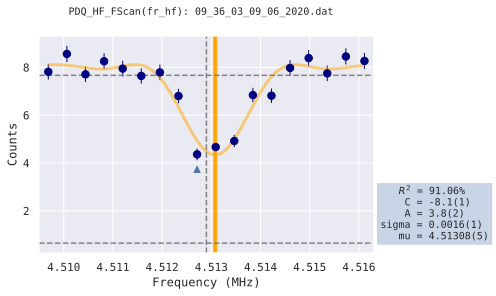

	set fr_hf = 4.51308 [prev. 4.5129 (2020-06-09 09:35:23)]	 fit OK

End session: 2020-06-09-09-35-45
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:25.022878
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:36:11.015410
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.956441, stop 1775.199159, 
	points 11, experiment/point 60 rnd 1 show 0
	09_36_11_09_06_2020.dat [29f92]
	duration 3.22s


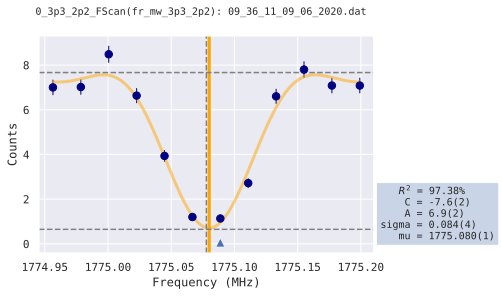

	set fr_mw_3p3_2p2 = 1775.08 [prev. 1775.0778 (2020-06-09 09:35:28)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 38.625000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_36_16_09_06_2020.dat [1a85d]
	duration 5.42s


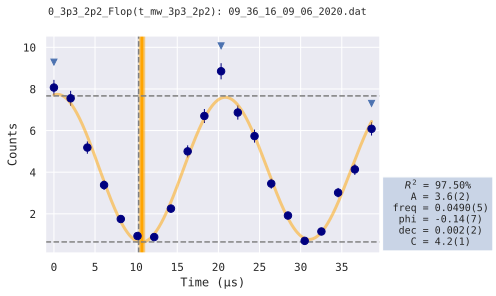

	set t_mw_3p3_2p2 = 10.7 [prev. 10.3 (2020-06-09 09:35:34)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.569204, stop 1780.622396, 
	points 11, experiment/point 60 rnd 1 show 0
	09_36_23_09_06_2020.dat [2db2d]
	duration 3.55s


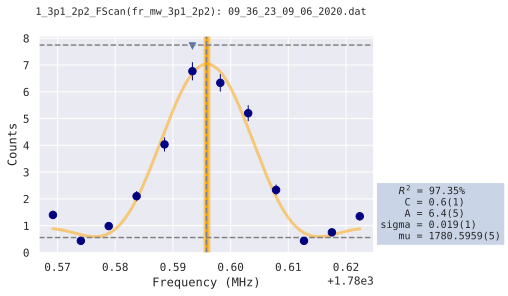

	set fr_mw_3p1_2p2 = 1780.5959 [prev. 1780.5958 (2020-06-09 09:35:39)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 176.250000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_36_28_09_06_2020.dat [65d1a]
	duration 5.03s


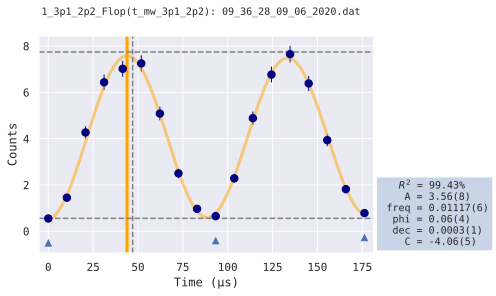

	set t_mw_3p1_2p2 = 43.9 [prev. 47.0 (2020-06-09 09:35:45)]	 fit OK

End session: 2020-06-09-09-36-11
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:23.210625
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:36:34.226451
Please wait...
---------------------------------- 



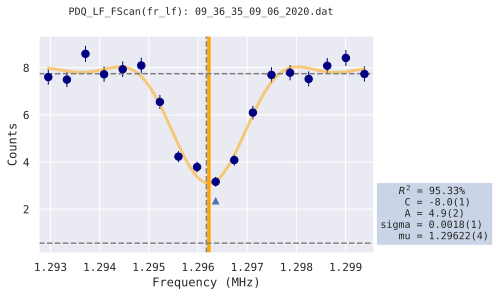

	set fr_lf = 1.29622 [prev. 1.29617 (2020-06-09 09:35:54)]	 fit OK



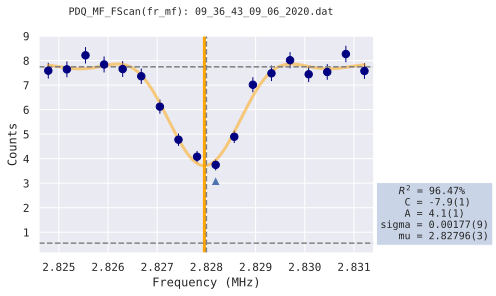

	set fr_mf = 2.82796 [prev. 2.828 (2020-06-09 09:36:02)]	 fit OK



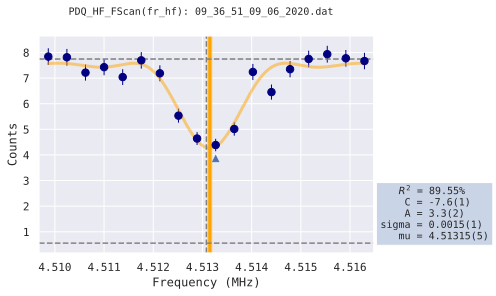

	set fr_hf = 4.51315 [prev. 4.51308 (2020-06-09 09:36:11)]	 fit OK

End session: 2020-06-09-09-36-34
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:25.112546
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:36:59.339442
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.963178, stop 1775.196822, 
	points 11, experiment/point 60 rnd 1 show 0
	09_37_00_09_06_2020.dat [7824e]
	duration 3.22s


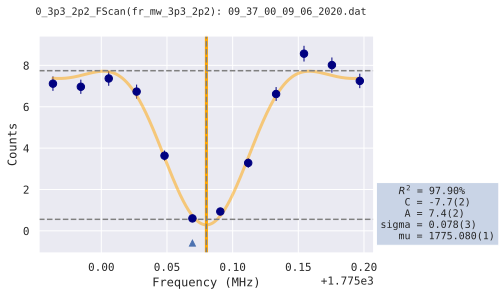

	set fr_mw_3p3_2p2 = 1775.08 [prev. 1775.08 (2020-06-09 09:36:15)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 40.125000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_37_04_09_06_2020.dat [421ce]
	duration 5.33s


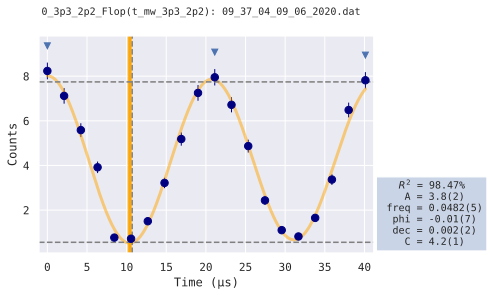

	set t_mw_3p3_2p2 = 10.4 [prev. 10.7 (2020-06-09 09:36:22)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.567426, stop 1780.624374, 
	points 11, experiment/point 60 rnd 1 show 0
	09_37_11_09_06_2020.dat [58638]
	duration 3.22s


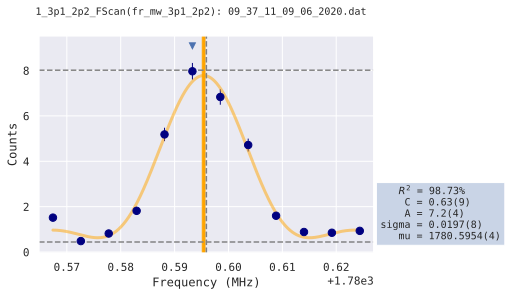

	set fr_mw_3p1_2p2 = 1780.5954 [prev. 1780.5959 (2020-06-09 09:36:27)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 164.625000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_37_16_09_06_2020.dat [394c4]
	duration 4.92s


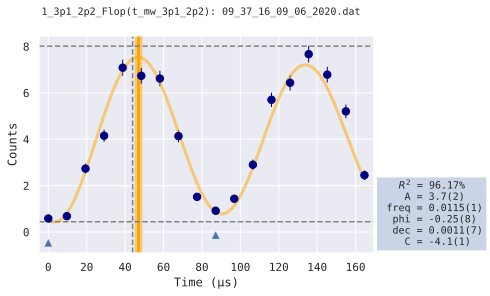

	set t_mw_3p1_2p2 = 47.0 [prev. 43.9 (2020-06-09 09:36:34)]	 fit OK

End session: 2020-06-09-09-36-59
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:22.178556
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:37:21.518357
Please wait...
---------------------------------- 



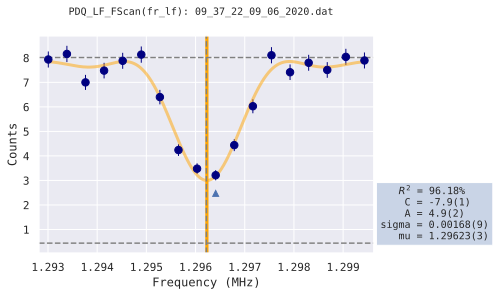

	set fr_lf = 1.29623 [prev. 1.29622 (2020-06-09 09:36:42)]	 fit OK



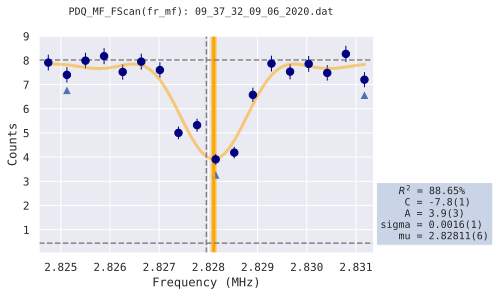

	set fr_mf = 2.82811 [prev. 2.82796 (2020-06-09 09:36:51)]	 fit OK



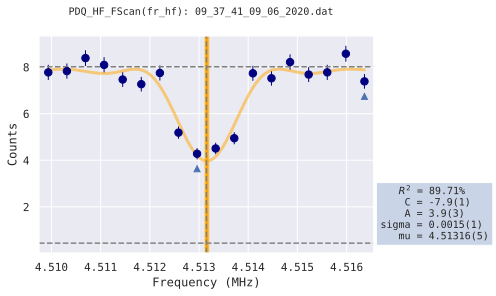

	set fr_hf = 4.51316 [prev. 4.51315 (2020-06-09 09:36:59)]	 fit OK

End session: 2020-06-09-09-37-21
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:27.143155
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:37:48.661998
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.959808, stop 1775.200192, 
	points 11, experiment/point 60 rnd 1 show 0
	09_37_49_09_06_2020.dat [24dce]
	duration 3.22s


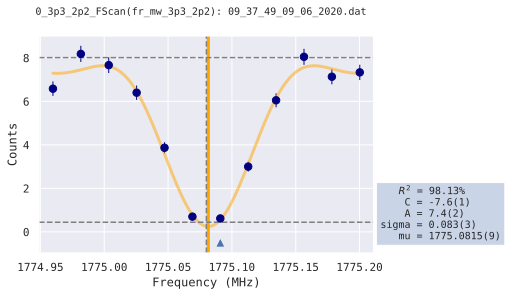

	set fr_mw_3p3_2p2 = 1775.0815 [prev. 1775.08 (2020-06-09 09:37:03)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 39.000000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_37_54_09_06_2020.dat [2ddbf]
	duration 5.33s


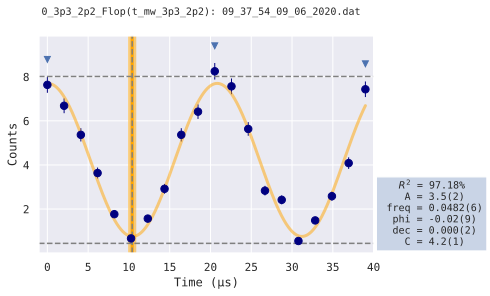

	set t_mw_3p3_2p2 = 10.4 [prev. 10.4 (2020-06-09 09:37:10)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.568804, stop 1780.621996, 
	points 11, experiment/point 60 rnd 1 show 0
	09_38_01_09_06_2020.dat [5850d]
	duration 3.34s


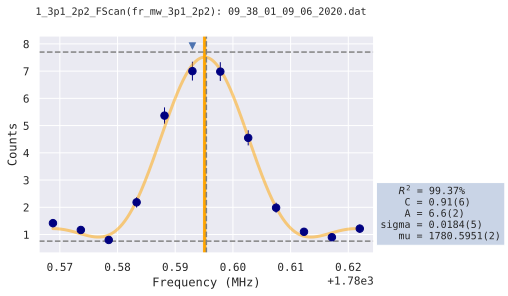

	set fr_mw_3p1_2p2 = 1780.5951 [prev. 1780.5954 (2020-06-09 09:37:15)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 176.250000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_38_06_09_06_2020.dat [e7c04]
	duration 5.03s


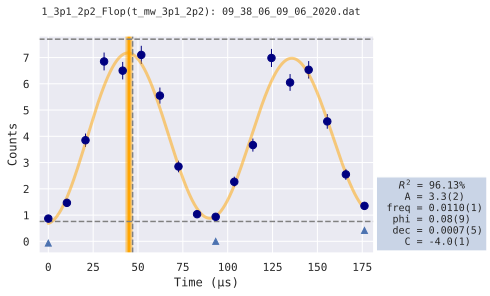

	set t_mw_3p1_2p2 = 45.0 [prev. 47.0 (2020-06-09 09:37:21)]	 fit OK

End session: 2020-06-09-09-37-48
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:23.273603
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:38:11.936200
Please wait...
---------------------------------- 



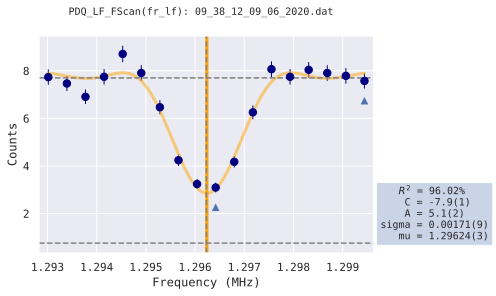

	set fr_lf = 1.29624 [prev. 1.29623 (2020-06-09 09:37:31)]	 fit OK



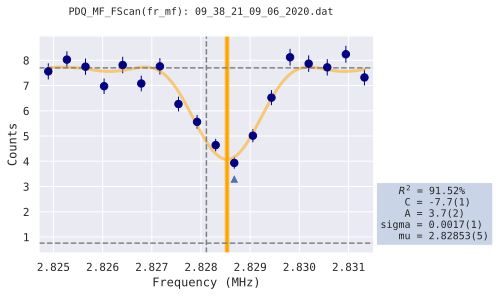

	set fr_mf = 2.82853 [prev. 2.82811 (2020-06-09 09:37:40)]	 fit OK



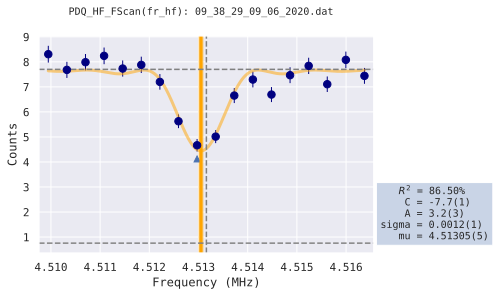

	set fr_hf = 4.51305 [prev. 4.51316 (2020-06-09 09:37:48)]	 fit OK

End session: 2020-06-09-09-38-11
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:25.506356
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:38:37.442888
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.961308, stop 1775.201692, 
	points 11, experiment/point 60 rnd 1 show 0
	09_38_38_09_06_2020.dat [fce3b]
	duration 3.43s


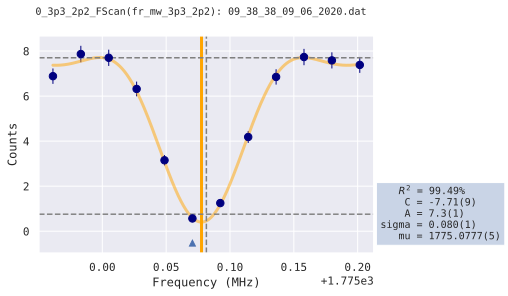

	set fr_mw_3p3_2p2 = 1775.0777 [prev. 1775.0815 (2020-06-09 09:37:53)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 39.000000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_38_43_09_06_2020.dat [1feda]
	duration 5.42s


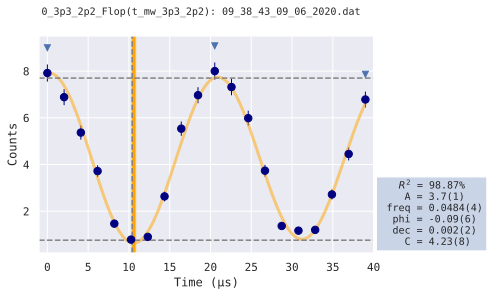

	set t_mw_3p3_2p2 = 10.6 [prev. 10.4 (2020-06-09 09:38:00)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.567322, stop 1780.622878, 
	points 11, experiment/point 60 rnd 1 show 0
	09_38_50_09_06_2020.dat [75f92]
	duration 3.23s


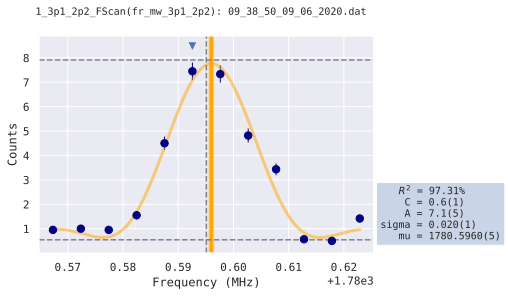

	set fr_mw_3p1_2p2 = 1780.596 [prev. 1780.5951 (2020-06-09 09:38:04)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 168.750000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_38_54_09_06_2020.dat [5052f]
	duration 4.92s


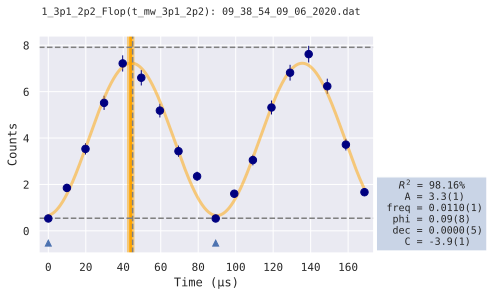

	set t_mw_3p1_2p2 = 44.0 [prev. 45.0 (2020-06-09 09:38:11)]	 fit OK

End session: 2020-06-09-09-38-37
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:22.614488
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:39:00.057728
Please wait...
---------------------------------- 



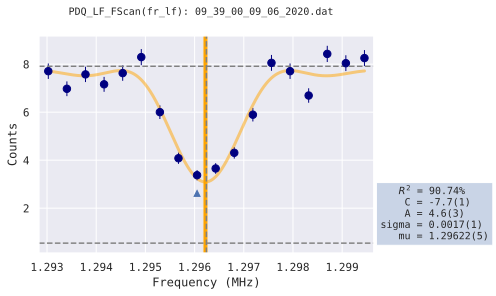

	set fr_lf = 1.29622 [prev. 1.29624 (2020-06-09 09:38:20)]	 fit OK



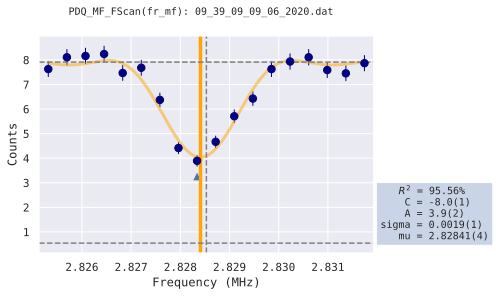

	set fr_mf = 2.82841 [prev. 2.82853 (2020-06-09 09:38:28)]	 fit OK



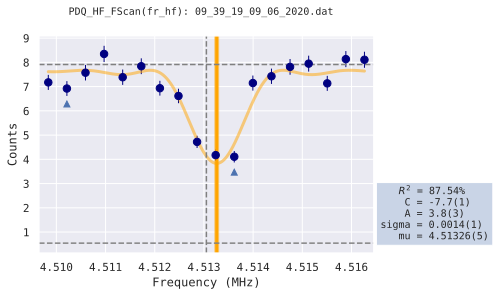

	set fr_hf = 4.51326 [prev. 4.51305 (2020-06-09 09:38:37)]	 fit OK

End session: 2020-06-09-09-39-00
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:26.782301
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:39:26.840575
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.959775, stop 1775.195625, 
	points 11, experiment/point 60 rnd 1 show 0
	09_39_27_09_06_2020.dat [a157a]
	duration 3.22s


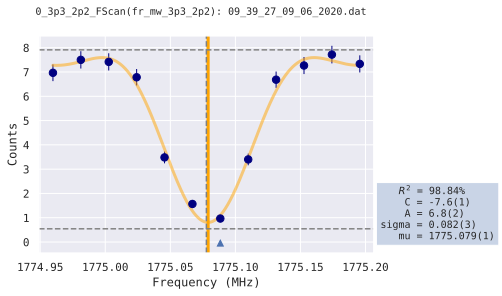

	set fr_mw_3p3_2p2 = 1775.079 [prev. 1775.0777 (2020-06-09 09:38:42)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 39.750000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_39_32_09_06_2020.dat [ce29b]
	duration 5.32s


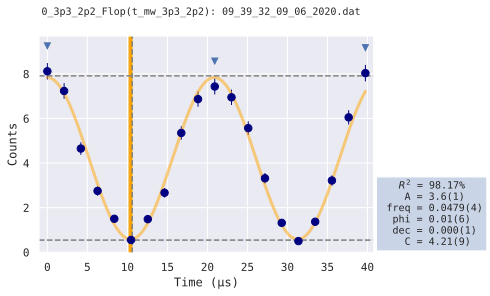

	set t_mw_3p3_2p2 = 10.4 [prev. 10.6 (2020-06-09 09:38:49)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.567591, stop 1780.624409, 
	points 11, experiment/point 60 rnd 1 show 0
	09_39_39_09_06_2020.dat [e1a51]
	duration 3.23s


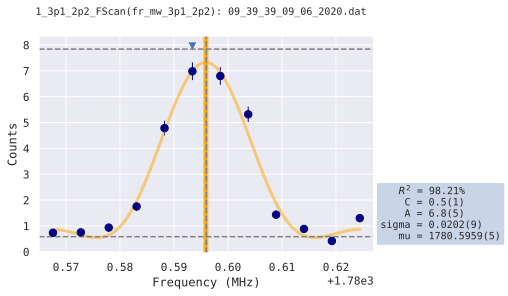

	set fr_mw_3p1_2p2 = 1780.5959 [prev. 1780.596 (2020-06-09 09:38:53)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 165.000000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_39_44_09_06_2020.dat [4d719]
	duration 5.02s


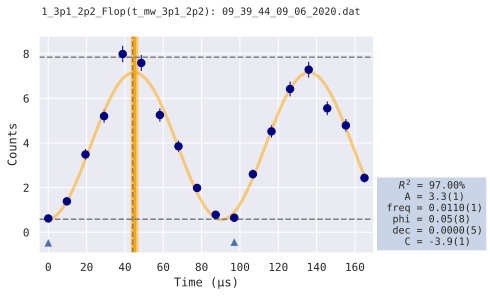

	set t_mw_3p1_2p2 = 45.0 [prev. 44.0 (2020-06-09 09:39:00)]	 fit OK

End session: 2020-06-09-09-39-26
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:22.745503
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:39:49.586274
Please wait...
---------------------------------- 



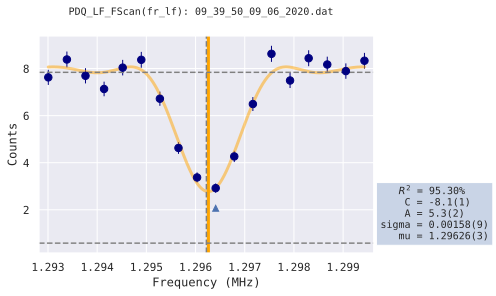

	set fr_lf = 1.29626 [prev. 1.29622 (2020-06-09 09:39:08)]	 fit OK



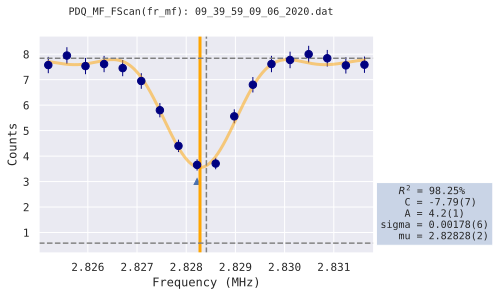

	set fr_mf = 2.82828 [prev. 2.82841 (2020-06-09 09:39:18)]	 fit OK



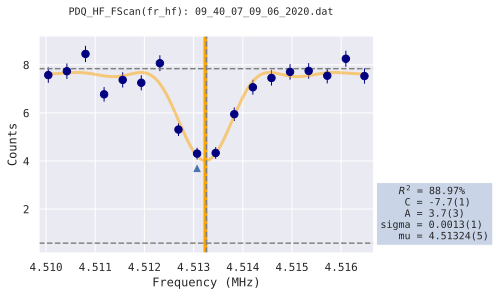

	set fr_hf = 4.51324 [prev. 4.51326 (2020-06-09 09:39:26)]	 fit OK

End session: 2020-06-09-09-39-49
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:25.126350
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:40:14.713016
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.958808, stop 1775.199192, 
	points 11, experiment/point 60 rnd 1 show 0
	09_40_15_09_06_2020.dat [9effe]
	duration 3.22s


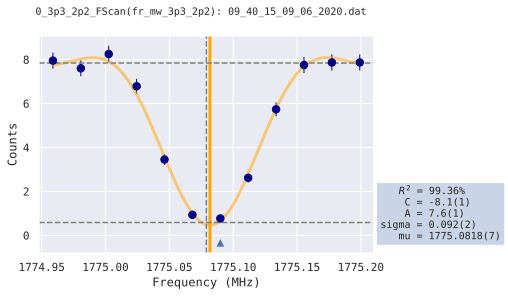

	set fr_mw_3p3_2p2 = 1775.0818 [prev. 1775.079 (2020-06-09 09:39:31)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 39.000000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_40_20_09_06_2020.dat [f3c81]
	duration 5.33s


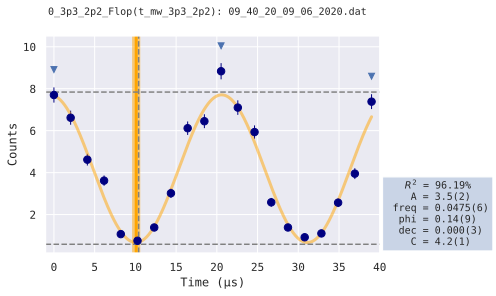

	set t_mw_3p3_2p2 = 10.1 [prev. 10.4 (2020-06-09 09:39:38)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.568122, stop 1780.623678, 
	points 11, experiment/point 60 rnd 1 show 0
	09_40_27_09_06_2020.dat [36acc]
	duration 3.32s


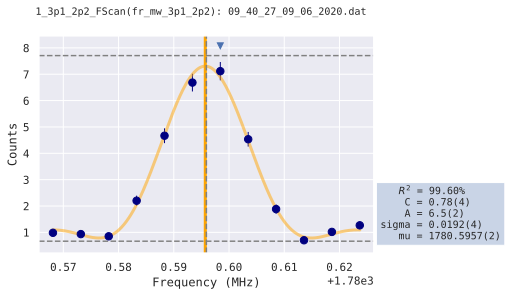

	set fr_mw_3p1_2p2 = 1780.5957 [prev. 1780.5959 (2020-06-09 09:39:43)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 168.750000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_40_31_09_06_2020.dat [1bac4]
	duration 5.03s


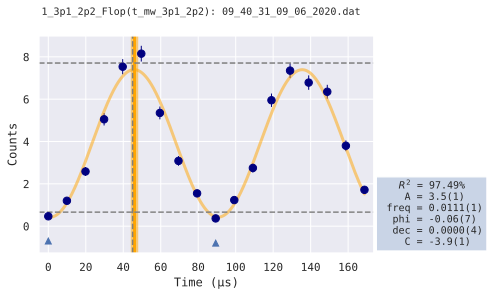

	set t_mw_3p1_2p2 = 46.0 [prev. 45.0 (2020-06-09 09:39:49)]	 fit OK

End session: 2020-06-09-09-40-14
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:22.875129
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:40:37.588671
Please wait...
---------------------------------- 



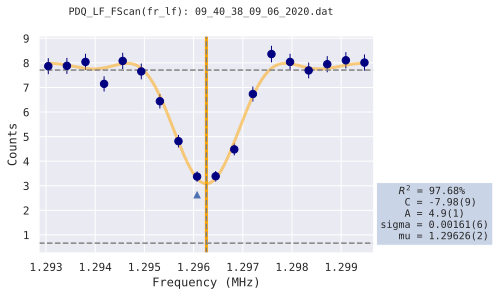

	set fr_lf = 1.29626 [prev. 1.29626 (2020-06-09 09:39:57)]	 fit OK



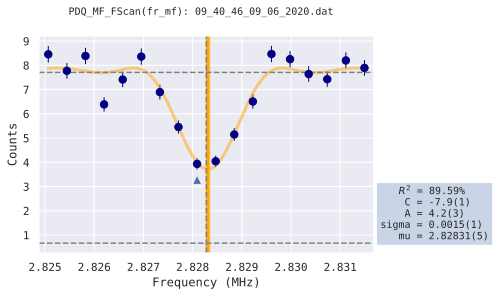

	set fr_mf = 2.82831 [prev. 2.82828 (2020-06-09 09:40:06)]	 fit OK



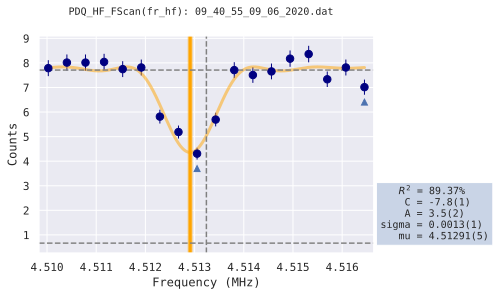

	set fr_hf = 4.51291 [prev. 4.51324 (2020-06-09 09:40:14)]	 fit OK

End session: 2020-06-09-09-40-37
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:25.096620
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:41:02.685755
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.958038, stop 1775.205562, 
	points 11, experiment/point 60 rnd 1 show 0
	09_41_03_09_06_2020.dat [56fb4]
	duration 3.32s


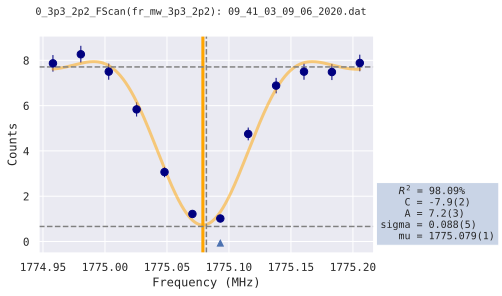

	set fr_mw_3p3_2p2 = 1775.079 [prev. 1775.0818 (2020-06-09 09:40:19)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 37.875000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_41_08_09_06_2020.dat [48e5c]
	duration 5.42s


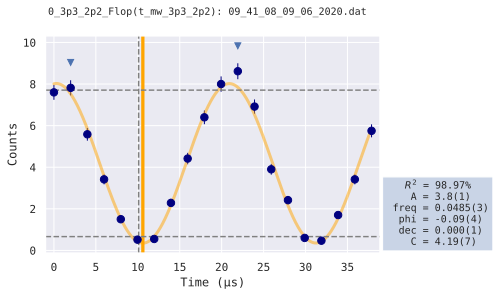

	set t_mw_3p3_2p2 = 10.6 [prev. 10.1 (2020-06-09 09:40:26)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.568526, stop 1780.622874, 
	points 11, experiment/point 60 rnd 1 show 0
	09_41_15_09_06_2020.dat [e2eae]
	duration 3.33s


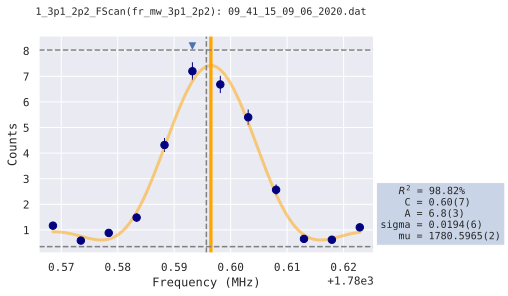

	set fr_mw_3p1_2p2 = 1780.5965 [prev. 1780.5957 (2020-06-09 09:40:30)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 172.500000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_41_20_09_06_2020.dat [f3d49]
	duration 4.95s


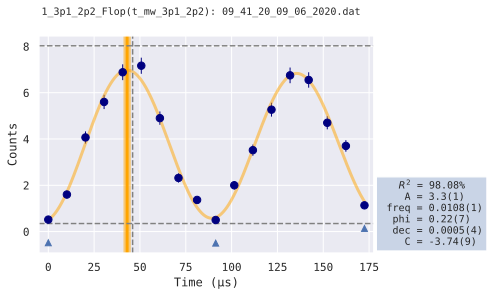

	set t_mw_3p1_2p2 = 43.0 [prev. 46.0 (2020-06-09 09:40:37)]	 fit OK

End session: 2020-06-09-09-41-02
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:23.034726
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:41:25.721137
Please wait...
---------------------------------- 



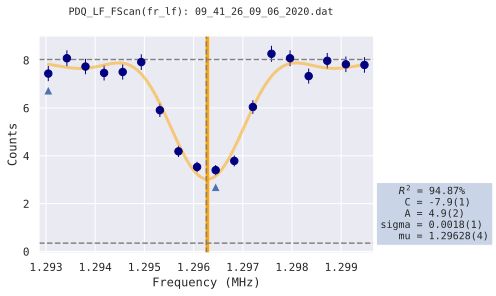

	set fr_lf = 1.29628 [prev. 1.29626 (2020-06-09 09:40:45)]	 fit OK



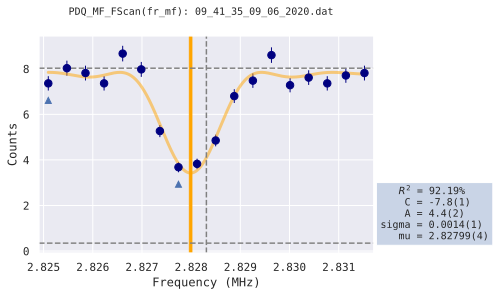

	set fr_mf = 2.82799 [prev. 2.82831 (2020-06-09 09:40:54)]	 fit OK



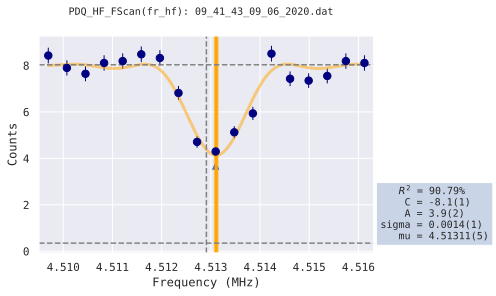

	set fr_hf = 4.51311 [prev. 4.51291 (2020-06-09 09:41:02)]	 fit OK

End session: 2020-06-09-09-41-25
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:25.119233
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:41:50.840473
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.961075, stop 1775.196925, 
	points 11, experiment/point 60 rnd 1 show 0
	09_41_51_09_06_2020.dat [49f06]
	duration 3.22s


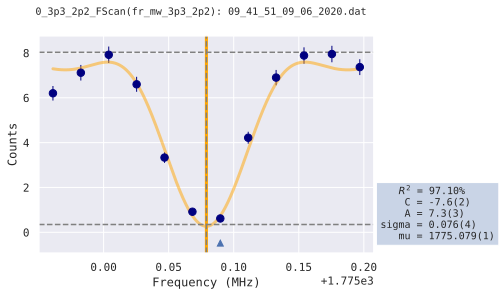

	set fr_mw_3p3_2p2 = 1775.079 [prev. 1775.079 (2020-06-09 09:41:07)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 39.750000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_41_56_09_06_2020.dat [342c5]
	duration 5.33s


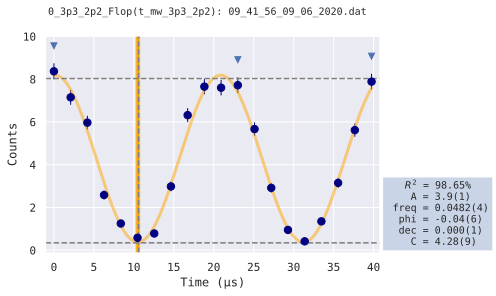

	set t_mw_3p3_2p2 = 10.5 [prev. 10.6 (2020-06-09 09:41:14)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.567430, stop 1780.625570, 
	points 11, experiment/point 60 rnd 1 show 0
	09_42_03_09_06_2020.dat [4353c]
	duration 3.32s


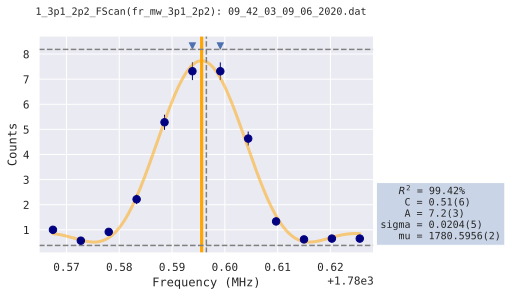

	set fr_mw_3p1_2p2 = 1780.5956 [prev. 1780.5965 (2020-06-09 09:41:19)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 161.250000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_42_08_09_06_2020.dat [5266a]
	duration 5.13s


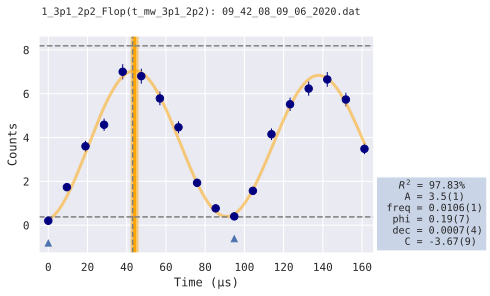

	set t_mw_3p1_2p2 = 44.0 [prev. 43.0 (2020-06-09 09:41:25)]	 fit OK

End session: 2020-06-09-09-41-50
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:23.157131
---------------------------------- 

----------------------------------
Mode frequency
2020-06-09 09:42:13.998096
Please wait...
---------------------------------- 



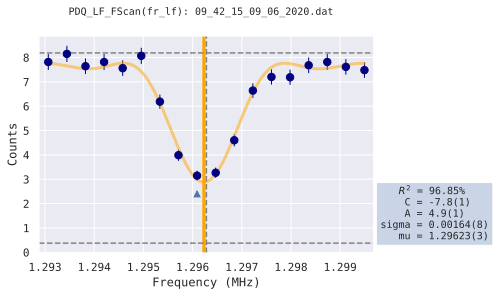

	set fr_lf = 1.29623 [prev. 1.29628 (2020-06-09 09:41:34)]	 fit OK



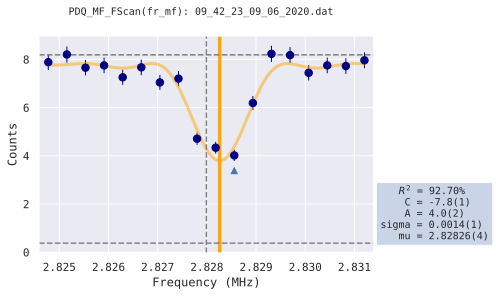

	set fr_mf = 2.82826 [prev. 2.82799 (2020-06-09 09:41:42)]	 fit OK



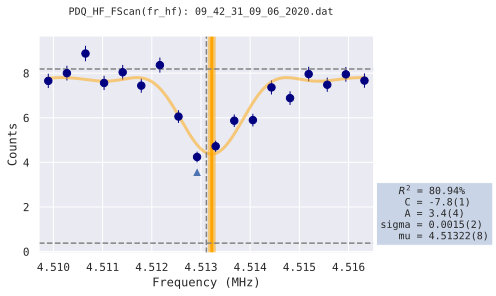

	set fr_hf = 4.51322 [prev. 4.51311 (2020-06-09 09:41:50)]	 fit OK

End session: 2020-06-09-09-42-13
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:25.187521
---------------------------------- 

----------------------------------
MW transitions 0
2020-06-09 09:42:39.186030
Please wait...
---------------------------------- 

___Get 3p3 -> 2p2 MW transition___ 
Run 0_3p3_2p2_FScan (fr_mw_3p3_2p2_s)
	start 1774.959952, stop 1775.198048, 
	points 11, experiment/point 60 rnd 1 show 0
	09_42_40_09_06_2020.dat [2d52f]
	duration 3.23s


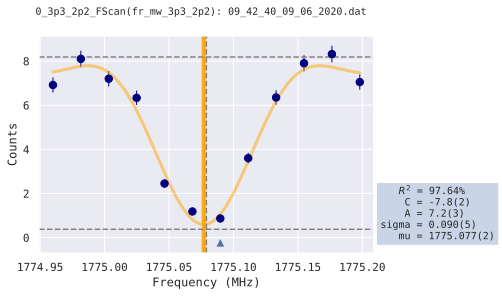

	set fr_mw_3p3_2p2 = 1775.077 [prev. 1775.079 (2020-06-09 09:41:55)]	 fit OK

Run 0_3p3_2p2_Flop (t_mw_3p3_2p2)
	start 0.000000, stop 39.375000, 
	points 19, experiment/point 60 rnd 0 show 0
	09_42_44_09_06_2020.dat [827fc]
	duration 5.43s


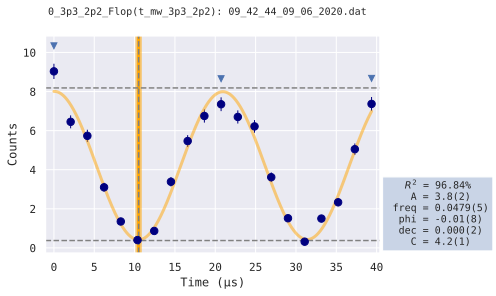

	set t_mw_3p3_2p2 = 10.5 [prev. 10.5 (2020-06-09 09:42:02)]	 fit OK

___Get 2p2 -> 3p1 MW transition___ 
Run 1_3p1_2p2_FScan (fr_mw_3p1_2p2_s)
	start 1780.567191, stop 1780.624009, 
	points 11, experiment/point 60 rnd 1 show 0
	09_42_51_09_06_2020.dat [dc2e0]
	duration 3.22s


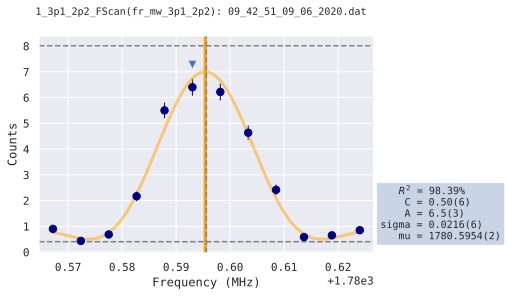

	set fr_mw_3p1_2p2 = 1780.5954 [prev. 1780.5956 (2020-06-09 09:42:07)]	 fit OK

Run 1_3p1_2p2_Flop (t_mw_3p1_2p2_s)
	start 0.000000, stop 165.000000, 
	points 17, experiment/point 60 rnd 1 show 0
	09_42_56_09_06_2020.dat [ca7f3]
	duration 4.92s


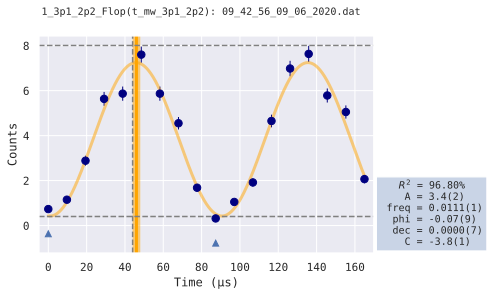

	set t_mw_3p1_2p2 = 46.0 [prev. 44.0 (2020-06-09 09:42:13)]	 fit OK

End session: 2020-06-09-09-42-39
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:22.688319
---------------------------------- 

End session: None
----------------------------------
Done. Seq. took (hours:min:sec):
0:20:11.655064
---------------------------------- 



In [27]:
dur=60*20

cal_begin = paula.print_header('Check longterm stab. of motional mode freq.')
start = time.time()
while start+dur > time.time():
    paula.cal_mode_freq(prec=7., Level=0);
    paula.cal_mw_trans(0, verbose=True)
    #Ch13 = paula.read_avg_adc_me(ch=13, no_avg=10000, verbose=True)
    #Ch13 = paula.round_paula([Ch13[0]],[Ch13[1]])
    #paula.set('adc_me_RF_ch13',Ch13)
    #Ch03 = paula.read_avg_adc_me(ch=3, no_avg=10000, verbose=True)
    #Ch03 = paula.round_paula([Ch03[0]],[Ch03[1]])
    #paula.set('adc_me_RF_fr',Ch03)
cal_dur, sid = paula.print_footer(cal_begin);    

In [ ]:
#paula.cal_mode_fr('PDQ_MF_FScan', 'mf', 0.6, 200);
#name,data = paula.run('PDQ_MF_FScan',par_name='t_tickle_mf',start=0,stop=200,expperpoint=400,numofpoints=22,counter=None)
#paula.plot_data(data,name)
#paula.cal_mode_fr('PDQ_MF_FScan', 'mf', 0.6, 200);

In [ ]:
#for i in range(0,50,5): 
#    paula.set_shim('HzzExpZ_fine',i)
#    paula.check_ion_pos_fine(amp=.9, deltaX=100, deltaY=100, deltaZ=300, itera=1);
#    paula.cal_mode_freq(prec=1., Level=1);

In [4]:
paula.ion_report()

----------------------------------
Ion Report
2020-06-08 19:38:07.770157
Please wait...
---------------------------------- 

Ion(s) loaded: 2020-06-08 15:18:17
--------------------------
Profile:  EU_cool
--------------------------
RF pwr / ch3p8 (a.u.): 3.475 [2020-06-02 16:49:11]
--------------------------
ERaO (V):  18.272000 []
EZO  (V):  17.913000 []
ERiO (V):  32.039000 []
ERaU (V):  22.713000 []
EZU  (V):  18.735000 []
ERiU (V):  18.030000 []
ExExpZ (kV/m):  -0.052000 [2020-06-08 19:20:29]
EyExpZ (kV/m):  -0.031000 [2020-06-08 19:20:35]
EzExpZ (kV/m):   0.001000 [2020-06-08 19:20:42]
FinestHzz (MHz^2):   1.800000 []

--------------------------
Single-Ion Freq. (2pi MHz)
--------------------------
HF COM: 4.5011 [2020-06-08 19:37:39]
MF COM: 2.8104 [2020-06-08 19:37:31]
LF    : 1.2954 [2020-06-08 19:37:47]
--------------------------
SBC to <n> (quanta)
--------------------------
HF: 0.65 [2020-06-02 16:20:28]
MF: 0.27 [2020-06-02 16:06:33]
LF: 0.31 [2020-06-05 14:28:56]
---------

# Check coherence of electronic superpos. states

In [44]:
paula.set('A_sbc',0)

True

----------------------------------
Starting a MW Ramsey Coherence Experiment
2020-06-09 11:29:04.886365
Please wait...
---------------------------------- 

[  0.          16.66666667  33.33333333  50.          66.66666667
  83.33333333 100.        ]
[0.0, 100.0, 33.333333333333336, 50.0, 83.33333333333334, 16.666666666666668, 66.66666666666667]
Run 9_3p3_2p2_Ramsey_Phase (phase) 
	start 0.000000, stop 6.282000, 
	points 5, experiments/point 10 rnd 1 show 0


Output(layout=Layout(height='360px'))

	11_29_04_09_06_2020.dat [413b2]
	duration 3.24s
0.0
Run 9_3p3_2p2_Ramsey_Phase (phase) 
	start 0.000000, stop 6.282000, 
	points 11, experiments/point 200 rnd 1 show 0


Output(layout=Layout(height='360px'))

	11_29_08_09_06_2020.dat [f750e]
	duration 97.17s


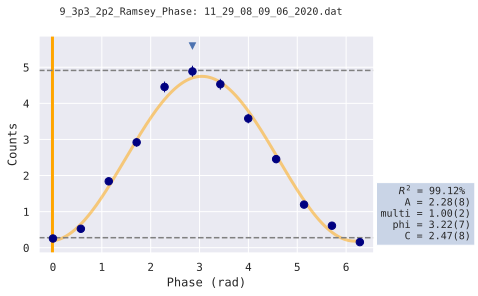

Run 9_3p3_2p2_Ramsey_Phase (phase) 
	start 0.000000, stop 6.282000, 
	points 5, experiments/point 10 rnd 1 show 0


Output(layout=Layout(height='360px'))

	11_30_45_09_06_2020.dat [c5502]
	duration 3.39s
100.0
Run 9_3p3_2p2_Ramsey_Phase (phase) 
	start 0.000000, stop 6.282000, 
	points 11, experiments/point 200 rnd 1 show 0


Output(layout=Layout(height='360px'))

In [ ]:
paula.mw_ramsey_coherence(transition='3p3_2p2', 
                          t_ramsey_start=0, t_ramsey_end=100, steps=7, random=True,
                          numofpoints=11, expperpoint=200, rnd_sampled=True, 
                          zeros=True);

#paula.mw_Ramsey_coherence(transition='3p0_2p0', iter_start=0,iter_end=10000,iter_steps=5);

In [ ]:
#paula.mw_ramsey()

In [ ]:
#paula.session_replay('2020-05-28-00-58-20')

# Check coherence of motional excitations and mode bandwidth limit

----------------------------------
Starting a Tickle Ramsey Coherence Experiment
2020-06-08 22:23:19.202429
Please wait...
---------------------------------- 

[   0.          166.66666667  333.33333333  500.          666.66666667
  833.33333333 1000.        ]
[0.0, 666.6666666666666, 166.66666666666666, 333.3333333333333, 1000.0, 500.0, 833.3333333333333]


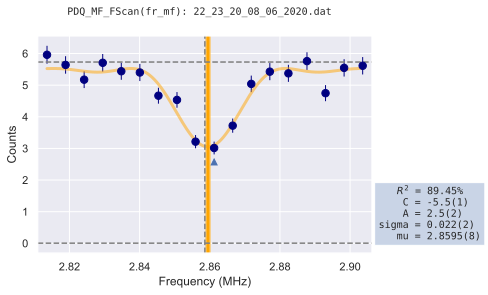

	set fr_mf = 2.8595 [prev. 2.8586 (2020-06-08 22:13:36)]	 fit OK

PDQ_MF_Ramsey
Run PDQ_MF_Ramsey (phase)
	start -0.650000, stop 0.650000, 
	points 5, experiment/point 10 rnd 1 show 0
	22_23_33_08_06_2020.dat [d63d2]
	duration 0.46s
0.0
PDQ_MF_Ramsey
Run PDQ_MF_Ramsey (phase)
	start -0.650000, stop 0.650000, 
	points 13, experiment/point 200 rnd 1 show 0
	22_23_35_08_06_2020.dat [e0a7b]
	duration 5.86s


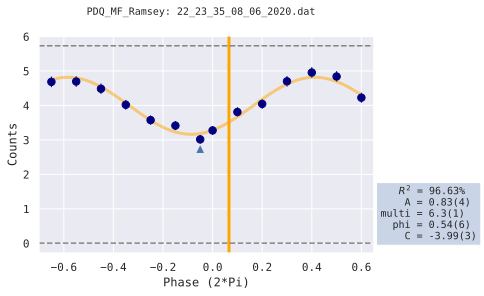

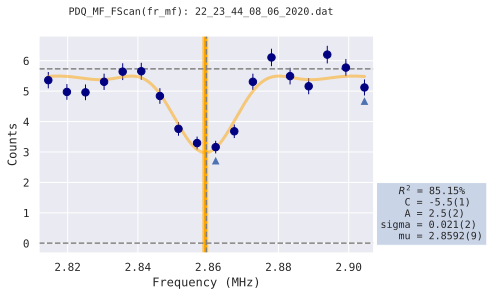

	set fr_mf = 2.8592 [prev. 2.8595 (2020-06-08 22:23:32)]	 fit OK

PDQ_MF_Ramsey
Run PDQ_MF_Ramsey (phase)
	start -0.650000, stop 0.650000, 
	points 5, experiment/point 10 rnd 1 show 0
	22_23_57_08_06_2020.dat [a9491]
	duration 0.34s
666.6666666666666
PDQ_MF_Ramsey
Run PDQ_MF_Ramsey (phase)
	start -0.650000, stop 0.650000, 
	points 13, experiment/point 200 rnd 1 show 0
	22_23_58_08_06_2020.dat [5cd81]
	duration 7.55s


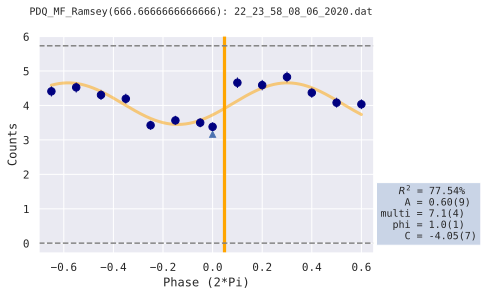

Performing a meta-fit
	    666.6666666666666 = 0.048	 fit OK, set failed



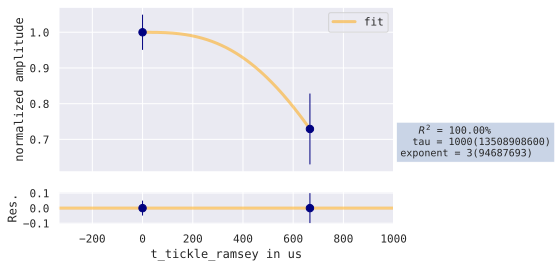

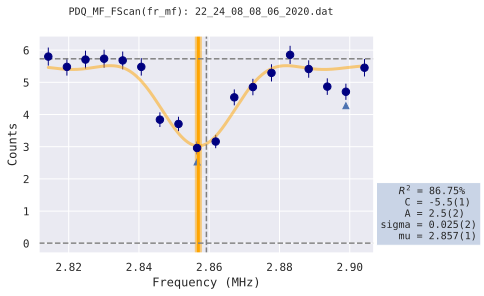

	set fr_mf = 2.8569 [prev. 2.8592 (2020-06-08 22:23:56)]	 fit OK

PDQ_MF_Ramsey
Run PDQ_MF_Ramsey (phase)
	start -0.650000, stop 0.650000, 
	points 5, experiment/point 10 rnd 1 show 0
	22_24_22_08_06_2020.dat [3c284]
	duration 0.44s
166.66666666666666
PDQ_MF_Ramsey
Run PDQ_MF_Ramsey (phase)
	start -0.650000, stop 0.650000, 
	points 13, experiment/point 200 rnd 1 show 0
	22_24_23_08_06_2020.dat [73f13]
	duration 6.25s


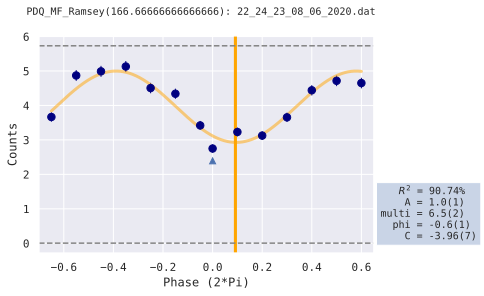

Performing a meta-fit
	    166.66666666666666 = 0.092	 fit OK, set failed



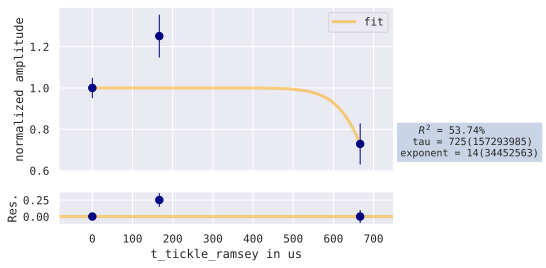

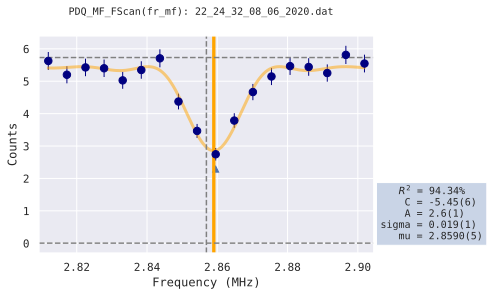

	set fr_mf = 2.859 [prev. 2.8569 (2020-06-08 22:24:21)]	 fit OK

PDQ_MF_Ramsey
Run PDQ_MF_Ramsey (phase)
	start -0.650000, stop 0.650000, 
	points 5, experiment/point 10 rnd 1 show 0
	22_24_45_08_06_2020.dat [05ea0]
	duration 0.35s
333.3333333333333
PDQ_MF_Ramsey
Run PDQ_MF_Ramsey (phase)
	start -0.650000, stop 0.650000, 
	points 13, experiment/point 200 rnd 1 show 0
	22_24_46_08_06_2020.dat [28cb0]
	duration 6.45s


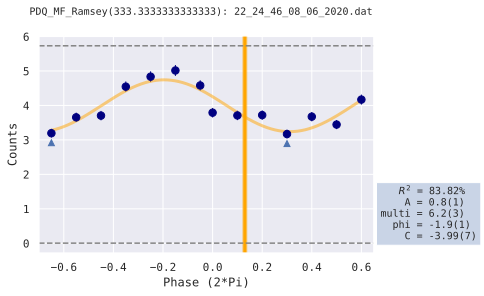

Performing a meta-fit
	    333.3333333333333 = 0.13	 fit OK, set failed



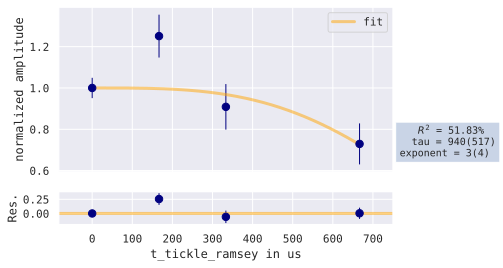

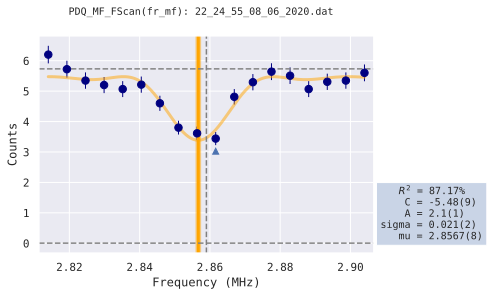

	set fr_mf = 2.8567 [prev. 2.859 (2020-06-08 22:24:44)]	 fit OK

PDQ_MF_Ramsey
Run PDQ_MF_Ramsey (phase)
	start -0.650000, stop 0.650000, 
	points 5, experiment/point 10 rnd 1 show 0
	22_25_09_08_06_2020.dat [9b9cc]
	duration 0.45s
1000.0
PDQ_MF_Ramsey
Run PDQ_MF_Ramsey (phase)
	start -0.650000, stop 0.650000, 
	points 13, experiment/point 200 rnd 1 show 0
	22_25_10_08_06_2020.dat [f88a7]
	duration 8.85s


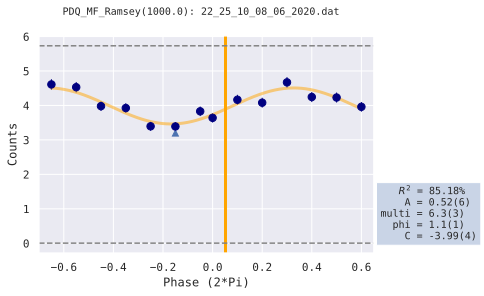

Performing a meta-fit
	    1000.0 = 0.052	 fit OK, set failed



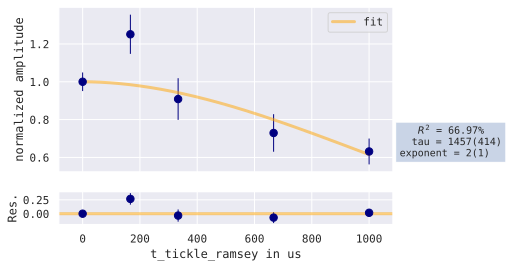

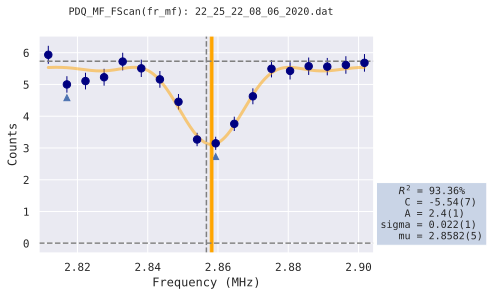

	set fr_mf = 2.8582 [prev. 2.8567 (2020-06-08 22:25:08)]	 fit OK

PDQ_MF_Ramsey
Run PDQ_MF_Ramsey (phase)
	start -0.650000, stop 0.650000, 
	points 5, experiment/point 10 rnd 1 show 0
	22_25_36_08_06_2020.dat [951ab]
	duration 0.34s
500.0
PDQ_MF_Ramsey
Run PDQ_MF_Ramsey (phase)
	start -0.650000, stop 0.650000, 
	points 13, experiment/point 200 rnd 1 show 0
	22_25_37_08_06_2020.dat [af176]
	duration 7.05s


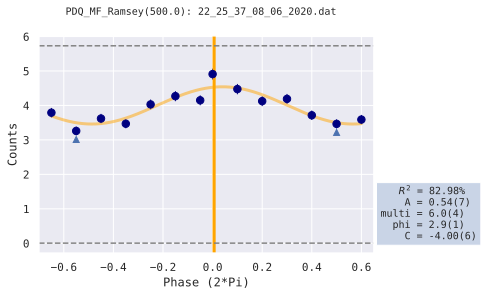

Performing a meta-fit
	    500.0 = 0.006	 fit OK, set failed



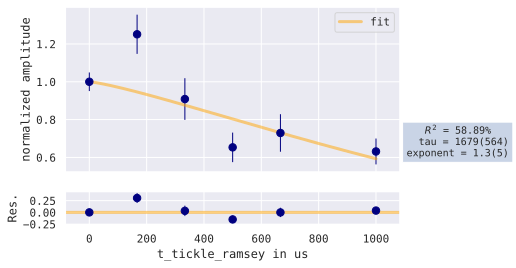

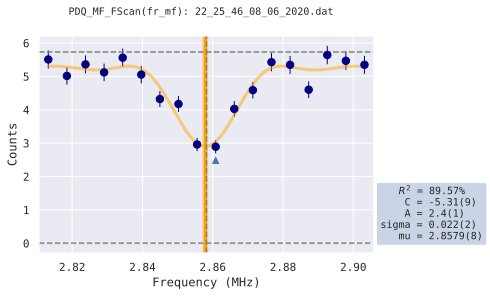

	set fr_mf = 2.8579 [prev. 2.8582 (2020-06-08 22:25:34)]	 fit OK

PDQ_MF_Ramsey
Run PDQ_MF_Ramsey (phase)
	start -0.650000, stop 0.650000, 
	points 5, experiment/point 10 rnd 1 show 0
	22_26_00_08_06_2020.dat [16b7a]
	duration 0.34s
833.3333333333333
PDQ_MF_Ramsey
Run PDQ_MF_Ramsey (phase)
	start -0.650000, stop 0.650000, 
	points 13, experiment/point 200 rnd 1 show 0
	22_26_01_08_06_2020.dat [2e76d]
	duration 7.95s


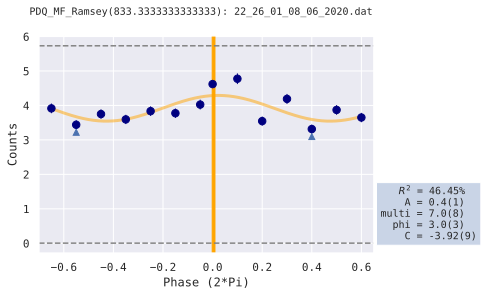

	    833.3333333333333 = 0.004 	 fit failed, not set



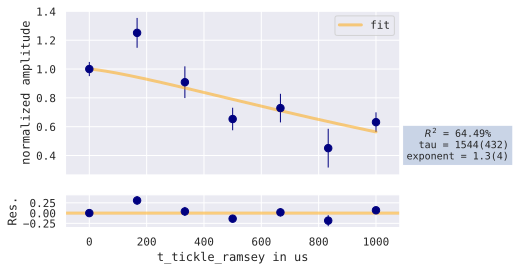

Coherence time of mode mf in µs = 1544(432)
End session: 2020-06-08-22-23-19
----------------------------------
Done. Seq. took (hours:min:sec):
0:02:51.520611
---------------------------------- 



In [2]:
#paula.tickle_Ramsey_coherence('lf',0.75,100,
 #                             t_ramsey_start=0,t_ramsey_end=15000, steps=6, 
  #                            random = False, tickle_before=True, 
   #                           expperpoint=200,rnd_sampled=1,
    #                         guess=[25000,1])
paula.tickle_Ramsey_coherence('mf',0.75,100,
                              t_ramsey_start=0,t_ramsey_end=1000,steps=7,
                              random = True, tickle_before=True, 
                              expperpoint=200,rnd_sampled=1)
#paula.tickle_Ramsey_coherence('hf',0.75,100,iter_start=0,iter_end=1000,iter_steps=5,
                              #tickle_before=False,rnd_sampled=False,
                              #expperpoint=150,numofpoints=13)

In [ ]:
#A new Version:
paula.tickle_Ramsey_coherence(mode_name='mf',amp=0.75,dur=100,
                               t_ramsey_start=0,t_ramsey_end=100,steps=5,
                               expperpoint=150,numofpoints=13,
                               tickle_before=True,
                               zeros=True,random=True,rnd_sampled=True)

In [ ]:
#ret_list, data_list, ret_meta_list, data_meta_list=paula.session_replay('2020-05-19-14-31-09')

----------------------------------
Mode stability
2020-06-08 22:26:10.853593
Please wait...
---------------------------------- 

------------------------------
Exc. duration (µs):  100.0
------------------------------


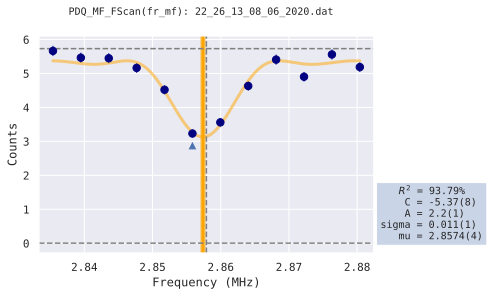

	set fr_mf = 2.8574 [prev. 2.8579 (2020-06-08 22:25:59)]	 fit OK

------------------------------
Exc. duration (µs):  158.48931924611142
------------------------------


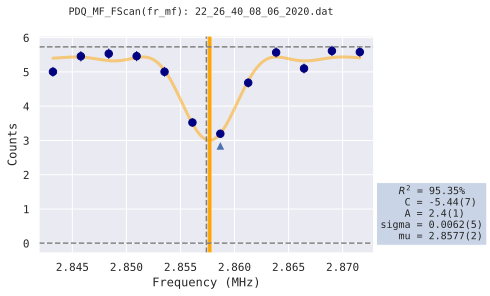

	set fr_mf = 2.8577 [prev. 2.8574 (2020-06-08 22:26:38)]	 fit OK



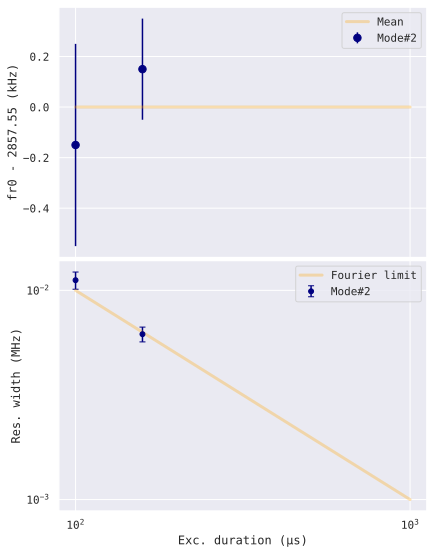

------------------------------
Exc. duration (µs):  251.18864315095797
------------------------------


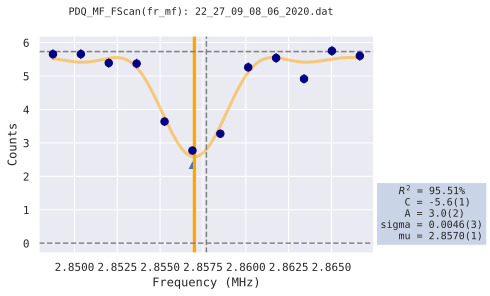

	set fr_mf = 2.857 [prev. 2.8577 (2020-06-08 22:27:06)]	 fit OK



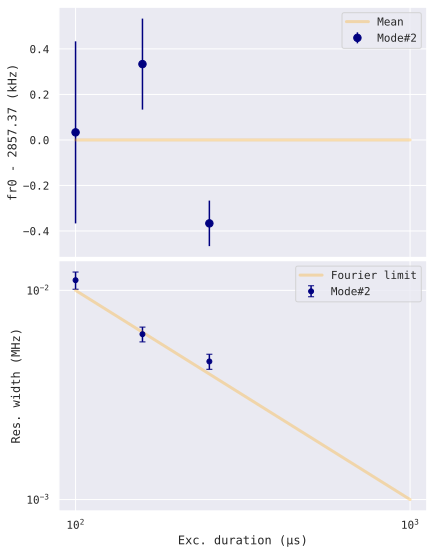

------------------------------
Exc. duration (µs):  398.1071705534973
------------------------------


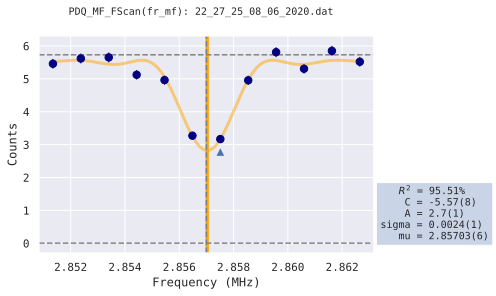

	set fr_mf = 2.85703 [prev. 2.857 (2020-06-08 22:27:22)]	 fit OK



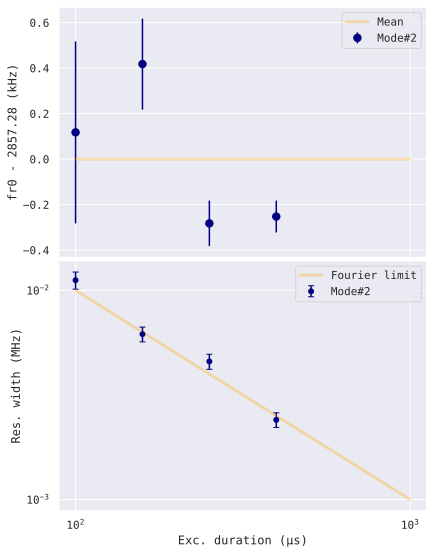

------------------------------
Exc. duration (µs):  630.957344480193
------------------------------


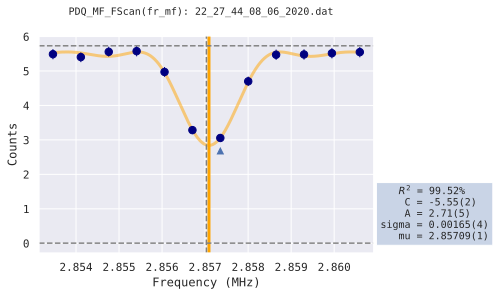

	set fr_mf = 2.85709 [prev. 2.85703 (2020-06-08 22:27:40)]	 fit OK



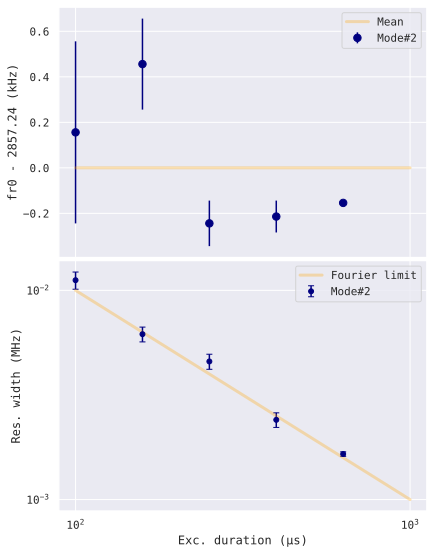

------------------------------
Exc. duration (µs):  1000.0
------------------------------


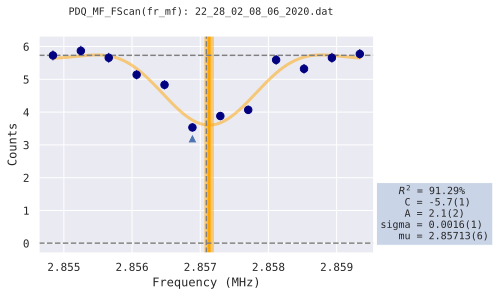

	set fr_mf = 2.85713 [prev. 2.85709 (2020-06-08 22:27:59)]	 fit OK



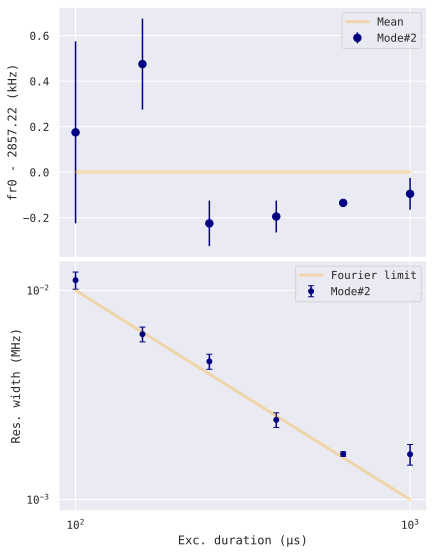

End session: 2020-06-08-22-26-10
----------------------------------
Done. Seq. took (hours:min:sec):
0:02:08.283246
---------------------------------- 

----------------------------------
Analyse motional stability of mode #2
2020-06-08 22:28:19.137347
Please wait...
---------------------------------- 



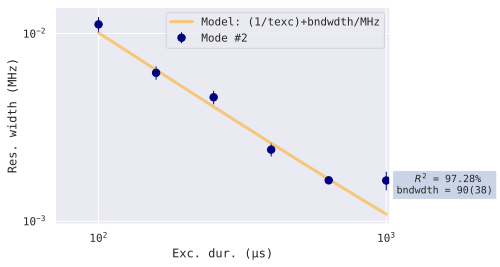

End session: 2020-06-08-22-28-19
----------------------------------
Done. Seq. took (hours:min:sec):
0:02:09.189177
---------------------------------- 



In [3]:
#paula.get_mode_stab('1', np.logspace(2, 4, 6), expperpoint=150, numofpoints=11, rnd_sampled=False);
paula.get_mode_stab('2', np.logspace(2, 3, 6), 
                    expperpoint=100, numofpoints=11, 
                    rnd_sampled=True);
#paula.get_mode_stab('3', np.logspace(2, 3, 5), expperpoint=250, numofpoints=11, rnd_sampled=False);

# Calibrate shims

In [ ]:
#res0, res1, res2=paula.get_mode_fr_vs_shim('FinestHzz', 1.80, .2, 4);
#res0, res1, res2=get_mode_fr_vs_shim('ExExpZ', -0.0115, .01, 4);
#res0, res1, res2=get_mode_fr_vs_shim('EyExpZ', 0.0542, .01, 4);
#res0, res1, res2=get_mode_fr_vs_shim('EzExpZ', -0.5019, .05, 4);
#paula.get_mode_fr_vs_rfpwr('ch3p8', 3.141, .005, 2)

# Check RD & Raman beam pointing

In [4]:
paula.set('t_rd_sbc','1.5')
paula.check_repump(quick=True, verbose=True);
#paula.check_repump(quick=False, verbose=True);

----------------------------------
Check Repumper
2020-06-09 10:39:54.247029
Please wait...
---------------------------------- 

RD: OK (4.88)
RP: OK (1.03)
End session: 2020-06-09-10-39-54
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:01.390779
---------------------------------- 



In [8]:
#check_script = 'B3_pos'
#name, data = paula.run(check_script, live_plots_flag=True);
#paula.plot_data(data, name);

In [25]:
#paula.op_r2(delta_v=.5, delta_h=.5, ddn=1, A_sbc=0)

In [26]:
#paula.op_b1(delta_v=1.5, delta_h=.5, ddn=3)

----------------------------------
Optimize B3
2020-06-09 11:05:57.859689
Please wait...
---------------------------------- 



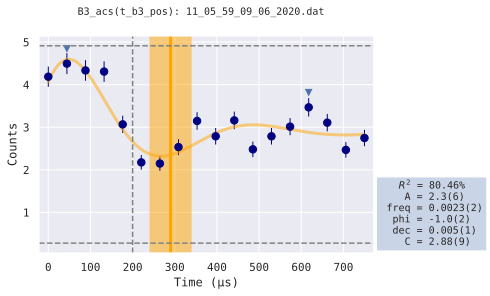

	set t_b3_pos = 290.0 [prev. 200.0 ()]	 fit OK

Optimize at 145.000000 µs


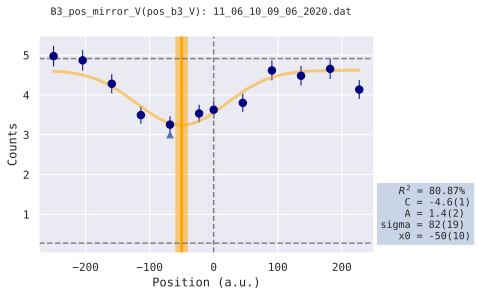

	set pos_b3_V = -50.0 [prev. 0.0 ()]	 fit OK

Mirror #0 position: -50.000000 +- 10.000000


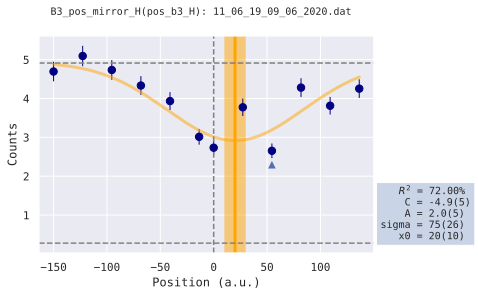

	set pos_b3_H = 20.0 [prev. 0.0 ()]	 fit OK

Mirror #1 position: 20.000000 +- 10.000000


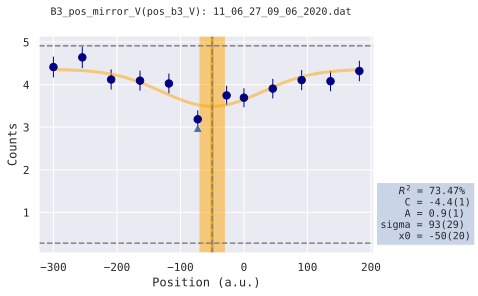

	set pos_b3_V = -50.0 [prev. -50.0 (2020-06-09 11:06:17)]	 fit OK

Mirror #0 position: -50.000000 +- 20.000000


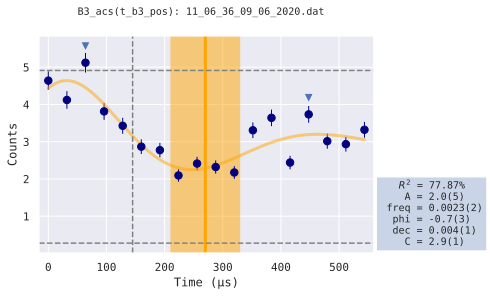

	set t_b3_pos = 270.0 [prev. 145.0 (2020-06-09 11:06:09)]	 fit OK

BDx cts: 4.936
Improved by approx. (%): 6.897
End session: 2020-06-09-11-05-57
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:48.283252
---------------------------------- 



In [27]:
paula.op_b3(delta_v=500, delta_h=300, ddn=3)

In [ ]:
#paula.get_Raman_Stark_shift(t_b1=50,t_b3=100,t_r2=15, SBC=0)
paula.get_Raman_Stark_shift(t_b1=80,t_b3=140,t_r2=8, SBC=0)

# Radial Raman control

----------------------------------
Radial SBC single ion
2020-06-09 11:18:27.121028
Please wait...
---------------------------------- 

___Check SBC___


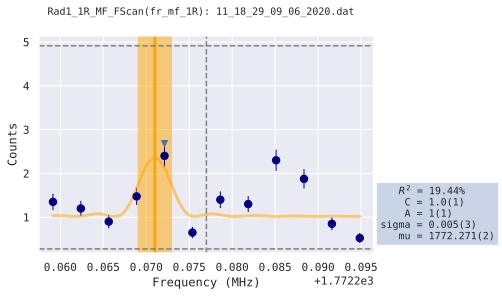

	    fr_mf_1R = 1772.271 	 fit failed, not set



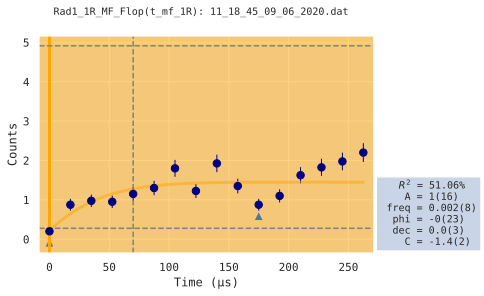

	    t_mf_1R = 0.0 	 fit failed, not set



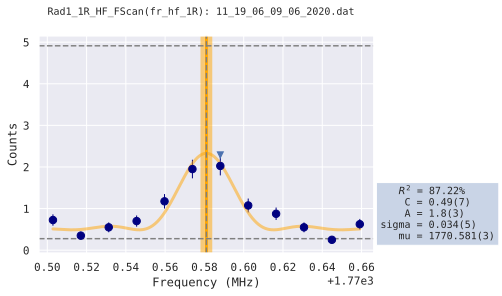

	set fr_hf_1R = 1770.581 [prev. 1770.581 (2020-06-09 11:16:58)]	 fit OK



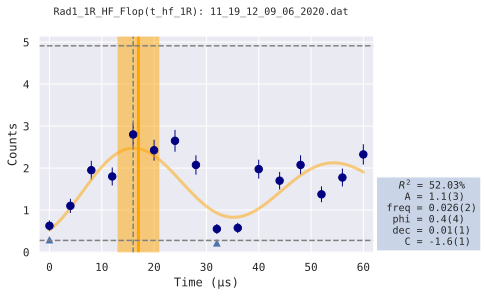

	    t_hf_1R = 17.0 	 fit failed, not set



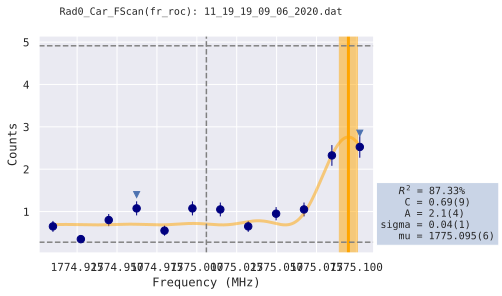

	set fr_roc = 1775.095 [prev. 1775.006 (2020-06-09 11:17:42)]	 fit OK



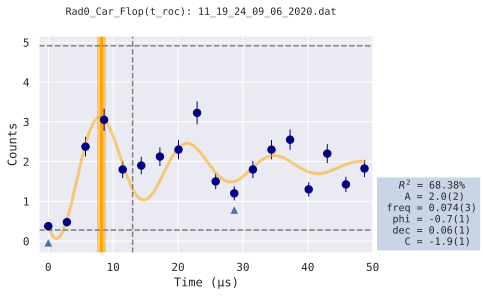

	    t_roc = 8.2 	 fit failed, not set

End session: 2020-06-09-11-18-27
----------------------------------
Done. Seq. took (hours:min:sec):
0:01:02.592530
---------------------------------- 



In [35]:
#paula.set('fr_mf_1R','1772.552')
#paula.set('t_mf_1R','12.')
#paula.set('fr_hf_1R','1770.8')
#paula.set('t_hf_1R','4.')
#paula.set('t_roc','5.')

paula.cal_rad_SBC_single_ion(EstFreqs=False, Level=None)

----------------------------------
Starting a heating rate measurement for the mf mode
2020-06-09 11:08:05.083922
Please wait...
---------------------------------- 

t_heat = 0.0.
Run Rad1_1R_MF_MA_fr (fr_mf_1R)
	start 1772.262714, stop 1772.291286, 
	points 11, experiment/point 100 rnd 0 show 0
	11_08_05_09_06_2020.dat [36dd5]
	duration 40.58s
-0.02620281130924785 -0.22662612962877818
Est. thermal <n> = -0.0(-2)
















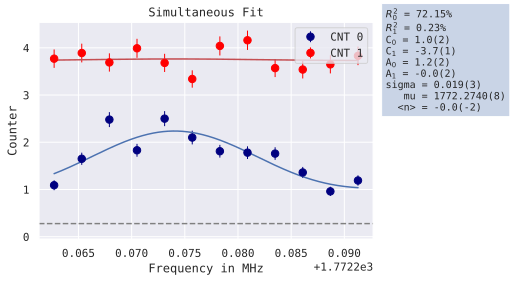

no meta fit possible
End session: 2020-06-09-11-08-05
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:41.064759
---------------------------------- 



In [29]:
paula.heating_rate(mode_name='mf',t_heat_start=0, t_heat_end=0, steps=1, random=False, 
                  numofpoints=11, expperpoint=100, rnd_sampled=False, zeros=False)

In [6]:
#paula.heating_rate(mode_name='hf',t_heat_start=0, t_heat_end=1, steps=1, random=False, 
 #                  numofpoints=9, expperpoint=200, rnd_sampled=False, zeros=False);

In [30]:
#paula.check_MF_temp(Npis=3,Npts=7,Nexp=120, fock=False, fitit=1, angle=42)

In [ ]:
#paula.check_HF_temp(Npis=3,Npts=7,Nexp=120, fock=False, fitit=1, angle=48)#

In [32]:
#paula.heating_rate(mode_name='mf',t_heat_start=10, t_heat_end=10, steps=1, random=False, 
 #                  numofpoints=9, expperpoint=50, rnd_sampled=False, zeros=False);

In [ ]:
#paula.heating_rates_iteration('mf',0,25,6,numofpoints=13,expperpoint=150,set_dur=False)

In [ ]:
#TO GEHT THE ser_dur=True working one needs to implement the same as above with get_history!
#paula.session_replay_fit_simultaneously_freq_iter('2020-02-20-10-09-59',set_dur=False)#

# Axial Raman control

----------------------------------
Axial SBC single ion
2020-06-09 11:23:53.925040
Please wait...
---------------------------------- 

___Check SBC___


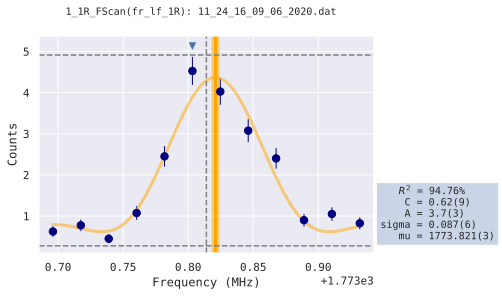

	set fr_lf_1R = 1773.821 [prev. 1773.814 (2020-06-09 11:23:01)]	 fit OK



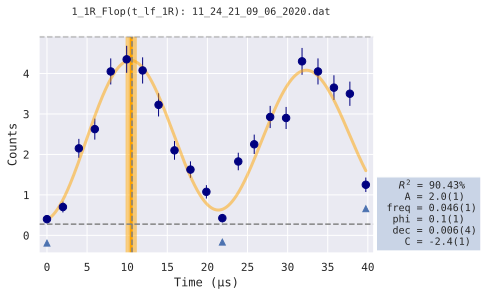

	set t_lf_1R = 10.5 [prev. 10.6 (2020-06-09 11:23:10)]	 fit OK



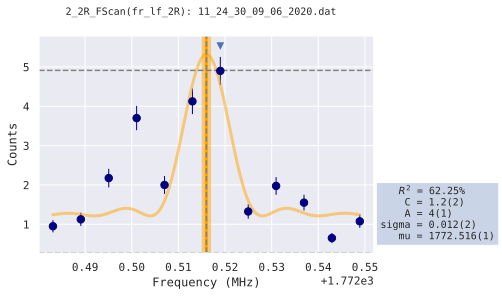

	    fr_lf_2R = 1772.516 	 fit failed, not set



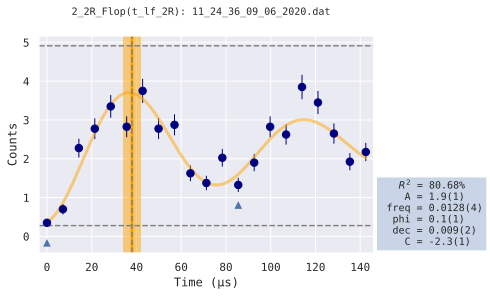

	set t_lf_2R = 38.0 [prev. 38.0 (2020-06-09 11:23:26)]	 fit OK



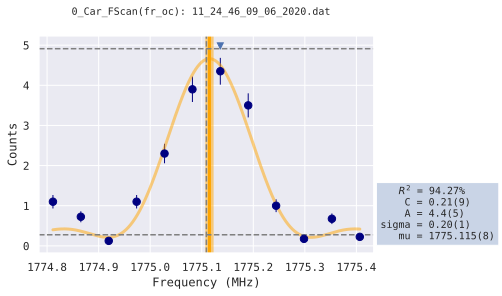

	set fr_oc = 1775.115 [prev. 1775.109 (2020-06-09 11:23:31)]	 fit OK



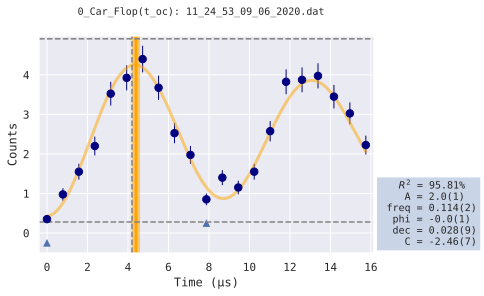

	set t_oc = 4.4 [prev. 4.2 (2020-06-09 11:23:40)]	 fit OK

End session: 2020-06-09-11-23-53
----------------------------------
Done. Seq. took (hours:min:sec):
0:01:06.912808
---------------------------------- 



In [41]:
#paula.set('t_lf_1R','2')
#paula.set('t_lf_2R','6.')
#paula.set('fr_lf_2R','1772.58')
#paula.set('t_oc','1')
paula.cal_ax_SBC_single_ion(EstFreqs=False, Level=None)

#paula.set('t_lf_str_2R','10.')
#paula.cal_fr('6_2R_STR_FScan', 'STR_2R', False, expperpoint=40, numofpoints=11);
#paula.cal_dur('6_2R_STR_Flop', 'lf_str_2R', True, expperpoint=40, numofpoints=11, verbose=True);
#paula.cal_ax_SBC_two_ions(EstFreqs=False)

----------------------------------
Starting a heating rate measurement for the lf mode
2020-06-09 11:21:49.342474
Please wait...
---------------------------------- 

t_heat = 0.0.
Run 1_1R_LF_MA_fr (fr_lf_1R)
	start 1773.727542, stop 1773.914458, 
	points 13, experiment/point 100 rnd 1 show 0
	11_21_49_09_06_2020.dat [1074e]
	duration 21.75s
0.08032299411600699 0.08414320443532912
Est. thermal <n> = 0.08(8)
















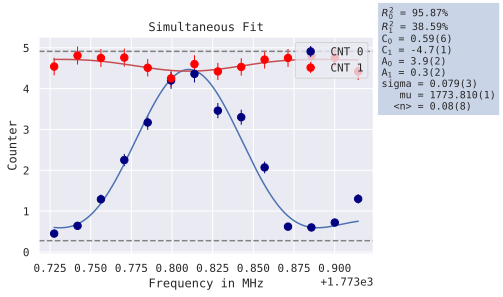

no meta fit possible
End session: 2020-06-09-11-21-49
----------------------------------
Done. Seq. took (hours:min:sec):
0:00:22.245420
---------------------------------- 



In [39]:
paula.heating_rate(mode_name='lf',t_heat_start=0, t_heat_end=0, steps=1, random=False, 
                   numofpoints=13, expperpoint=100, rnd_sampled=True, zeros=False);

----------------------------------
Mode LF temperature
2020-06-09 10:59:57.789743
Please wait...
---------------------------------- 

RD/RP OK
Run 1_1R_LF_MA (t_lf_1R) 
	start 0.000000, stop 54.000000, 
	points 33, experiments/point 100 rnd 0 show 0


Output(layout=Layout(height='360px'))

	10_59_59_09_06_2020.dat [cd9bd]
	duration 52.50s
	10_59_59_09_06_2020.dat [cd9bd]
	duration 52.50s
/home/qsim/Results/tiamo4.sync/2020/06_Juni/09/OC_Axial/1_1R_LF_MA/10_59_59_09_06_2020.dat


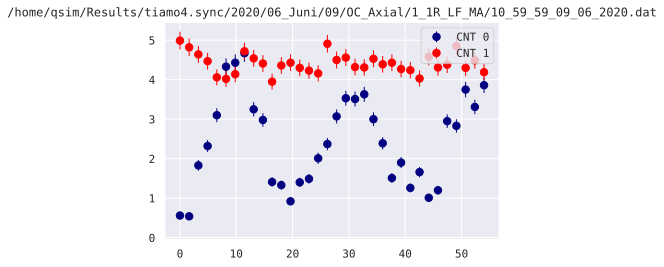

1_1R_LF_MA: 10_59_59_09_06_2020
1_1R_LF_MA: 10_59_59_09_06_2020
Save data locally ./data/10_59_59_09_06_2020.pkl
Free parameter count 5
migrad started at Tue Jun  9 11:01:20 2020
1_1R_LF_MA: 10_59_59_09_06_2020
Save data locally ./data/10_59_59_09_06_2020.pkl
Free parameter count 5
migrad started at Tue Jun  9 11:01:20 2020
migrad finished at Tue Jun  9 11:01:40 2020


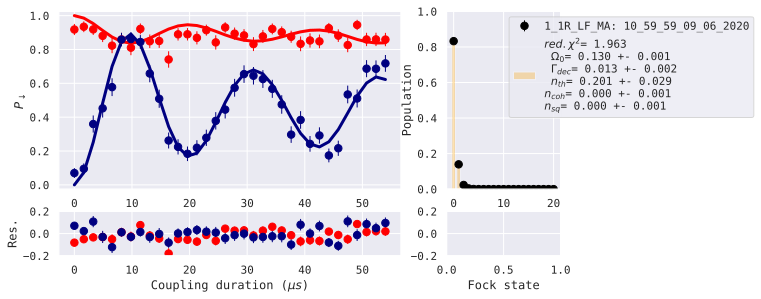

	set rabi_lf = 0.13 [prev. 0.11 (2020-06-09 10:46:38)]	 fit OK

	set n_th_lf = 0.2 [prev. 0.17 (2020-06-09 10:46:38)]	 fit OK

End session: 2020-06-09-10-59-57
----------------------------------
Done. Seq. took (hours:min:sec):
0:01:44.661904
---------------------------------- 

total time: 104.663


In [23]:
t1 = time.time()
paula.check_LF_temp(Npis=3, Npts=11, Nexp=100, fock=False, fitit=1, angle=0)
print("total time:", np.round(time.time()-t1, 3))

In [ ]:
#paula.heating_rate(t_heat_start=0, steps=1, expperpoint=200, mode_name='lf')

In [ ]:
#paula.heating_rates_iteration(iter_end=5,iter_steps=5)

In [ ]:
#paula.session_replay_fit_sim_freq_iter('2020-04-15-12-46-36')

# Mod. rf to squeeeze MF mode

In [ ]:
#paula.cal_rad_SBC_single_ion(Level=1)
#paula.check_MF_temp(Npis=3,Npts=7,Nexp=75, fock=False, fitit=1, angle=38)

In [ ]:
paula.check_ion_pos(1., .05, .05, .3, itera=1);
#paula.cal_mode_freq(prec=1, Level=2);
paula.cal_rad_SBC_single_ion(Level=1)

In [ ]:
#Calibrate mode detuning...
Tmod_dur=35.

#Take data...
res = []
#scan_range = np.linspace(1.4,2.6,9)
scan_range = [2.]
for Tmod_amp in scan_range:
    print('------------------------------------------------------')
    print('Mod. duration (µs) and amplitude (a.u.):', Tmod_dur, Tmod_amp)
    print('------------------------------------------------------')
    fr_mf_sq,err,gof=paula.ModRF_squeeze_MF(21, Tmod_dur, Tmod_amp, -0.018, numofpoints=17, expperpoint=100)
    res.append([Tmod_amp, fr_mf_sq, err])
    
print(res) 
paula.errplt(res, lbls=['Mod. ampl. (a.u.)','Eff. sq. freq. (MHz)'])

In [ ]:
#Take data...
Tmod_amp = 2.
fnames = []

for Tmod_dur in [45,15,35,25,55,5,65]:
    print('------------------------------------------------------')
    print('Mod. duration (µs) and amplitude (a.u.):', Tmod_dur, Tmod_amp)
    print('------------------------------------------------------')
    paula.do_live=True
    name=paula.ModRF_squeeze_MF_ana(21, Tmod_dur, Tmod_amp, fr_mf_sq, numofpoints=4*8, expperpoint=120)
    paula.do_live=False
    fnames.append(name)
print(fnames)

In [ ]:
#Analyse results
res=[[0,0.01,0.1]]
for i in range(len(fnames)):
    ip_l, red_chi, fmin, param = ana_mf_sq(fnames[i], fix=[0,0,1,1,1,1,0])
    res.append([ip_l[1],param[6]['value'],param[6]['error']])
res=np.array(res)

paula.single_fit_func([res[:,0],np.arcsinh(res[:,1]**0.5),res[:,2]], paula.fit_linear, invert=False, add_contrast=False, 
                                            give_all_para=False,
                                            xlabel='Sq. duration (µs)',
                                            ylabel='<r_sq>');

# Mod. rf to add sbs to MF and HF modes

In [ ]:
ips=paula.get_all_ips('t_bd');

In [ ]:
[fr_exc], _ = paula.cal_mode_freq(prec=.5, Level=2);

cal_begin = paula.print_header('Checking Modulation Offset')

seq_couple_MFHF=['PDQ_init',
                'COOL_d','OSC_TRG','MDLTN_OFFST_TCKL','DTCT0_bdx']

x_liste=[]
freq_liste = []
freq_err_liste = []
amp_liste = []
amp_err_liste = []

#u_mod = sorted(np.linspace(0, 2.4, 7), key = lambda x: random.random())
u_mod = np.linspace(0, 0.2, 7)
for i in range(len(u_mod)):
    print(u_mod[i])
    ips_couple_MFHF=[['shim_mod', 'ch3p8'],['u_mod', u_mod[i]],['fr_mod',.100],['t_mod',50],
                     ['fr_exc',fr_exc],['u_exc',2.75]]
    
    data = paula.run_seq(seq=seq_couple_MFHF,
                  par_type=None, par_name='EU_target.ch3p8', scl=1., start = 3.135, stop=3.2, npts=40, nexp=100, rnd_sampled=1,
                  ips=ips_couple_MFHF,
                  fit_result=1,
                  fit_func = paula.fit_single_gauss,
                  invert = True,
                  set_op_para = 0,
                  check_script=0);
    
    if data[2]>0.25:
        x_liste.append(u_mod[i])
        freq_liste.append(data[0][0])
        freq_err_liste.append(data[1][0])
        amp_liste.append(data[3][1])
        amp_err_liste.append(data[4][1])
        
    try:    
        x = np.array(x_liste)
        y = np.array(freq_liste)
        yerr = np.array(freq_err_liste)
        data_fit = [x,y,yerr]
        data_fr = paula.single_fit_func(data_fit, paula.fit_single_parabola, invert=True, 
                                   add_contrast=False, xlabel='Modulation amplitude (V)', 
                                   ylabel='RF ampl. Ch3p8 (V)', give_all_para=True)

        y = np.array(amp_liste)
        yerr = np.array(amp_err_liste)
        data_fit_off = [x,y,yerr]
        data_off = paula.single_fit_func(data_fit_off, paula.fit_single_parabola, invert=False, 
                                   add_contrast=False, xlabel='Modulation amplitude (V)', 
                                   ylabel='Carrier ampl. (Cts.)', give_all_para=True)
    except:
        print('No fit!')

print(data_fit)
#Not working
#zero = -data_off[3][2]*(np.sqrt(data_off[3][0]/data_off[3][1])-1)+data_off[3][3]
#ch3p8 = -data_fr[3][1]*(1-((zero-data_fr[3][3])/data_fr[3][2])**2)-data_fr[3][0]
#print(format(ch3p8,'0.2f'))
paula.print_footer(cal_begin)

In [ ]:
x = np.array([0.  , 0.11, 0.22, 0.33, 0.44, 0.55, 0.66, 0.77, 0.88, 0.99, 1.1 ,0.   , 0.017, 0.034, 0.051, 0.068, 0.085, 0.102, 0.119, 0.136,
       0.153, 0.17, 0.  , 0.06, 0.12, 0.18, 0.24, 0.3 , 0.36, 0.42, 0.48, 0.54, 0.6 ,0.5, 0.1, 0.2, 0.6, 0.4, 0.3, 0. ,1.2, 0.8, 1. , 0.6, 0.2, 0.4, 0. ])
y = np.array([3.1417, 3.1438, 3.1534, 3.168 , 3.1881, 3.2135, 3.2435, 3.277 ,
       3.3157, 3.3562, 3.4049, 3.1421, 3.1415, 3.1422, 3.1425, 3.1435, 3.1452, 3.1449, 3.1455,
       3.148 , 3.147 , 3.15, 3.1406, 3.141 , 3.1451, 3.1495, 3.1567, 3.1648, 3.1752, 3.1869,
       3.1994, 3.2135, 3.2295,3.2026, 3.1426, 3.1504, 3.2307, 3.1823, 3.1634, 3.1403, 3.4472, 3.2871, 3.3622, 3.2256, 3.1507, 3.18  , 3.1409])
yerr = np.array([0.0007, 0.0008, 0.0007, 0.0006, 0.0008, 0.0007, 0.0007, 0.0009,
       0.0006, 0.0007, 0.001, 0.0007, 0.0007, 0.0006, 0.0008, 0.0006, 0.0008, 0.0005, 0.0007,
       0.001 , 0.002 , 0.002, 0.0008, 0.001 , 0.0007, 0.0005, 0.0004, 0.0005, 0.0006, 0.0007,
       0.0008, 0.0009, 0.0007,0.0004, 0.0004, 0.0004, 0.0009, 0.0005, 0.0004, 0.0006,0.0008, 0.0006, 0.0008, 0.0007, 0.0006, 0.0007, 0.0008])
data_fit = [x,y,yerr]
data_fr = paula.single_fit_func(data_fit, paula.fit_single_parabola, invert=True, 
                           add_contrast=False, xlabel='Modulation amplitude (V)', 
                           ylabel='RF ampl. Ch3p8 (V)', give_all_para=True, plot_residuals=True)

In [ ]:
[fr_exc], _ = paula.cal_mode_freq(prec=.5, Level=2);
seq_couple_MFHF=['PDQ_init',
                'COOL_d','OSC_TRG','MDLTN_OFFST_TCKL','DTCT0_bdx']
ips_couple_MFHF=[['shim_mod', 'ch3p8'],['u_mod',0.15],['fr_mod',.100],['t_mod',50],
                     ['fr_mf',2.84],
                     ['fr_exc',2.84],['u_exc',3.5],['t_bdd_cool',1250]]

paula.set_profile('EU_target','ch3p8', 3.141)
paula.run_seq(seq=seq_couple_MFHF,
                  par_type='fr', par_name='exc', scl=4., scl_pts=2., nexp=50, rnd_sampled=0,
                  ips=ips_couple_MFHF,
                  fit_result=1,
                  fit_func = paula.fit_three_gauss,
                  invert = True,
                  set_op_para = 0,
                  check_script=0);

# Mod. a set of control shims to add sbs to LF mode

In [ ]:
#[fr_exc], _ = paula.cal_mode_freq(prec=.5, Level=1);
seq=['PDQ_init',
     'COOL_d','OSC_TRG','TCKL_exc','TCKL_exc1','DTCT0_bdx',
     'COOL_d','OSC_TRG','TCKL_exc_0','TCKL_exc','DTCT1_bdx'
    ]
ips=[
    ['shim_exc','ERaO'],['fr_exc', fr_exc],['t_exc',50],['u_exc',.75], ['phs_tckl', 0], ['fxd_phs', 1],
    ['shim_exc1','ERiO'],['fr_exc1', fr_exc],['t_exc1',50],['u_exc1',.8], ['phs_tckl1', 0]
    ]

paula.run_seq(seq=seq,
                  par_type='phs', par_name='tckl', scl=1., scl_pts=1., nexp=50, rnd_sampled=0,
                  ips=ips,
                  fit_result=1,
                  fit_func = paula.fit_single_gauss,
                  invert = True,
                  set_op_para = 1,
                  check_script=0);

# Classical parametric amplification of MF mode excitations
[a la Dehmelt 1993]

In [ ]:
res_mode_frs=paula.cal_mode_freq(prec=2., Level=0);

In [ ]:
current_ips=paula.get_all_ips(loc='fr_mf');
paula.set('fr_exc', res_mode_frs[2][0])

In [ ]:
#paula.get_all_ips(loc='fr_');
fr_exc = paula.get('fr_exc')

seq_para_ampl=['PDQ_init',
               'COOL_d','TCKL_exc','OSC_TRG','SQZ_MDLTN_mf','DTCT0_bdx',
               'COOL_d','TCKL_exc','DTCT1_bdx']
#ips_para_ampl=[['shim_exc', 'EZO'],['fr_exc', res_mode_frs[2]],['t_exc', 100.],['u_exc', 0.125], ['phs_tckl',-2.], 
#               ['t_sq_mf', 65.],['u_sq_mf', 2.], ['phs_sq',0.],
#               ['fxd_phs',1]]
ips_para_ampl=[['shim_exc', 'EZO'],['fr_exc', res_mode_frs[2][0]],['t_exc', 100.],['u_exc', 0.3],
               ['phs_tckl',-0.5], 
               ['t_sq_mf', 75.],['u_sq_mf', 2.5], ['phs_sq',0.],
               ['fxd_phs',1]]

In [ ]:
#Check Shift of Squeezing
paula.run_seq(seq=seq_para_ampl,
              par_type='fr', par_name='shift_sq_mf', scl=.5, npts=15, nexp=100, rnd_sampled=1,
              ips=ips_para_ampl,
              fit_result=True, set_op_para=1,
              check_script=0);

#Check Tickle Phase
paula.run_seq(seq=seq_para_ampl,
              par_type='phs', par_name='tckl', scl=.75, npts=15, nexp=100, rnd_sampled=1,
              ips=ips_para_ampl,
              fit_result=1, invert=1, set_op_para=1,
              check_script=0);

#Check Squeez Phase
paula.run_seq(seq=seq_para_ampl,
              par_type='phs', par_name='sq', scl=0.75, npts=15, nexp=100, rnd_sampled=1,
              ips=ips_para_ampl,
              fit_result=1, set_op_para=1,invert=1,
              check_script=0);

## Parametric amplification of low tickle excitation
paula.run_seq(seq=seq_para_ampl,
              par_type='fr', par_name='exc', scl=0.5, npts=15, nexp=200, rnd_sampled=1,
              ips=ips_para_ampl,
              fit_result=1, set_op_para=1,
              check_script=0);

In [ ]:
## Parametric amplification of low tickle excitation
paula.run_seq(seq=seq_para_ampl,
              par_type='fr', par_name='exc', scl=0.5, npts=20, nexp=200, rnd_sampled=1,
              ips=ips_para_ampl,
              fit_result=1, set_op_para=1,
              check_script=0);

In [ ]:
#Check Shift of Squeezing
paula.run_seq(seq=seq_para_ampl,
              par_type='fr', par_name='shift_sq_mf', scl=.5, npts=17, nexp=300, rnd_sampled=0,
              ips=ips_para_ampl,
              fit_result=True, set_op_para=1,
              check_script=0);

In [ ]:
#Check Tickle Phase
paula.run_seq(seq=seq_para_ampl,
              par_type='phs', par_name='tckl', scl=.75, npts=22, nexp=300, rnd_sampled=0,
              ips=ips_para_ampl,
              fit_result=1, invert=1, set_op_para=0,
              check_script=0);

In [ ]:
#Check Squeez Phase
paula.run_seq(seq=seq_para_ampl,
              par_type='phs', par_name='sq', scl=0.75, npts=22, nexp=100, rnd_sampled=0,
              ips=ips_para_ampl,
              fit_result=1, set_op_para=1,invert=1,
              check_script=0);

In [ ]:
## Parametric amplification of low tickle excitation
#paula.do_live=True
#paula.run_seq(seq=['PDQ_init','COOL_d','TCKL_mf','Mod_SQ_mf','DTCT0_bdx','COOL_d','Mod_SQ_mf','DTCT1_bdx'],
#              par_type='t', par_name='sq_mf', scl=1., start=0, stop=70, npts=22, nexp=300, rnd_sampled=0,
#              ips=[['t_sq_mf', 70.],['u_sq_mf', 2.8],['u_tickle_mf', .125]],
#              fit_result=True, set_op_para=False,
#              check_script=0);

In [ ]:
## Parametric amplification of low tickle excitation
#paula.do_live=True
#paula.run_seq(seq=['PDQ_init','COOL_d','OSC_TRG','PSL_TRN_BDx','Mod_SQ_mf','DTCT0_bdx'],
#              par_type=None, par_name='rep_rate', scl=1., start=2.82, stop=2.84, npts=17, nexp=300, rnd_sampled=1,
#              ips=[],
#              fit_result=True,
#              check_script=0);

## Sandbox

In [ ]:
x = [0.75, 1.5, 3.0]
y = [0.062, 0.09, 0.12]
z = np.linspace(0.,4.,10)
plt.plot(x,y,'C4x')
popt,pcov = curve_fit(fit_lin,x,y)
plt.plot(z,fit_lin(z,*popt),'C4--')
print(popt,pcov)

x = [0.75, 1.5, 3.0]
y = [-1.4, -0.3, 0.2]
z = np.linspace(0.,4.,10)
plt.plot(x,y,'C5x')
popt,pcov = curve_fit(fit_lin,x,y)
plt.plot(z,fit_lin(z,*popt),'C5--')
print(popt,pcov)


In [ ]:
x = [0.75, 1.5, 3.0]
y = [0.062, 0.09, 0.12]
z = np.linspace(0.,4.,10)
plt.plot(x,y,'C4x')
popt,pcov = curve_fit(fit_lin,x,y)
plt.plot(z,fit_lin(z,*popt),'C4--')
print(popt,pcov)

x = [0.75, 1.5, 3.0]
y = [-1.4, -0.3, 0.2]
z = np.linspace(0.,4.,10)
plt.plot(x,y,'C5x')
popt,pcov = curve_fit(fit_lin,x,y)
plt.plot(z,fit_lin(z,*popt),'C5--')
print(popt,pcov)


def func(u_mod,t_exc):
    return (0.025*u_mod+0.047)*t_exc+(-0.138*u_mod+0.31)

In [ ]:
paula.cal_mode_fr('PDQ_MF_FScan', 'mf', 0.6, 200);
name,data = paula.run('PDQ_MF_FScan',par_name='t_tickle_mf',
                      start=0,stop=200,expperpoint=400,numofpoints=20,counter=None)
paula.plot_data(data,name)
paula.cal_mode_fr('PDQ_MF_FScan', 'mf', 0.6, 200);
print(datav2)

In [ ]:
paula.cal_mode_fr('PDQ_MF_FScan', 'mf', 0.6, 100);

In [ ]:
paula.cal_mode_fr('PDQ_MF_FScan', 'mf', 0.3, 500);

In [ ]:
paula.do_plot=True
paula.cal_mode_freq_evolution(0.85,90)

In [ ]:
'2020-05-29-09-25-13',#0.8,100,3.5(2)
'2020-05-29-09-25-13',#0.8,100,3.5(2)

In [ ]:
'2020-05-29-09-22-08',#1,100,4.9
'2020-05-29-09-23-05',#0.9,90,5.1
'2020-05-29-09-23-05',#0.9,90,5.1

In [ ]:
sid = ['2020-05-29-09-12-40',#100,1
'2020-05-29-09-14-10',#0.55,200
#'2020-05-29-09-14-50',#0.35,300
#'2020-05-29-09-16-24',#0.275,400
'2020-05-29-09-17-49']#0.275,500

In [ ]:
paula.do_plot=True
paula.cal_mode_freq_evolution(1/1.5,150)

In [ ]:
sid = ['2020-05-28-18-11-30','2020-05-28-18-14-28','2020-05-28-18-16-33',
       '2020-05-28-18-17-21','2020-05-28-18-19-52','2020-05-28-18-22-48','2020-05-28-18-24-35',
      '2020-05-28-18-26-40','2020-05-28-18-33-42']

In [ ]:
sid

In [ ]:
data_list = paula.sesion_replay_meta_meta(sid,
                              'sigma','t_tickle_mf','PDQ_MF_FScan',0, color='C3',
                                    label='after')

In [ ]:
plt.errorbar(data_list[0],data_list[1]*1000,data_list[2]*1000,
             linestyle = "None", marker = "o",
             label=None, color='C0', markersize=7.5, lw=1., capsize=.0)
plt.xlabel('t_tickle_mf in us')
plt.ylabel('sigma in kHz')

guess = [50,50,3]
popt,pcov = curve_fit(exp_fit, data_list[0],data_list[1]*1000,sigma=data_list[2]*1000,p0=guess)
z = np.linspace(30,350,100)
plt.plot(z,exp_fit(z,*popt))
plt.plot(z,exp_fit(z,70,61,3),'C0--')
plt.plot(z,exp_fit(z,50,43,1.6),'C0--')
for i in range(len(popt)):
    print(paula.round_paula([popt[i]],np.sqrt([pcov[i][i]])))
    
#taken at an other day. u_mod=1.5, t_mod=150
plt.errorbar(data_tckl_mod_x15150,np.array(data_tckl_mod_y15150)*1000,np.array(data_tckl_mod_yerr15150)*1000,
             linestyle = "None", marker = "o",
             label=None, color='C3', markersize=7.5, lw=1., capsize=.0)

In [ ]:
from scipy.optimize import curve_fit
def exp_fit(x,a,b,c):
    return a*np.exp(-x/b)+c

In [ ]:
plt.plot(z,exp_fit(z,50,50,3))

In [ ]:
len(popt)

In [ ]:
paula.cal_mode_freq(prec=0.25,Level=2)

In [ ]:
Ch12 = paula.read_avg_adc_me(ch=12, no_avg=100, verbose=True)
Ch12 = paula.round_paula([Ch12[0]],[Ch12[1]])
Ch03 = paula.read_avg_adc_me(ch=3, no_avg=100, verbose=True)
Ch03 = paula.round_paula([Ch03[0]],[Ch03[1]])

print(Ch12, Ch03)

script_name_Tckl_Mod = 'z_CPA_Tckl_Mod'
script_name_Mod_Tckl_Mod = 'z_CPA_Mod_Tckl_Mod'
do_plot=True
sid = paula.squeezing_calibration('mf', u_exc=0.6, u_mod=1.5, t_exc=100, t_mod=75,
                                  phs_mod=0,
                            script_name='z_CPA_Tckl_Mod',
                            do_tickle_before=False, do_fr_exc=True, do_fr_mod=True, 
                            do_phs_exc=True, do_phs_mod=False, do_fr_exc_again=False,
                           show_ct0=True, show_ct1=True,
                                 expperpoint=75) 

In [ ]:
paula.session_replay_Paula('2020-05-26-10-14-31','z_CPA_Tckl_Mod',)

In [ ]:
paula.session_replay_Paula('2020-05-26-10-19-32','z_CPA_Tckl_Mod',)

In [ ]:
sid

In [ ]:
paula.squeezing_experiment_calibration_loop('t_exc',100,70,2)

In [ ]:
paula.squeezing_dict('t_exc')

In [ ]:
ret_amp, ret_sigma, ret_mu, data_amp, data_sigma, data_mu = paula.squeezing_fr_plot(
    mode_name='mf', scan_var='fr_exc', var_name='u_mod', script_name='z_CPA_Mod_Tckl_Mod',
    u_exc=1, u_mod=None, fr_mod=-0.2, t_exc=100,
    iter_start=0.0, iter_end=5, steps=2,
    numofpoints=15, expperpoint=100,
    show_ct1=False)

In [ ]:
np.linspace(0.0,5,26)

In [ ]:
paula.squeezing_fr('fr_mod', script_name='z_CPA_Tckl_Mod',
                   u_mod=1.5, t_exc=10, u_exc=0.6)

In [ ]:
np.linspace(0,200,41)

In [ ]:
paula.cal_mode_fr('PDQ_MF_FScan', 'mf', 0.6, 200);
namev2,datav2 = paula.run('PDQ_MF_FScan',par_name='t_tickle_mf',
                      start=0,stop=200,expperpoint=400,numofpoints=20,counter=None)
paula.plot_data(datav2,namev2)
paula.cal_mode_fr('PDQ_MF_FScan', 'mf', 0.6, 200);
print(datav2)

In [ ]:
data

In [ ]:
data_y = []
for i in range(len(data[0][1])):
    data_y.append(data[0][1][0]-data[0][1][i])
plt.plot(data[0][0],data_y,'C0o')

In [ ]:
np.linspace(0,3,7)

In [ ]:
z = np.linspace(3,1.0,5)
sid_list=[]
for i in range(len(z)):
    print(z[i])
    sid = paula.squeezing_calibration('mf', u_exc=0.6, u_mod=z[i], t_exc=40, t_mod=75,
                                phs_mod=0,
                            script_name='z_CPA_Tckl_Mod',
                            do_tickle_before=False, do_fr_exc=True, do_fr_mod=True,
                            do_phs_exc=True, do_phs_mod=False,
                            do_fr_exc_again=True, do_fr_mod_again=True,
                           show_ct0=True, show_ct1=True,
                                expperpoint=200, numofpoints=14)
    sid_list.append(sid)

In [ ]:
sid_list

In [ ]:
#t_exc = 100
['2020-05-27-17-22-50',
 '2020-05-27-17-24-27',
 '2020-05-27-17-26-04',
 '2020-05-27-17-27-41',
 '2020-05-27-17-29-16',
 '2020-05-27-17-30-53',
 '2020-05-27-17-32-29']
#t_exc = 50
['2020-05-27-17-37-47',
 '2020-05-27-17-39-23',
 '2020-05-27-17-40-57',
 '2020-05-27-17-42-32',
 '2020-05-27-17-44-08',
 '2020-05-27-17-45-43',
 '2020-05-27-17-47-24']
#t_exc=20
['2020-05-27-17-51-24',
 '2020-05-27-17-52-58',
 '2020-05-27-17-54-37',
 '2020-05-27-17-56-15']
#t_exc=40
print(sid_liste)


data = [[0.00000000e+00, 9.99900000e+00, 1.99980000e+01, 2.99970000e+01,
         3.99960000e+01, 4.99950000e+01, 5.99940000e+01, 6.99930000e+01,
         7.99920000e+01, 8.99910000e+01, 9.99900000e+01, 1.09989000e+02,
         1.19988000e+02, 1.29987000e+02, 1.39986000e+02, 1.49985000e+02,
         1.59984000e+02, 1.69983000e+02, 1.79982000e+02, 1.89981000e+02,
         1.99980000e+02],
        [4.79250000e+00, 4.73500000e+00, 4.71750000e+00, 4.76500000e+00,
         4.33500000e+00, 4.56750000e+00, 4.03000000e+00, 3.71500000e+00,
         3.33250000e+00, 2.81750000e+00, 2.71500000e+00, 2.76250000e+00,
         2.30500000e+00, 2.00000000e+00, 1.96750000e+00, 1.67500000e+00,
         1.69500000e+00, 1.60000000e+00, 1.38000000e+00, 1.34750000e+00,
         1.29750000e+00],
        [1.09595977e-01, 1.08936532e-01, 1.08735037e-01, 1.09281087e-01,
         1.04233688e-01, 1.06992376e-01, 1.00500003e-01, 9.64923673e-02,
         9.13899903e-02, 8.40321576e-02, 8.24894616e-02, 8.32079257e-02,
         7.60061995e-02, 7.07992325e-02, 7.02216327e-02, 6.47919361e-02,
         6.51776058e-02, 6.33247587e-02, 5.88102594e-02, 5.81136213e-02,
         5.70252549e-02]]



In [ ]:
script_name_Tckl_Mod = 'z_CPA_Tckl_Mod'
script_name_Mod_Tckl_Mod = 'z_CPA_Mod_Tckl_Mod'
do_plot=True
sid = paula.squeezing_calibration('mf', u_exc=0.6, u_mod=3, t_exc=50, t_mod=75,
                                  phs_mod=0,
                            script_name='z_CPA_Tckl_Mod',
                            do_tickle_before=False, do_fr_exc=True, do_fr_mod=True, 
                            do_phs_exc=True, do_phs_mod=False, do_fr_exc_again=False,
                           show_ct0=True, show_ct1=True,
                                 expperpoint=50) 
sid = paula.squeezing_calibration('mf', u_exc=0.6, u_mod=3, t_exc=40, t_mod=75,
                                  phs_mod=0,
                            script_name='z_CPA_Tckl_Mod',
                            do_tickle_before=False, do_fr_exc=True, do_fr_mod=True, 
                            do_phs_exc=True, do_phs_mod=False, do_fr_exc_again=False,
                           show_ct0=True, show_ct1=True,
                                 expperpoint=50) 
sid = paula.squeezing_calibration('mf', u_exc=0.6, u_mod=3, t_exc=30, t_mod=75,
                                  phs_mod=0,
                            script_name='z_CPA_Tckl_Mod',
                            do_tickle_before=False, do_fr_exc=True, do_fr_mod=True, 
                            do_phs_exc=True, do_phs_mod=False, do_fr_exc_again=False,
                           show_ct0=True, show_ct1=True,
                                 expperpoint=50) 

z = np.linspace(3,1.0,5)
sid_list2=[]
for i in range(len(z)):
    print(z[i])
    sid = paula.squeezing_calibration('mf', u_exc=0.6, u_mod=z[i], t_exc=30, t_mod=75,
                                phs_mod=0,
                            script_name='z_CPA_Tckl_Mod',
                            do_tickle_before=False, do_fr_exc=True, do_fr_mod=True,
                            do_phs_exc=True, do_phs_mod=False,
                            do_fr_exc_again=True, do_fr_mod_again=True,
                           show_ct0=True, show_ct1=True,
                                expperpoint=200, numofpoints=14)
    sid_list2.append(sid)

In [ ]:
print(sid_list2)

In [ ]:
#sid_list=['2020-05-27-10-50-50','2020-05-27-10-51-35','2020-05-27-10-52-20','2020-05-27-10-53-05']
before=paula.sesion_replay_meta_meta(sid_list,'A','u_mod','z_CPA_Tckl_Mod',0,
                              color='C0', xlabel='u_mod in arb.u.', ylabel='Amplitude in Counts',
                             label='before')
after=paula.sesion_replay_meta_meta(sid_list,
                              'A','u_mod','z_CPA_Tckl_Mod',3, color='C3',
                                    label='after')

In [ ]:
t = [np.array([1., 1., 1., 1.]), np.array([0.00729313, 0.00594331, 2.11697213, 0.00609393]), np.array([0.00073164, 0.00096717, 0.09753484, 0.00078299])]

In [ ]:
'2020-05-27-10-50-50','2020-05-27-10-51-35','2020-05-27-10-52-20','2020-05-27-10-53-05'

In [ ]:
#scan over u_mod, t_mod=75, u_exc=0.3 looks like it was 0.6, t_exc=100
data100=paula.sesion_replay_meta('2020-05-27-10-50-50', 'sigma','z_CPA_Tckl_Mod', 'u_mod', func=None, color='C0', label=None, plot_only=False);
data125=paula.sesion_replay_meta('2020-05-27-10-51-35', 'sigma','z_CPA_Tckl_Mod', 'u_mod', func=None, color='C0', label=None, plot_only=False);
data150=paula.sesion_replay_meta('2020-05-27-10-52-20', 'sigma','z_CPA_Tckl_Mod', 'u_mod', func=None, color='C0', label=None, plot_only=False);
data175=paula.sesion_replay_meta('2020-05-27-10-53-05', 'sigma','z_CPA_Tckl_Mod', 'u_mod', func=None, color='C0', label=None, plot_only=False);
data200=paula.sesion_replay_meta('2020-05-27-10-53-51', 'sigma','z_CPA_Tckl_Mod', 'u_mod', func=None, color='C0', label=None, plot_only=False);
data225=paula.sesion_replay_meta('2020-05-27-10-54-36', 'sigma','z_CPA_Tckl_Mod', 'u_mod', func=None, color='C0', label=None, plot_only=False);
data250=paula.sesion_replay_meta('2020-05-27-10-55-21', 'sigma','z_CPA_Tckl_Mod', 'u_mod', func=None, color='C0', label=None, plot_only=False);
data275=paula.sesion_replay_meta('2020-05-27-10-56-06', 'sigma','z_CPA_Tckl_Mod', 'u_mod', func=None, color='C0', label=None, plot_only=False,gof=0);
data300=paula.sesion_replay_meta('2020-05-27-10-56-53', 'sigma','z_CPA_Tckl_Mod', 'u_mod', func=None, color='C0', label=None, plot_only=False,gof=0);
data325=paula.sesion_replay_meta('2020-05-27-10-57-36', 'sigma','z_CPA_Tckl_Mod', 'u_mod', func=None, color='C0', label=None, plot_only=False);
data350=paula.sesion_replay_meta('2020-05-27-10-58-21', 'sigma','z_CPA_Tckl_Mod', 'u_mod', func=None, color='C0', label=None, plot_only=False);
data375=paula.sesion_replay_meta('2020-05-27-10-59-05', 'sigma','z_CPA_Tckl_Mod', 'u_mod', func=None, color='C0', label=None, plot_only=False);
data400=paula.sesion_replay_meta('2020-05-27-10-59-48', 'sigma','z_CPA_Tckl_Mod', 'u_mod', func=None, color='C0', label=None, plot_only=False);

data_tckl_mod_x    = [data100[0][0],data125[0][0],data150[0][0],data175[0][0],data225[0][0],data275[0][0],data300[0][0],data325[0][0],data350[0][0],data375[0][0],data400[0][0]]
data_tckl_mod_y    = [data100[1][0],data125[1][0],data150[1][0],data175[1][0],data225[1][0],data275[1][0],data300[1][0],data325[1][0],data350[1][0],data375[1][0],data400[1][0]]
data_tckl_mod_yerr = [data100[2][0],data125[2][0],data150[2][0],data175[2][0],data225[2][0],data275[2][0],data300[2][0],data325[2][0],data350[2][0],data375[2][0],data400[2][0]]

data_tckl_mod_x2    = [data100[0][3],data125[0][3],data150[0][3],data175[0][3],data225[0][3],data275[0][3],data300[0][3],data325[0][3],data350[0][3],data375[0][3],data400[0][3]]
data_tckl_mod_y2    = [data100[1][3],data125[1][3],data150[1][3],data175[1][3],data225[1][3],data275[1][3],data300[1][3],data325[1][3],data350[1][3],data375[1][3],data400[1][3]]
data_tckl_mod_yerr2 = [data100[2][3],data125[2][3],data150[2][3],data175[2][3],data225[2][3],data275[2][3],data300[2][3],data325[2][3],data350[2][3],data375[2][3],data400[2][3]]

In [ ]:
plt.errorbar(data_tckl_mod_x,data_tckl_mod_y, data_tckl_mod_yerr,linestyle = "None",
             marker = "o", label='before', color='C0', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(data_tckl_mod_x2,data_tckl_mod_y2, data_tckl_mod_yerr2,linestyle = "None",
             marker = "x", label='after', color='C3', markersize=7.5, lw=1., capsize=.0)
plt.legend()
plt.xlabel('u_nmod in arb.u.')
plt.ylabel('Amplitude in Counts (fr_exc)')

In [ ]:
plt.errorbar(data_tckl_mod_x,(data_tckl_mod_y-data_tckl_mod_y[0])*1000, data_tckl_mod_yerr,linestyle = "None",
             marker = "o", label='before', color='C0', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(data_tckl_mod_x2,(data_tckl_mod_y2-data_tckl_mod_y2[0])*1000, data_tckl_mod_yerr2,linestyle = "None",
             marker = "x", label='after', color='C3', markersize=7.5, lw=1., capsize=.0)
plt.legend()
plt.xlabel('u_mod in arb.u.')
plt.ylabel('Delta mu (fr_exc) in kHz')

In [ ]:
plt.errorbar(data_tckl_mod_x,(data_tckl_mod_y-data_tckl_mod_y[0])*1000, data_tckl_mod_yerr,linestyle = "None",
             marker = "o", label='before', color='C0', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(data_tckl_mod_x2,(data_tckl_mod_y2-data_tckl_mod_y2[0])*1000, data_tckl_mod_yerr2,linestyle = "None",
             marker = "x", label='after', color='C3', markersize=7.5, lw=1., capsize=.0)
plt.legend()
plt.xlabel('u_nmod in arb.u.')
plt.ylabel('Delta sigma (fr_exc) in kz')

In [ ]:
#scan over t_mod, u_mod=1.5, u_exc=0.6, t_exc=100
data150=paula.sesion_replay_meta('2020-05-27-10-05-23', 'mu','z_CPA_Tckl_Mod', 't_mod', func=None, color='C0', label=None, plot_only=False);
data140=paula.sesion_replay_meta('2020-05-27-10-04-48', 'mu','z_CPA_Tckl_Mod', 't_mod', func=None, color='C0', label=None, plot_only=False);
data130=paula.sesion_replay_meta('2020-05-27-10-04-13', 'mu','z_CPA_Tckl_Mod', 't_mod', func=None, color='C0', label=None, plot_only=False);
data120=paula.sesion_replay_meta('2020-05-27-10-03-40', 'mu','z_CPA_Tckl_Mod', 't_mod', func=None, color='C0', label=None, plot_only=False);
data110=paula.sesion_replay_meta('2020-05-27-10-03-07', 'mu','z_CPA_Tckl_Mod', 't_mod', func=None, color='C0', label=None, plot_only=False);
data100=paula.sesion_replay_meta('2020-05-27-10-02-34', 'mu','z_CPA_Tckl_Mod', 't_mod', func=None, color='C0', label=None, plot_only=False);
data90=paula.sesion_replay_meta('2020-05-27-10-02-00', 'mu','z_CPA_Tckl_Mod', 't_mod', func=None, color='C0', label=None, plot_only=False);
data80=paula.sesion_replay_meta('2020-05-27-10-01-27', 'mu','z_CPA_Tckl_Mod', 't_mod', func=None, color='C0', label=None, plot_only=False);
data70=paula.sesion_replay_meta('2020-05-27-10-00-54', 'mu','z_CPA_Tckl_Mod', 't_mod', func=None, color='C0', label=None, plot_only=False);
data60=paula.sesion_replay_meta('2020-05-27-10-00-20', 'mu','z_CPA_Tckl_Mod', 't_mod', func=None, color='C0', label=None, plot_only=False);
data50=paula.sesion_replay_meta('2020-05-27-09-59-47', 'mu','z_CPA_Tckl_Mod', 't_mod', func=None, color='C0', label=None, plot_only=False);
data40=paula.sesion_replay_meta('2020-05-27-09-59-14', 'mu','z_CPA_Tckl_Mod', 't_mod', func=None, color='C0', label=None, plot_only=False);
data30=paula.sesion_replay_meta('2020-05-27-09-58-40', 'mu','z_CPA_Tckl_Mod', 't_mod', func=None, color='C0', label=None, plot_only=False);
data20=paula.sesion_replay_meta('2020-05-27-09-58-07', 'mu','z_CPA_Tckl_Mod', 't_mod', func=None, color='C0', label=None, plot_only=False);
data10=paula.sesion_replay_meta('2020-05-27-09-57-34', 'mu','z_CPA_Tckl_Mod', 't_mod', func=None, color='C0', label=None, plot_only=False);
data0=paula.sesion_replay_meta('2020-05-27-09-57-02', 'mu','z_CPA_Tckl_Mod', 't_mod', func=None, color='C0', label=None, plot_only=False);

data_tckl_mod_x    = [data150[0][0],data140[0][0],data130[0][0],data120[0][0],data110[0][0],data100[0][0],data90[0][0],data80[0][0],data70[0][0],data60[0][0],data50[0][0],data30[0][0],data20[0][0],data10[0][0],data0[0][0]]
data_tckl_mod_y    = [data150[1][0],data140[1][0],data130[1][0],data120[1][0],data110[1][0],data100[1][0],data90[1][0],data80[1][0],data70[1][0],data60[1][0],data50[1][0],data30[1][0],data20[1][0],data10[1][0],data0[1][0]]
data_tckl_mod_yerr = [data150[2][0],data140[2][0],data130[2][0],data120[2][0],data110[2][0],data100[2][0],data90[2][0],data80[2][0],data70[2][0],data60[2][0],data50[2][0],data30[2][0],data20[2][0],data10[2][0],data0[2][0]]

In [ ]:
sid

In [ ]:
data100=paula.sesion_replay_meta('2020-05-27-09-42-49', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label='t_exc=100 us', plot_only=False);
data90=paula.sesion_replay_meta('2020-05-27-09-43-01', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data80=paula.sesion_replay_meta('2020-05-27-09-43-12', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data70=paula.sesion_replay_meta('2020-05-27-09-43-23', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data60=paula.sesion_replay_meta('2020-05-27-09-43-35', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data50=paula.sesion_replay_meta('2020-05-27-09-43-46', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data40=paula.sesion_replay_meta('2020-05-27-09-43-57', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data30=paula.sesion_replay_meta('2020-05-27-09-44-08', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data20=paula.sesion_replay_meta('2020-05-27-09-44-19', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data10=paula.sesion_replay_meta('2020-05-27-09-44-30', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data0=paula.sesion_replay_meta('2020-05-27-09-44-40', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);

data_tckl_mod_x= [data100[0][0],data90[0][0],data80[0][0],data70[0][0],data60[0][0],data50[0][0],data30[0][0],data20[0][0],data10[0][0],data0[0][0]]
data_tckl_mod_y = [data100[1][0],data90[1][0],data80[1][0],data70[1][0],data60[1][0],data50[1][0],data30[1][0],data20[1][0],data10[1][0],data0[1][0]]
data_tckl_mod_yerr = [data100[2][0],data90[2][0],data80[2][0],data70[2][0],data60[2][0],data50[2][0],data30[2][0],data20[2][0],data10[2][0],data0[2][0]]

### AmplificationFactor

In [ ]:
data100=paula.sesion_replay_meta('2020-05-26-12-25-31', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label='t_exc=100 us', plot_only=False);
data90=paula.sesion_replay_meta('2020-05-26-12-26-06', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data80=paula.sesion_replay_meta('2020-05-26-12-26-40', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data70=paula.sesion_replay_meta('2020-05-26-12-27-14', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data60=paula.sesion_replay_meta('2020-05-26-12-27-47', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data50=paula.sesion_replay_meta('2020-05-26-12-28-20', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data40=paula.sesion_replay_meta('2020-05-26-12-28-55', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data30=paula.sesion_replay_meta('2020-05-26-12-29-28', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data20=paula.sesion_replay_meta('2020-05-26-12-30-01', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
#data10=paula.sesion_replay_meta('2020-05-26-12-30-33', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data_tckl_mod_x15150= [data100[0][0],data90[0][0],data80[0][0],data70[0][0],data60[0][0],data50[0][0],data30[0][0],data20[0][0]]
data_tckl_mod_y15150 = [data100[1][0],data90[1][0],data80[1][0],data70[1][0],data60[1][0],data50[1][0],data30[1][0],data20[1][0]]
data_tckl_mod_yerr15150 = [data100[2][0],data90[2][0],data80[2][0],data70[2][0],data60[2][0],data50[2][0],data30[2][0],data20[2][0]]

In [ ]:
paula.sesion_replay_meta('2020-05-26-10-48-58', 'C','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label='t_exc=100 us', plot_only=False);
paula.sesion_replay_meta('2020-05-26-10-59-12', 'C','z_CPA_Tckl_Mod', 't_exc', func=None, color='C1', label=None, plot_only=False);
paula.sesion_replay_meta('2020-05-26-09-58-09', 'C','z_CPA_Tckl_Mod', 't_exc', func=None, color='C3', label=None, plot_only=False);
#paula.sesion_replay_meta('2020-05-26-11-00-50', 'C','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
#paula.sesion_replay_meta('2020-05-26-11-01-22', 'C','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
#paula.sesion_replay_meta('2020-05-26-11-01-54', 'C','z_CPA_Tckl_Mod', 't_exc', func=No

In [ ]:
data100=paula.sesion_replay_meta('2020-05-26-10-59-12', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label='t_exc=100 us', plot_only=False);
data90=paula.sesion_replay_meta('2020-05-26-10-59-45', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data80=paula.sesion_replay_meta('2020-05-26-11-00-18', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data70=paula.sesion_replay_meta('2020-05-26-11-00-50', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data60=paula.sesion_replay_meta('2020-05-26-11-01-22', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data50=paula.sesion_replay_meta('2020-05-26-11-01-54', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
#data40=paula.sesion_replay_meta('2020-05-26-11-02-26', 'A','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data30=paula.sesion_replay_meta('2020-05-26-11-03-04', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
#data20=paula.sesion_replay_meta('2020-05-26-10-02-30', 'A','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
#data10=paula.sesion_replay_meta('2020-05-26-10-03-02', 'A','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data_tckl_mod_x1575v2= [data100[0][0],data90[0][0],data80[0][0],data70[0][0],data60[0][0],data50[0][0],data30[0][0]]
data_tckl_mod_y1575v2    = [data100[1][0]/7.3,data90[1][0]/7.3,data80[1][0]/7.3,data70[1][0]/7.3,data60[1][0]/7.3,data50[1][0]/7.3,data30[1][0]/7.3]
data_tckl_mod_yerr1575v2 = [data100[2][0]/7.3,data90[2][0]/7.3,data80[2][0]/7.3,data70[2][0]/7.3,data60[2][0]/7.3,data50[2][0]/7.3,data30[2][0]/7.3]

In [ ]:
data100=paula.sesion_replay_meta('2020-05-26-10-48-58', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label='t_exc=100 us', plot_only=False);
data90=paula.sesion_replay_meta('2020-05-26-10-49-30', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data80=paula.sesion_replay_meta('2020-05-26-10-50-06', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data70=paula.sesion_replay_meta('2020-05-26-10-50-39', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data60=paula.sesion_replay_meta('2020-05-26-10-51-12', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data50=paula.sesion_replay_meta('2020-05-26-10-51-44', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data40=paula.sesion_replay_meta('2020-05-26-10-52-16', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data30=paula.sesion_replay_meta('2020-05-26-10-52-49', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
#data20=paula.sesion_replay_meta('2020-05-26-10-53-22', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data_tckl_mod_x3075= [data100[0][0],data90[0][0],data80[0][0],data70[0][0],data60[0][0],data50[0][0],data40[0][0],data30[0][0],data20[0][0]]
data_tckl_mod_y3075    = [data100[1][0]/7.3,data90[1][0]/7.3,data80[1][0]/7.3,data70[1][0]/7.3,data60[1][0]/7.3,data50[1][0]/7.3,data40[1][0]/7.3,data30[1][0]/7.3,data20[1][0]/7.3]
data_tckl_mod_yerr3075 = [data100[2][0]/7.3,data90[2][0]/7.3,data80[2][0]/7.3,data70[2][0]/7.3,data60[2][0]/7.3,data50[2][0]/7.3,data40[2][0]/7.3,data30[2][0]/7.3,data20[2][0]/7.3]

In [ ]:
data100=paula.sesion_replay_meta('2020-05-26-10-38-23', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label='t_exc=100 us', plot_only=False);
data90=paula.sesion_replay_meta('2020-05-26-10-38-58', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data80=paula.sesion_replay_meta('2020-05-26-10-39-32', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
#data70=paula.sesion_replay_meta('2020-05-26-10-40-05', 'A','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data60=paula.sesion_replay_meta('2020-05-26-10-40-45', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data50=paula.sesion_replay_meta('2020-05-26-10-41-18', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
#data40=paula.sesion_replay_meta('2020-05-26-10-01-26', 'A','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
#data30=paula.sesion_replay_meta('2020-05-26-10-01-59', 'A','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
#data20=paula.sesion_replay_meta('2020-05-26-10-02-30', 'A','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
#data10=paula.sesion_replay_meta('2020-05-26-10-03-02', 'A','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data_tckl_mod_x07575= [data100[0][0],data90[0][0],data80[0][0],data60[0][0],data50[0][0]]
data_tckl_mod_y07575    = [data100[1][0]/7.3,data90[1][0]/7.3,data80[1][0]/7.3,data60[1][0]/7.3,data50[1][0]/7.3]
data_tckl_mod_yerr07575 = [data100[2][0]/7.3,data90[2][0]/7.3,data80[2][0]/7.3,data60[2][0]/7.3,data50[2][0]/7.3]

In [ ]:
data100=paula.sesion_replay_meta('2020-05-26-10-28-43', 'A','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label='t_exc=100 us', plot_only=False);
data90=paula.sesion_replay_meta('2020-05-26-10-29-17', 'A','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data80=paula.sesion_replay_meta('2020-05-26-10-29-50', 'A','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data70=paula.sesion_replay_meta('2020-05-26-10-30-22', 'A','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
#data60=paula.sesion_replay_meta('2020-05-26-10-31-26', 'A','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
#data50=paula.sesion_replay_meta('2020-05-26-10-00-54', 'A','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
#data40=paula.sesion_replay_meta('2020-05-26-10-01-26', 'A','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
#data30=paula.sesion_replay_meta('2020-05-26-10-01-59', 'A','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
#data20=paula.sesion_replay_meta('2020-05-26-10-02-30', 'A','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
#data10=paula.sesion_replay_meta('2020-05-26-10-03-02', 'A','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data_tckl_mod_x1525= [data100[0][0],data90[0][0],data80[0][0],data70[0][0]]
data_tckl_mod_y1525 = [data100[1][0],data90[1][0],data80[1][0],data70[1][0]]
data_tckl_mod_yerr1525 = [data100[2][0],data90[2][0],data80[2][0],data70[2][0]]

In [ ]:
data100=paula.sesion_replay_meta('2020-05-26-09-58-09', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label='t_exc=100 us', plot_only=False);
data90=paula.sesion_replay_meta('2020-05-26-09-58-42', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data80=paula.sesion_replay_meta('2020-05-26-09-59-17', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data70=paula.sesion_replay_meta('2020-05-26-09-59-50', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data60=paula.sesion_replay_meta('2020-05-26-10-00-22', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data50=paula.sesion_replay_meta('2020-05-26-10-00-54', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data40=paula.sesion_replay_meta('2020-05-26-10-01-26', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data30=paula.sesion_replay_meta('2020-05-26-10-01-59', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
#data20=paula.sesion_replay_meta('2020-05-26-10-02-30', 'A','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
#data10=paula.sesion_replay_meta('2020-05-26-10-03-02', 'A','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data_tckl_mod_x1575= [data100[0][0],data90[0][0],data80[0][0],data70[0][0],data60[0][0],data50[0][0],data40[0][0],data30[0][0]]
data_tckl_mod_y1575    = [data100[1][0]/7.3,data90[1][0]/7.3,data80[1][0]/7.3,data70[1][0]/7.3,data60[1][0]/7.3,data50[1][0]/7.3,data40[1][0]/7.3,data30[1][0]/7.3]
data_tckl_mod_yerr1575 = [data100[2][0]/7.3,data90[2][0]/7.3,data80[2][0]/7.3,data70[2][0]/7.3,data60[2][0]/7.3,data50[2][0]/7.3,data40[2][0]/7.3,data30[2][0]/7.3]

In [ ]:
data100=paula.sesion_replay_meta('2020-05-26-10-14-31', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label='t_exc=100 us', plot_only=False);
data90=paula.sesion_replay_meta('2020-05-26-10-15-05', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data80=paula.sesion_replay_meta('2020-05-26-10-15-39', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data70=paula.sesion_replay_meta('2020-05-26-10-16-13', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data60=paula.sesion_replay_meta('2020-05-26-10-16-47', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data50=paula.sesion_replay_meta('2020-05-26-10-17-20', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data40=paula.sesion_replay_meta('2020-05-26-10-17-53', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data30=paula.sesion_replay_meta('2020-05-26-10-18-26', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data20=paula.sesion_replay_meta('2020-05-26-10-19-00', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data10=paula.sesion_replay_meta('2020-05-26-10-19-32', 'sigma','z_CPA_Tckl_Mod', 't_exc', func=None, color='C0', label=None, plot_only=False);
data_tckl_mod_x15150= [data100[0][0],data90[0][0],data80[0][0],data70[0][0],data60[0][0],data50[0][0],data40[0][0],data30[0][0],data20[0][0],data10[0][0]]
data_tckl_mod_y15150 = [data100[1][0],data90[1][0],data80[1][0],data70[1][0],data60[1][0],data50[1][0],data40[1][0],data30[1][0],data20[1][0],data10[1][0]]
data_tckl_mod_yerr15150 = [data100[2][0],data90[2][0],data80[2][0],data70[2][0],data60[2][0],data50[2][0],data40[2][0],data30[2][0],data20[2][0],data10[2][0]]

In [ ]:
#data_tckl=data[0]
data_tckl=data[0]

In [ ]:
data_tckl_y = []
for i in range(len(data_tckl[1])):
    data_tckl_y.append(data_tckl[1][0]-data_tckl[1][i])
data_tckl_y

In [ ]:
from scipy.optimize import curve_fit
def fit_lin(x,m,b):
    return m*x+b

In [ ]:
#plt.errorbar(data_tckl[0],data_tckl_y,data_tckl[2],linestyle = "None", marker = "o", label='only tickle1', color='C0', markersize=7.5, lw=1., capsize=.0)
#plt.errorbar(data_tcklv2[0],data_tckl_yv2,data_tcklv2[2],linestyle = "None", marker = "x", label='only tickle1', color='C1', markersize=7.5, lw=1., capsize=.0)
#plt.errorbar(data_tckl2[0],data_tckl_y2,data_tckl2[2],linestyle = "None", marker = "o", label='only tickle2', color='C2', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(data_tckl_mod_x1575,data_tckl_mod_y1575,data_tckl_mod_yerr1575,linestyle = "None", marker = "o", label='tickle+mod (u_mod=1.5,t_mod=75us)', color='C3', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(data_tckl_mod_x1525,data_tckl_mod_y1525,data_tckl_mod_yerr1525,linestyle = "None", marker = "o", label='tickle+mod (u_mod=1.5,t_mod=25us)', color='C5', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(data_tckl_mod_x15150,data_tckl_mod_y15150,data_tckl_mod_yerr15150,linestyle = "None", marker = "o", label='tickle+mod (u_mod=1.5,t_mod=150us)', color='C4', markersize=7.5, lw=1., capsize=.0)

plt.errorbar(data_tckl_mod_x1575v2,data_tckl_mod_y1575v2,data_tckl_mod_yerr1575v2,linestyle = "None", marker = "x", label='tickle+mod (u_mod=1.5,t_mod=75us)', color='C3', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(data_tckl_mod_x07575,data_tckl_mod_y07575,data_tckl_mod_yerr07575,linestyle = "None", marker = "x", label='tickle+mod (u_mod=0.75,t_mod=75us)', color='C5', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(data_tckl_mod_x3075,data_tckl_mod_y3075,data_tckl_mod_yerr3075,linestyle = "None", marker = "x", label='tickle+mod (u_mod=3.0,t_mod=75us)', color='C4', markersize=7.5, lw=1., capsize=.0)

plt.xlabel('t_exc in us')
plt.ylabel('Amplitude in Counts')
plt.legend(loc=(0,1))
z=np.linspace(200,0,10)
#popt,pcov = curve_fit(fit_lin,data_tckl[0],data_tckl_y,sigma=data_tckl[2])
#plt.plot(z,fit_lin(z,*popt),'C0')
#print('only tickle:                            m='+paula.round_paula([popt[0]],[np.sqrt(pcov[0][0])])+'counts/sec;   c='+paula.round_paula([popt[1]],[np.sqrt(pcov[1][1])])+'counts')


z=np.linspace(100,10,10)
popt,pcov = curve_fit(fit_lin,data_tckl_mod_x1575[3:],data_tckl_mod_y1575[3:],sigma=data_tckl_mod_yerr1575[3:])
plt.plot(z[3:],fit_lin(z[3:],*popt),'C3')
print('tickle+mod (u_mod=1.5, t_mod=75us):     m='+paula.round_paula([popt[0]],[np.sqrt(pcov[0][0])])+'counts/sec;    c='+paula.round_paula([popt[1]],[np.sqrt(pcov[1][1])])+'counts')
popt,pcov = curve_fit(fit_lin,data_tckl_mod_x1575v2[3:],data_tckl_mod_y1575v2[3:],sigma=data_tckl_mod_yerr1575v2[3:])
plt.plot(z[3:],fit_lin(z[3:],*popt),'C3--')
print('tickle+mod (u_mod=1.5, t_mod=75us v2):  m='+paula.round_paula([popt[0]],[np.sqrt(pcov[0][0])])+'counts/sec;   c='+paula.round_paula([popt[1]],[np.sqrt(pcov[1][1])])+'counts')


popt,pcov = curve_fit(fit_lin,data_tckl_mod_x07575,data_tckl_mod_y07575,sigma=data_tckl_mod_yerr07575)
plt.plot(z,fit_lin(z,*popt),'C5--')
print('tickle+mod (u_mod=0.75, t_mod=75us):    m='+paula.round_paula([popt[0]],[np.sqrt(pcov[0][0])])+'counts/sec;   c='+paula.round_paula([popt[1]],[np.sqrt(pcov[1][1])])+'counts')
popt,pcov = curve_fit(fit_lin,data_tckl_mod_x1525,data_tckl_mod_y1525,sigma=data_tckl_mod_yerr1525)
plt.plot(z,fit_lin(z,*popt),'C5')
print('tickle+mod (u_mod=1.5, t_mod=25us):     m='+paula.round_paula([popt[0]],[np.sqrt(pcov[0][0])])+'counts/sec;   c='+paula.round_paula([popt[1]],[np.sqrt(pcov[1][1])])+'counts')


popt,pcov = curve_fit(fit_lin,data_tckl_mod_x15150[6:],data_tckl_mod_y15150[6:],sigma=data_tckl_mod_yerr15150[6:])
plt.plot(z[6:],fit_lin(z[6:],*popt),'C4')
print('tickle+mod (u_mod=1.5, t_mod=150us):    m='+paula.round_paula([popt[0]],[np.sqrt(pcov[0][0])])+'counts/sec;     c='+paula.round_paula([popt[1]],[np.sqrt(pcov[1][1])])+'counts')
popt,pcov = curve_fit(fit_lin,data_tckl_mod_x3075[5:],data_tckl_mod_y3075[5:],sigma=data_tckl_mod_yerr3075[5:])
plt.plot(z[5:],fit_lin(z[5:],*popt),'C4--')
print('tickle+mod (u_mod=3.0, t_mod=75us):     m='+paula.round_paula([popt[0]],[np.sqrt(pcov[0][0])])+'counts/sec;     c='+paula.round_paula([popt[1]],[np.sqrt(pcov[1][1])])+'counts')

plt.xlim(0,110)
#fig = plt.gcf()
#fig.set_size_inches(15.5, 8.5)

In [ ]:
plt.errorbar(data_tckl_mod_x1575,data_tckl_mod_y1575,data_tckl_mod_yerr1575,linestyle = "None", marker = "x", label='tickle+mod (u_mod=1.5,t_mod=75us)', color='C3', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(data_tckl_mod_x07575,data_tckl_mod_y07575,data_tckl_mod_yerr07575,linestyle = "None", marker = "x", label='tickle+mod (u_mod=0.75,t_mod=75us)', color='C5', markersize=7.5, lw=1., capsize=.0)
plt.errorbar(data_tckl_mod_x3075,data_tckl_mod_y3075,data_tckl_mod_yerr3075,linestyle = "None", marker = "x", label='tickle+mod (u_mod=3.0,t_mod=75us)', color='C4', markersize=7.5, lw=1., capsize=.0)
#plt.errorbar(data_tckl_mod_x1575v2,data_tckl_mod_y1575v2,data_tckl_mod_yerr1575v2,linestyle = "None", marker = "x", label='tickle+mod (u_mod=1.5,t_mod=75us)', color='C3', markersize=7.5, lw=1., capsize=.0)

plt.xlabel('t_exc in us')
plt.ylabel('Amplitude in Counts')
plt.legend(loc=(0,1))

z=np.linspace(100,10,10)

popt,pcov = curve_fit(fit_lin,data_tckl_mod_x07575[1:],data_tckl_mod_y07575[1:],sigma=data_tckl_mod_yerr07575[1:])
plt.plot(z[1:],fit_lin(z[1:],*popt),'C5--')
print('tickle+mod (u_mod=0.75, t_mod=75us):    m='+paula.round_paula([popt[0]],[np.sqrt(pcov[0][0])])+'counts/sec; c='+paula.round_paula([popt[1]],[np.sqrt(pcov[1][1])])+'counts')

popt,pcov = curve_fit(fit_lin,data_tckl_mod_x1575[4:],data_tckl_mod_y1575[4:],sigma=data_tckl_mod_yerr1575[4:])
plt.plot(z[4:],fit_lin(z[4:],*popt),'C3--')
print('tickle+mod (u_mod=1.5, t_mod=75us):     m='+paula.round_paula([popt[0]],[np.sqrt(pcov[0][0])])+'counts/sec;  c='+paula.round_paula([popt[1]],[np.sqrt(pcov[1][1])])+'counts')

popt,pcov = curve_fit(fit_lin,data_tckl_mod_x1575v2[3:],data_tckl_mod_y1575v2[3:],sigma=data_tckl_mod_yerr1575v2[3:])
#plt.plot(z[3:],fit_lin(z[3:],*popt),'C3--')
#print('tickle+mod (u_mod=1.5, t_mod=75us):     m='+paula.round_paula([popt[0]],[np.sqrt(pcov[0][0])])+'counts/sec;  c='+paula.round_paula([popt[1]],[np.sqrt(pcov[1][1])])+'counts')

popt,pcov = curve_fit(fit_lin,data_tckl_mod_x3075[5:],data_tckl_mod_y3075[5:],sigma=data_tckl_mod_yerr3075[5:])
plt.plot(z[5:],fit_lin(z[5:],*popt),'C4--')
print('tickle+mod (u_mod=3.0, t_mod=75us):     m='+paula.round_paula([popt[0]],[np.sqrt(pcov[0][0])])+'counts/sec;  c='+paula.round_paula([popt[1]],[np.sqrt(pcov[1][1])])+'counts')

plt.xlim(0,110)

In [ ]:
x = [0.75, 1.5, 3.0]
y = [0.0092,0.014,0.017]
yerr = [0.0004,0.002,0.001]
z = np.linspace(0.,4.,10)
plt.errorbar(x,y,yerr,
             linestyle = "None", marker = "x",
             color='C4', markersize=7.5, lw=1., capsize=.0)
poptm,pcovm = curve_fit(fit_lin,x,y,sigma=yerr)
plt.plot(z,fit_lin(z,*poptm),'C4--')
print(paula.round_paula([poptm[0]],[np.sqrt(pcovm[0][0])]),paula.round_paula([poptm[1]],[np.sqrt(pcovm[1][1])]))

x = [0.75, 1.5, 3.0]
y = [-0.23, -0.11, 0.03]
yerr=[0.03,0.07,0.05]
z = np.linspace(0.,4.,10)
plt.errorbar(x,y,yerr,
             linestyle = "None", marker = "x",
             color='C5', markersize=7.5, lw=1., capsize=.0)
poptb,pcovb = curve_fit(fit_lin,x,y,sigma=yerr)
plt.plot(z,fit_lin(z,*poptb),'C5--')
print(paula.round_paula([poptb[0]],[np.sqrt(pcovb[0][0])]),paula.round_paula([poptb[1]],[np.sqrt(pcovb[1][1])]))


def func(u_mod,t_exc,C):
    return ((poptm[0]*u_mod+poptm[1])*t_exc+(poptb[0]*u_mod+poptb[1]))*C

In [ ]:
func(3,20,7.3)

In [ ]:
data_tckl_mod_x1575[3:]

In [ ]:
ret_amp, ret_sigma, ret_mu, data_amp, data_sigma, data_mu = paula.squeezing_fr_plot(
    mode_name='mf', scan_var='fr_exc', var_name='t_exc', script_name='z_CPA_Mod_Tckl_Mod',
    u_exc=0.6, u_mod=1.5, fr_mod=0.0, t_exc=None,
    iter_start=100.0, iter_end=10, steps=10,
    numofpoints=15, expperpoint=100,
    show_ct1=False)

In [ ]:
ret_amp, ret_sigma, ret_mu, data_amp, data_sigma, data_mu = paula.squeezing_fr_plot(
    mode_name='mf', scan_var='fr_mod', var_name='u_mod',
    u_exc=0.3, u_mod=None,
    iter_start=0.5, iter_end=2.5, steps=11,
    numofpoints=15, expperpoint=100,
    show_ct1=False)

In [ ]:
a,b, ret, data  = paula.session_replay('2020-05-19-10-51-22',meta_fit=False, only_meta=True)

In [ ]:
ret_amp, ret_sigma, ret_mu, data_amp, data_sigma, data_mu = paula.squeezing_fr_plot(script_name='z_CPA_Mod_Tckl_Mod',
    mode_name='mf', scan_var='fr_mod', var_name='u_mod',
    u_exc=0.3, u_mod=None,
    iter_start=0.0, iter_end=3, steps=5,
    numofpoints=15, expperpoint=100,
    show_ct1=False)

In [ ]:
def sincSquare(x, C, A, sigma, mu):
    x = np.array(x)
    xx = (x[:]-mu)/sigma
    return A*(np.sinc(xx)**2)+C

In [ ]:
import scipy.optimize as sco

In [ ]:
z = np.linspace(np.min(data[2][0]),np.max(data[2][0]),100)

In [ ]:
popt, pcov = sco.curve_fit(sincSquare,data[2][0],data[2][1])

In [ ]:
plt.plot(data[2][0],data[2][1],'kx')
guess = [0,-0.012,1,2.1]
popt, pcov = sco.curve_fit(sincSquare,data[2][0],data[2][1],p0=guess)
plt.plot(z,sincSquare(z,*popt))

In [ ]:
paula.squeezing_fr(scan_var='fr_mod',u_exc=0.3, u_mod=6.5)

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt

fig = plt.figure()
ax = fig.gca(projection='3d')
z = fr_mod_list[1]
x = fr_mod_list[0]
y = fr_exc_list[1]
ax.plot(x, y, z, label='parametric curve')
#ax.legend()

plt.show()

In [ ]:
datam2=paula.sesion_replay_meta('2020-05-20-15-53-02', 'mu','z_CPA_Mod_Tckl_Mod', 'u_mod', func=None, color='C0', label='fr_mod=-0.2 MHz')
datam1=paula.sesion_replay_meta('2020-05-20-16-01-00', 'mu','z_CPA_Mod_Tckl_Mod', 'u_mod', func=None, color='C1', label='fr_mod=-0.1 MHz')
datap1=paula.sesion_replay_meta('2020-05-20-15-09-45', 'mu','z_CPA_Mod_Tckl_Mod', 'u_mod', func=None, color='C2', label='fr_mod=+0.1 MHz')
datap2=paula.sesion_replay_meta('2020-05-20-15-48-49', 'mu','z_CPA_Mod_Tckl_Mod', 'u_mod', func=None, color='C3', label='fr_mod=+0.2 MHz')

In [ ]:
paula.sesion_replay_meta_meta(['2020-05-20-15-53-02','2020-05-20-16-01-00','2020-05-20-15-09-45','2020-05-20-15-48-49'],
                             'mu','u_mod','z_CPA_Mod_Tckl_Mod')

In [ ]:
plt.errorbar(x,x,x,color=None,label=None)
plt.errorbar(x,x2,x,color=None,)

In [ ]:
paula.sesion_replay_meta('2020-05-20-14-30-01', 'mu','z_CPA_Mod_Tckl_Mod', 'u_mod', func=None, color='C0', label='fr_mod=-0.2 MHz')

In [ ]:
'z_CPA_Mod_Tckl_Mod'[:5]

In [ ]:
a,b, ret, data  = paula.session_replay('2020-05-19-09-34-20',meta_fit=False, only_meta=False)

In [ ]:
data[1]

# Sandkasten - Save Meta

In [ ]:
data, root = paula.read_Paula('/home/qsim/Results/tiamo4.sync/2020/05_Mai/19/Tickle/PDQ_LF_FScan/14_04_43_19_05_2020.dat')

In [ ]:
paula.session_replay_Paula('2020-05-20-10-36-40',script_name_session='PDQ_MF_Ramsey',IP_name='t_ramsey_tickle',do_plot=False)[2]

In [ ]:
ret_list, data_list, IP_value_list, func_str = paula.session_replay_Paula('2020-05-20-10-36-40',
                                     'z_CPA_Mod_Tckl_Mod', 'u_mod')

In [ ]:
IP_value_list

In [ ]:
paula.sesion_replay_meta('2020-05-20-10-36-40', 'sigma',
                                     'z_CPA_Mod_Tckl_Mod', 'u_mod')

In [ ]:
'fit_phase_pi'[:9]

In [ ]:
paula.session_replay('2020-05-19-14-31-09')

In [ ]:
content[101][:13+len(IP_name)]

In [ ]:
IP_name = 'fr_exc'

In [ ]:
for i in range(len(content)):
    if content[i] == '#<item name="EU_416"><value>29</value></item>'
        print(content[i])

In [ ]:
a = content[191][:13+len(IP_name)]

In [ ]:
a = content[180][13:13+len(IP_name)]

In [ ]:
content[122][13:13+len(IP_name)]

In [ ]:
content[158][13+len(IP_name)+1+9:]

In [ ]:
paula.session_replay('2020-05-19-15-49-29')

# Record data for reconstruction of Wigner fcts. (LF mode)
[Leibfried, D. et al. Experimental Determination of the Motional Quantum State of a Trapped Atom. Phys. Rev. Lett. 77, 4281–4285 (1996)]

In [ ]:
## Sanbox...
res_mode_frs=paula.cal_mode_freq(prec=1, Level=1)
paula.cal_mw_trans(0,verbose=True)
paula.cal_ax_SBC_single_ion(EstFreqs=False, Level=None)

In [ ]:
seq_displ_ampl=['PDQ_init',
                'COOL_d','COOL_sb','PRP_FCK_lf','PRP_UP','TCKL_exc','EU_RMN','DTCT0_bdx',
                'COOL_d','COOL_sb','PRP_FCK_lf','TCKL_exc','EU_RMN','DTCT1_bdx']
ips_displ_ampl=[['shim_exc', 'ERaO'],['fr_exc', res_mode_frs[0]],['t_exc', 0.],['u_exc', 0.075], ['phs_tckl',0.], 
               ['EU_beam_conf', 11],['Prep_Fock_No',1],
               ['fxd_phs',1]]

#seq_displ_ampl=['PDQ_init',
#                'COOL_d','COOL_sb','PRP_UP','TCKL_exc_0','TCKL_exc','EU_RMN','DTCT0_bdx',
#                'COOL_d','COOL_sb','TCKL_exc_0','TCKL_exc','EU_RMN','DTCT1_bdx']
#ips_displ_ampl=[['shim_exc', 'ERaO'],['fr_exc', res_mode_frs[0]],['t_exc', 5.],['u_exc', 0.075], ['phs_tckl',0.], 
#               ['EU_beam_conf', 11],['Prep_Fock_No',0],
#               ['fxd_phs',1]]

#seq_displ_ampl=['PDQ_init',
#                'COOL_d','COOL_sb','PRP_FCK_lf','PRP_UP','TCKL_exc','EU_RMN','DTCT0_bdx',
#                'COOL_d','COOL_sb','PRP_FCK_lf','TCKL_exc','EU_RMN','DTCT1_bdx']
#ips_displ_ampl=[['shim_exc', 'ERaO'],['fr_exc', res_mode_frs[0]],['t_exc', 5.],['u_exc', 0.075], ['phs_tckl',0.], 
#               ['EU_beam_conf', 11],['Prep_Fock_No',1],
#               ['fxd_phs',1]]

paula.std_SBC(Nions=1, mode=1)

#name, data=paula.run_seq(seq=seq_displ_ampl,
#              par_type=None, par_name='EU_t_lf_1R', scl=1., start=0, stop=75, npts=32, nexp=150, rnd_sampled=0,
#              ips=ips_displ_ampl,
#              fit_result=True,
#              check_script=0)

In [ ]:
#paula.single_fit_sb([name],
#            mode_freq=float(paula.get('fr_lf')), mode_angle=0, Rabi_init=0.13, dec_init=0.01, 
#            fock=0, nmax=12, 
#            fix=[0,0,0,0,1,0,1]);

In [ ]:
#run experimental sequences for rec wigner

seq_displ_ampl=['PDQ_init',
                'COOL_d','COOL_sb','PRP_FCK_lf','PRP_UP','TCKL_exc','EU_RMN','DTCT0_bdx',
                'COOL_d','COOL_sb','PRP_FCK_lf','TCKL_exc','EU_RMN','DTCT1_bdx']
ips_displ_ampl=[['shim_exc', 'ERaO'],['fr_exc', res_mode_frs[0]],['t_exc', 0.],['u_exc', 0.075], ['phs_tckl',0.], 
               ['EU_beam_conf', 11],['Prep_Fock_No',1],
               ['fxd_phs',1]]

paula.std_SBC(Nions=1, mode=1)

Nphis=10
Nt=1
Tmax = 15.
fnames=[]
for i in range(Nt):
    #tphi=2*np.pi/Nphis*i
    Tt=Tmax/Nt*i
    print(Tt)
    name, data=paula.run_seq(seq=seq_displ_ampl,
              par_type=None, par_name='EU_t_lf_1R', scl=1., start=0, stop=75, npts=32, nexp=100, rnd_sampled=0,
              ips=ips_displ_ampl,
              fit_result=True,
              check_script=0)
    fnames.append(name)

In [ ]:
#Get Wigner results Displ state
fnames=[  
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/15_47_21_27_02_2020.dat',
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/15_48_14_27_02_2020.dat', 
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/15_49_07_27_02_2020.dat', 
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/15_50_00_27_02_2020.dat', 
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/15_50_54_27_02_2020.dat', 
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/15_51_47_27_02_2020.dat', 
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/15_52_40_27_02_2020.dat', 
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/15_53_33_27_02_2020.dat', 
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/15_54_27_27_02_2020.dat', 
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/15_55_20_27_02_2020.dat'
]
Nt = 10
Tmax=15
#Fit Displ. and calibrate alpha(t)
fres=[]
for i in range(Nt):
    Tt=Tmax/Nt*i
    fres.append([Tt,
                 np.array(paula.single_fit_sb([fnames[i]],
                mode_freq=float(paula.get('fr_lf')), mode_angle=0, Rabi_init=0.113, dec_init=0.015, limb_init=0.5, limr_init=0.5,
                fock=1, nmax=6, 
                fix=[0,0,0,0,1,1,1]))
                ]);

#Calculate wigner fct values...
dat_x=[]
dat_y=[]
dat_err=[]
dat=[]
for i in range(10):
    dat_x.append(fres[i][0]*0.105)
    pops=fres[i][1][2][-1]
    pops_err=fres[i][1][3][-1]
    erg=0
    erg_err=0
    for k in range(len(pops)):
        erg+=(-1)**k*pops[k]
        erg_err+=(-1)**k*pops_err[k]
    dat_y.append(2/np.pi*erg)
    dat_err.append(2/np.pi*erg_err) 
    dat.append([fres[i][0]*0.105,2/np.pi*erg,2/np.pi*erg_err])

In [ ]:
#Plot Wigner results Fock state
from qutip import *

Nc=10

rho_pure = fock_dm(Nc, 1)

a = destroy(Nc)
rho = a.dag()*thermal_dm(Nc, .1)*a

dat_x=[]
dat_y=[]
dat_pure=[]

for a in np.linspace(0, 2., 50):
        dat_x.append(a)
        dat_y.append(2*wigner(rho, 2**0.5*a,0)[0,0])
        dat_pure.append(2*wigner(rho_pure, 2**0.5*a,0)[0,0])
  
dat_x=np.array(dat_x)
dat_y=np.array(dat_y)
dat_pure=np.array(dat_pure)

##Data for LF fck state 1 2020-02-27
[pts_x,pts_y,pts_err]=[
    [0.0, 0.1575, 0.315, 0.4725, 0.63, 0.7875, 0.945, 1.1025, 1.26, 1.4175], 
    [-0.5420065119852807, -0.3922427073012963, -0.13030338582987328, -0.034219936000417006, 0.0883482253831291, 0.34837392726846167, 0.17876014993606565, 0.5294512753643534, 0.30303118852998784, 0.1304332542825056], 
    [-0.03396399018319369, -0.01665222196615869, 0.05389332369415614, -0.05097613058944923, -0.07786230816024367, -0.09726294708852883, -0.07065990364302573, -0.7419613211825907, 0.30659599069467885, -0.34523244815892795]
]
##

fig, ax = plt.subplots(1, 1, figsize=(8,6), sharex=True)
plt.errorbar(pts_x, pts_y, yerr=pts_err, marker = 'o', markersize=7.5, color='Black', lw=1., ls='',fmt='',capsize=.0, label='Prep LF Fock state #1 (2020-02-27)')
plt.plot(dat_x, dat_y, color='black', linewidth=3, label='Calc. Fock state #1 wth thermal $<n>_{th}\simeq0.1$')
plt.plot(dat_x, dat_pure, color='black', linestyle='dashed', label='Calc. pure Fock state #1')
plt.fill_between(dat_x, 0, dat_y, where=dat_y >= 0, facecolor='Navy', interpolate=True, alpha=.3)
plt.fill_between(dat_x, 0, dat_y, where=dat_y <= 0, facecolor='Red', interpolate=True, alpha=.3)
plt.xlabel(r'$|\alpha|$')
plt.ylabel(r'Wigner fct. $ W(|\alpha|, \phi=0)$')
plt.legend()
plt.ylim(-.7,.7)
plt.show()

In [ ]:
#Get Wigner results Displ state
fnames=[
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/13_25_15_27_02_2020.dat',
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/13_26_09_27_02_2020.dat',
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/13_27_03_27_02_2020.dat',
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/13_27_57_27_02_2020.dat',
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/13_28_51_27_02_2020.dat',
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/13_29_45_27_02_2020.dat',
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/13_30_39_27_02_2020.dat',
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/13_31_34_27_02_2020.dat',
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/13_32_28_27_02_2020.dat',
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/13_33_22_27_02_2020.dat'
    ]

Nphis = 10
#Fit Displ. and calibrate alpha(t)
fres=[]
for i in range(Nphis):
    tphi=2*np.pi/Nphis*i
    fres.append([tphi,
                 np.array(paula.single_fit_sb([fnames[i]],
                mode_freq=float(paula.get('fr_lf')), mode_angle=0, Rabi_init=0.113, dec_init=0.015, limb_init=0.5, limr_init=0.5,
                fock=1, nmax=6, 
                fix=[0,0,0,0,1,1,1]))
                ]);

#Calculate wigner fct values...
print('For fixed analyse displ. of:', 5*0.105)
dat_x=[]
dat_y=[]
dat_err=[]
dat=[]
for i in range(10):
    dat_x.append(fres[i][0]/np.pi/2)
    pops=fres[i][1][2][-1]
    pops_err=fres[i][1][3][-1]
    erg=0
    erg_err=0
    for k in range(len(pops)):
        erg+=(-1)**k*pops[k]
        erg_err+=(-1)**k*pops_err[k]
    dat_y.append(2/np.pi*erg)
    dat_err.append(2/np.pi*erg_err) 
    dat.append([fres[i][0]/np.pi/2,2/np.pi*erg,2/np.pi*erg_err])

paula.errplt(dat, lbls=['|alpha|','W(|alpha|)'])

In [ ]:
#Plot Wigner results Displ state
from qutip import *

Nc=10
disalpha=2**0.5*0.525

rho_pure = coherent_dm(Nc, disalpha)

D = displace(Nc, disalpha, offset=0)
rho = D*thermal_dm(Nc, .08)*D.dag()

dat_x=[]
dat_y=[]
dat_pure=[]
off=-0.21
for phi in np.linspace(0, 1., 50):
        dat_x.append(phi)
        dat_y.append(2*wigner(rho, disalpha*np.sin(2*np.pi*(phi+off)),disalpha*np.cos(2*np.pi*(phi+off)))[0,0])
        dat_pure.append(2*wigner(rho_pure, disalpha*np.sin(2*np.pi*(phi+off)),disalpha*np.cos(2*np.pi*(phi+off)))[0,0])
  
dat_x=np.array(dat_x)
dat_y=np.array(dat_y)
dat_pure=np.array(dat_pure)

##Data for LF displ state - 2020-02-27
dat=np.array([
            [0.0, -0.001967217172038366, -0.027140767802130546],
            [0.1, 0.15086965452464993, -0.08421899895396869],
            [0.2, 0.1634647599353737, 0.00672839907689376],
            [0.3, 0.3408614667527714, 0.024926759374254915],
            [0.4, 0.564774418201905, -0.06580706117090275],
            [0.5, 0.5169532084851965, 0.06816550855144185],
            [0.6, 0.31845693213385745, -0.03708801402351526],
            [0.7, 0.20455359407589935, 0.002940988104028485],
            [0.8, -0.031424972030508945, 0.4735267052361999],
            [0.9, -0.025749846124794043, 0.09461062459890685]
            ])
##

fig, ax = plt.subplots(1, 1, figsize=(8,6), sharex=True)
plt.errorbar(dat[:,0], dat[:,1], yerr=dat[:,2], marker = 'o', markersize=7.5, color='Black', lw=1., ls='',fmt='',capsize=.0, label='Prep LF displ. state (2020-02-27)')
plt.plot(dat_x, dat_y, color='black', linewidth=3, label='Calc. displaced wth thermal $<n>_{th}\simeq0.1$')
plt.plot(dat_x, dat_pure, color='black', linestyle='dashed', label='Calc. pure displ. state #1')
plt.fill_between(dat_x, 0, dat_y, where=dat_y >= 0, facecolor='Navy', interpolate=True, alpha=.3)
plt.fill_between(dat_x, 0, dat_y, where=dat_y <= 0, facecolor='Red', interpolate=True, alpha=.3)
plt.xlabel(r'$\phi$ (2 $\pi$)')
plt.ylabel(r'Wigner fct. $ W(|\alpha|=0.525,\phi)$')
plt.legend()
plt.ylim(-.7,.7)
plt.show()

In [ ]:
#Fit Displ. and calibrate alpha(t)
fnames=['/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/15_07_58_27_02_2020.dat',
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/15_08_51_27_02_2020.dat',
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/15_09_45_27_02_2020.dat',
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/15_10_38_27_02_2020.dat',
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/15_11_31_27_02_2020.dat',
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/15_12_24_27_02_2020.dat',
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/15_13_18_27_02_2020.dat',
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/15_14_11_27_02_2020.dat',
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/15_15_04_27_02_2020.dat',
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/15_15_57_27_02_2020.dat']
        
fres=[]
Nt=10
for i in range(Nt):
    Tt=10/Nt*i
    fres.append([Tt,
                 np.array(paula.single_fit_sb([fnames[i]],
                mode_freq=float(paula.get('fr_lf')), mode_angle=0, Rabi_init=0.13, dec_init=0.01, 
                fock=0, nmax=5, 
                fix=[0,0,0,0,1,0,1]))
                ]);
    
dat_x=[]
dat_y=[]
dat_err=[]
for i in range(Nt):
    dat_x.append(fres[i][0])
    dat_y.append(fres[i][1][2][-2])
    dat_err.append(fres[i][1][3][-2]) 
dat=np.array([dat_x, np.array(dat_y)**0.5, dat_err])
#paula.plot_data(dat)

paula.single_fit_func(dat, paula.fit_linear, invert=False, add_contrast=False, 
                                            give_all_para=False,
                                            xlabel='Displ. duration (µs)',
                                            ylabel='|alpha|');

# Chracterise Fock state preperations

In [ ]:
## Sanbox...
seq_prep_fck=['PDQ_init',
                'COOL_d','COOL_sb','PRP_FCK_lf','PRP_UP','EU_RMN','DTCT0_bdx',
                'COOL_d','COOL_sb','PRP_FCK_lf','EU_RMN','DTCT1_bdx']
ips_prep_fck=[['EU_beam_conf', 11], ['Prep_Fock_No',0]]

paula.cal_mode_freq(prec=1, Level=1)
paula.cal_mw_trans(0,verbose=True)
paula.cal_ax_SBC_single_ion(EstFreqs=False, Level=None)
paula.std_SBC(Nions=1, mode=1)
for i in range(5):
    name, data=paula.run_seq(seq=seq_prep_fck,
              par_type=None, par_name='EU_t_lf_1R', scl=1., start=0, stop=75, npts=32, nexp=150, rnd_sampled=0,
              ips=ips_prep_fck,
              fit_result=True,
              check_script=0)

In [ ]:
## Fock state prep for LF mode
fnames=[
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/11_37_53_27_02_2020.dat',
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/11_39_25_27_02_2020.dat', 
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/11_40_58_27_02_2020.dat', 
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/11_42_31_27_02_2020.dat', 
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/27/Basic_Experiments/remote/11_44_05_27_02_2020.dat'
]
for i in range(4):
    paula.single_fit_sb([fnames[i]],
                mode_freq=float(paula.get('fr_lf')), mode_angle=0, Rabi_init=0.13, dec_init=0.01, 
                fock=1, nmax=6, 
                fix=[0,0,0,0,1,1,1]);

In [ ]:
## Fock state prep for MF mode
fnames=[
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/26/Basic_Experiments/remote/00_46_26_26_02_2020.dat', 
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/26/Basic_Experiments/remote/00_47_32_26_02_2020.dat', 
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/26/Basic_Experiments/remote/00_48_37_26_02_2020.dat', 
    '/home/qsim/Results/tiamo4.sync/2020/02_Februar/26/Basic_Experiments/remote/00_49_42_26_02_2020.dat'
]
for i in range(4):
    paula.single_fit_sb([fnames[i]], 
                    mode_freq=float(paula.get('fr_mf')), mode_angle=40, Rabi_init=0.187, dec_init=0.011, 
                    fock=1, nmax=5, 
                    fix=[1,0,0,0,1,1,1]);

# Sandbox

# View prev. data

In [ ]:
%%export Phase_scan
print("Test")
#View data
fnames=[
    '10_45_49_13_03_2020.dat'
]

name_l, data_l, script_l, ips_l=paula.show_data(fnames, ips=['shim_exc','fr_exc','t_exc','u_exc','phs_tckl','fxd_phs',
    'shim_exc1','fr_exc1','t_exc1','u_exc1','phs_tckl1']
    )

In [ ]:
script_l

In [ ]:
paula.plt_longterm(ip_l=['ch3p8_adc_me'], rng=['2020-05-28 13:51:30', '2020-05-28 14:01:00'])